# Averaging frames and Amorphous Calculation and fititng the peaks    


In [18]:
import re
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import numpy as np
import matplotlib.pyplot as plt

In [19]:
def set_plot_style(axs, fonts, xlabel, ylabel):
    axs.set_xlabel(xlabel, fontsize=fonts)
    axs.set_ylabel(ylabel, fontsize=fonts)
    axs.tick_params(axis='both', which='major', direction='out', length=4, width=1)
    axs.tick_params(which='minor', width=1, size=2)  # Adjust size as needed
    #axs.grid(False, which='both', axis='both', linestyle='--', linewidth=0.5)
    axs.set_facecolor('white')
    axs.spines['top'].set_linewidth(1)
    axs.spines['right'].set_linewidth(1)
    axs.spines['bottom'].set_linewidth(1)
    axs.spines['left'].set_linewidth(1)
    axs.tick_params(axis='x', labelsize=fonts)
    axs.tick_params(axis='y', labelsize=fonts)

    return axs



def darken_colors(num_colors, darker_factor=0.65):
    """
    Darken a set of colors by reducing the value component in the HSV color space.

    Parameters:
    - num_colors (int): Number of colors to generate.
    - darker_factor (float): Factor to control the darkness of the colors. Default is 0.7.

    Returns:
    - darker_colors (numpy.ndarray): Darkened colors in RGB format.
    """
    colors = plt.cm.jet(np.linspace(0, 1, num_colors))

    # Make the colors darker by reducing the value component
    darker_colors = colors.copy()

    for i in range(num_colors):
        rgb = darker_colors[i, :3]  # Extract the RGB values
        hsv = plt.cm.colors.rgb_to_hsv(rgb)  # Convert RGB to HSV
        hsv[2] *= darker_factor  # Reduce the value component
        darker_colors[i, :3] = plt.cm.colors.hsv_to_rgb(hsv)  # Convert back to RGB

    return darker_colors

# file reading function

In [20]:
import os

def read_single_file_with_keyword(folder_path, filename_search):
    file_path = os.path.join(folder_path, f"{filename_search}")

    try:
        #with open(file_path, 'r') as file:
        with open(file_path, 'r', encoding='utf-8', errors='replace') as file:
            # Read and parse the data from the file
            # Assume the data format includes 'q_nm^-1' and 'I'
            data = {
                "q_nm^-1": [],  # List of q values
                "I": [],  # List of corresponding I values
                "sigma": []  # List of corresponding sigma values
            }

            for i, line in enumerate(file):
                if line.startswith("# Timer:"):  # Check if the line starts with '# Timer:'
                    try:
                        # Remove '#' and split the line into key-value pairs
                        metadata_str = line[1:].strip().split(",")  # Remove '#' and split by commas

                        # Initialize metadata variables
                        timer, bstop, ctemp, I0 = None, None, None, None

                        # Parse key-value pairs
                        for pair in metadata_str:
                            pair = pair.strip()  # Clean up whitespace
                            if ":" not in pair:
                                print(f"Warning: Malformed metadata pair on line {i + 1}: {pair}")
                                continue  # Skip malformed pairs
                            
                            key, value = pair.split(":", 1)  # Split into key and value
                            key = key.strip().lower()  # Standardize the key
                            try:
                                value = float(value.strip())  # Convert value to float
                            except ValueError:
                                print(f"Error: Non-numeric value for key '{key}' on line {i + 1}: {pair}")
                                continue  # Skip invalid values

                            # Assign values to variables based on keys
                            if key == "timer":
                                timer = value
                            elif key == "bstop":
                                bstop = value
                            elif key == "ctemp":
                                ctemp = value
                            elif key == "i0":
                                I0 = value

                        # Verify all metadata were extracted
                        if None in (timer, bstop, ctemp, I0):
                            print(f"Error: Missing metadata values on line {i + 1}: {line.strip()}")
                        else:
                            print(f"Metadata parsed successfully: Timer={timer}, bstop={bstop}, ctemp={ctemp}, I0={I0}")

                    except Exception as e:
                        print(f"Error parsing metadata on line {i + 1}: {line.strip()}")
                        print(f"Exception: {e}")
                    continue





                if line.startswith("#"):  # Skip other comments if any
                    continue

                parts = line.strip().split()  #  data is whitespace-separated
                if len(parts) >= 3:
                    q_value = float(parts[0])
                    I_value = float(parts[1])
                    I_sigma = float(parts[2])
                    # Append values to the data dictionary
                    data["q_nm^-1"].append(q_value)
                    data["I"].append(I_value)
                    data["sigma"].append(I_sigma)

            return data, timer, bstop, ctemp, I0

    except FileNotFoundError:
        print(f"File not found: {file_path}")
        return None, None, None, None, None

import os
import re


import os
import re

def search_dat_files_with_keywords(folder_path, keyword, samp_bkg_keywords):
    matching_dat_files = []
    for samp_bkg_keyword in samp_bkg_keywords:  # Loop through the list of sample keywords
        pattern = re.compile(f".*{re.escape(samp_bkg_keyword)}.*{re.escape(keyword)}.*", re.IGNORECASE)
        # Now search files using this pattern
        matching_dat_files += [f for f in os.listdir(folder_path) if pattern.match(f)]
    return matching_dat_files



# saving functions

In [21]:
import os
import pandas as pd

# Function to save fitted results with a variable number of peaks
def save_results(
    q, I, I_subtracted, I_Amorph, I_fit, I_peaks, fit_params, errors,
    filename_search_sample, avg_timer, avg_CTEMP, avg_bstop,avg_I0, area_I_sub, area_I_smoothed,
    percentage_crystal, percentage_crytallinity_error, save_dir
):
    # Create a dictionary with dynamic peak data
    data = {
        "q_nm^-1": q,
        "I_window_smoothed_frame_avg": I,
        "I_subtracted": I_subtracted,
        "I_Amorphous": I_Amorph,
        "I_fit": I_fit,
    }

    # Add each peak to the dictionary dynamically
    for i, peak in enumerate(I_peaks, start=1):
        data[f"I_peak{i}"] = peak

    # Create a DataFrame
    df = pd.DataFrame(data)

    # Extract the sample name for the filename
    filename_search_sample1 = filename_search_sample.split("all_avg_sub")[0]
    dat_filename = os.path.join(save_dir, f"{filename_search_sample1}_fitted.dat")

    inst_parameters = f'Timer: {avg_timer}, bstop: {avg_bstop}, ctemp: {avg_CTEMP}, I0: {avg_I0}'
    crystallinity = f'percentage_crytallinity: {percentage_crystal}, percentage_crytallinity_error: {percentage_crytallinity_error}'

    # Format fit parameters and errors for saving
    fit_params_str = ', '.join(map(lambda x: format(x, '.5f'), fit_params))
    errors_str = ', '.join(map(lambda x: format(x, '.5f'), errors))

    fit_parameters = f'fit_parameters: {fit_params_str}'
    fit_parameters_error = f'fit_parameters_error: {errors_str}'
    # Add additional information to the headers


    # Define headers with all relevant metadata
    headers = [
        f"filename: {filename_search_sample}",
        "background: subtracted",
        "Empty: subtracted",
        f"{inst_parameters}",
        f"{crystallinity}",
        f"{fit_parameters}",
        f"{fit_parameters_error}",

        "q_nm^-1 ------ I_window_smoothed_frame_avg ------ I_subtracted ------ I_Amorphous ------ I_fit " +
        " ".join([f"------ I_peak{i}" for i in range(1, len(I_peaks) + 1)]),
    ]

    # Add comments to headers
    commented_headers = ['# ' + header for header in headers]

    # Save data to the .dat file
    with open(dat_filename, 'w') as dat_file:
        dat_file.write('\n'.join(commented_headers) + '\n')
        df.to_csv(dat_file, sep='\t', index=False, header=False)

    print(f"Fitted results saved to: {dat_filename}")


# Amorphous Calculation and Peak fitting


function for Amorphus fraction determination

In [22]:
# -*- coding: utf-8 -*-
"""
Created on Wed Dec 30 16:05:47 2015

@author: M Wieser

LICENCE
This program is free software: you can redistribute it and/or modify
it under the terms of the GNU Lesser General Public License as published by
the Free Software Foundation, either version 3 of the License, or
(at your option) any later version.

This program is distributed in the hope that it will be useful,
but WITHOUT ANY WARRANTY; without even the implied warranty of
MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
GNU Lesser General Public License for more details.

You should have received a copy of the GNU Lesser General Public License
along with this program.  If not, see <http://www.gnu.org/licenses/>
"""


import numpy as np
from scipy.sparse.linalg import spsolve
from scipy.linalg import cholesky
# from scikits.sparse.cholmod import cholesky
from scipy import sparse

from scipy.stats import norm
import matplotlib.pyplot as pl


def als(y, lam=1e6, p=0.1, itermax=10):
    r"""
    Implements an Asymmetric Least Squares Smoothing
    baseline correction algorithm (P. Eilers, H. Boelens 2005)

    Baseline Correction with Asymmetric Least Squares Smoothing
    based on https://github.com/vicngtor/BaySpecPlots

    Baseline Correction with Asymmetric Least Squares Smoothing
    Paul H. C. Eilers and Hans F.M. Boelens
    October 21, 2005

    Description from the original documentation:

    Most baseline problems in instrumental methods are characterized by a smooth
    baseline and a superimposed signal that carries the analytical information: a series
    of peaks that are either all positive or all negative. We combine a smoother
    with asymmetric weighting of deviations from the (smooth) trend get an effective
    baseline estimator. It is easy to use, fast and keeps the analytical peak signal intact.
    No prior information about peak shapes or baseline (polynomial) is needed
    by the method. The performance is illustrated by simulation and applications to
    real data.


    Inputs:
        y:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        p:
            wheighting deviations. 0.5 = symmetric, <0.5: negative
            deviations are stronger suppressed
        itermax:
            number of iterations to perform
    Output:
        the fitted background vector

    """
    L = len(y)
#  D = sparse.csc_matrix(np.diff(np.eye(L), 2))
    D = sparse.eye(L, format='csc')
    D = D[1:] - D[:-1]  # numpy.diff( ,2) does not work with sparse matrix. This is a workaround.
    D = D[1:] - D[:-1]
    D = D.T
    w = np.ones(L)
    for i in range(itermax):
        W = sparse.diags(w, 0, shape=(L, L))
        Z = W + lam * D.dot(D.T)
        z = spsolve(Z, w * y)
        w = p * (y > z) + (1 - p) * (y < z)
    return z


def arpls(y, lam=1e4, ratio=0.05, itermax=100):
    r"""
    Baseline correction using asymmetrically
    reweighted penalized least squares smoothing
    Sung-June Baek, Aaron Park, Young-Jin Ahna and Jaebum Choo,
    Analyst, 2015, 140, 250 (2015)

    Abstract

    Baseline correction methods based on penalized least squares are successfully
    applied to various spectral analyses. The methods change the weights iteratively
    by estimating a baseline. If a signal is below a previously fitted baseline,
    large weight is given. On the other hand, no weight or small weight is given
    when a signal is above a fitted baseline as it could be assumed to be a part
    of the peak. As noise is distributed above the baseline as well as below the
    baseline, however, it is desirable to give the same or similar weights in
    either case. For the purpose, we propose a new weighting scheme based on the
    generalized logistic function. The proposed method estimates the noise level
    iteratively and adjusts the weights correspondingly. According to the
    experimental results with simulated spectra and measured Raman spectra, the
    proposed method outperforms the existing methods for baseline correction and
    peak height estimation.

    Inputs:
        y:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        ratio:
            wheighting deviations: 0 < ratio < 1, smaller values allow less negative values
        itermax:
            number of iterations to perform
    Output:
        the fitted background vector

    """
    N = len(y)
#  D = sparse.csc_matrix(np.diff(np.eye(N), 2))
    D = sparse.eye(N, format='csc')
    D = D[1:] - D[:-1]  # numpy.diff( ,2) does not work with sparse matrix. This is a workaround.
    D = D[1:] - D[:-1]

    H = lam * D.T * D
    w = np.ones(N)
    for i in range(itermax):
        W = sparse.diags(w, 0, shape=(N, N))
        WH = sparse.csc_matrix(W + H)
        C = sparse.csc_matrix(cholesky(WH.todense()))
        z = spsolve(C, spsolve(C.T, w * y))
        d = y - z
        dn = d[d < 0]
        m = np.mean(dn)
        s = np.std(dn)
        wt = 1. / (1 + np.exp(2 * (d - (2 * s - m)) / s))
        if np.linalg.norm(w - wt) / np.linalg.norm(w) < ratio:
            break
        w = wt
    return z



def WhittakerSmooth(x, w, lam, differences=1):
    '''
    Penalized least squares algorithm for background fitting

    input
        x:
            input data (i.e. chromatogram of spectrum)
        w:
            binary masks (value of the mask is zero if a point belongs to peaks
            and one otherwise)
        lam:
            parameter that can be adjusted by user. The larger lambda is,  the
            smoother the resulting background
        differences:
            integer indicating the order of the difference of penalties

    output:
        the fitted background vector
    '''
    X = np.matrix(x)
    m = X.size
#    D = csc_matrix(np.diff(np.eye(m), differences))
    D = sparse.eye(m, format='csc')
    for i in range(differences):
        D = D[1:] - D[:-1]  # numpy.diff() does not work with sparse matrix. This is a workaround.
    W = sparse.diags(w, 0, shape=(m, m))
    A = sparse.csc_matrix(W + (lam * D.T * D))
    B = sparse.csc_matrix(W * X.T)
    background = spsolve(A, B)
    return np.array(background)



def airpls(x, lam=100, porder=1, itermax=100):
    '''
    airpls.py Copyright 2014 Renato Lombardo - renato.lombardo@unipa.it
    Baseline correction using adaptive iteratively reweighted penalized least squares

    This program is a translation in python of the R source code of airPLS version 2.0
    by Yizeng Liang and Zhang Zhimin - https://code.google.com/p/airpls
    Reference:
    Z.-M. Zhang, S. Chen, and Y.-Z. Liang, Baseline correction using adaptive
    iteratively reweighted penalized least squares. Analyst 135 (5), 1138-1146 (2010).

    Description from the original documentation:

    Baseline drift always blurs or even swamps signals and deteriorates analytical
    results, particularly in multivariate analysis.  It is necessary to correct
    baseline drift to perform further data analysis. Simple or modified polynomial
    fitting has been found to be effective in some extent. However, this method
    requires user intervention and prone to variability especially in low
    signal-to-noise ratio environments. The proposed adaptive iteratively
    reweighted Penalized Least Squares (airPLS) algorithm doesn't require any
    user intervention and prior information, such as detected peaks. It
    iteratively changes weights of sum squares errors (SSE) between the fitted
    baseline and original signals, and the weights of SSE are obtained adaptively
    using between previously fitted baseline and original signals. This baseline
    estimator is general, fast and flexible in fitting baseline.

    Adaptive iteratively reweighted penalized least squares for baseline fitting

    input
        x:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        porder:
            integer indicating the order of the difference of penalties

    output:
        the fitted background vector
    '''
    m = x.shape[0]
    w = np.ones(m)
    for i in range(1, itermax + 1):
        z = WhittakerSmooth(x, w, lam, porder)
        d = x - z
        dssn = np.abs(d[d < 0].sum())
        if(dssn < 0.001 * (abs(x)).sum() or i == itermax):
            if(i == itermax):
                print('airpls: max iteration reached!')
            break
        w[d >= 0] = 0  # d>0 means that this point is part of a peak,
        # so its weight is set to 0 in order to ignore it
        w[d < 0] = np.exp(i * np.abs(d[d < 0]) / dssn)
        w[0] = np.exp(i * (d[d < 0]).max() / dssn)
        w[-1] = w[0]
    return z





Functions other

In [23]:

import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) / (2 * stddev))**2)

def multi_gaussian(x, *params):
    num_peaks = len(params) // 3
    result = np.zeros_like(x)
    
    for i in range(num_peaks):
        amplitude = params[i * 3]
        mean = params[i * 3 + 1]
        stddev = params[i * 3 + 2]
        result += gaussian(x, amplitude, mean, stddev)
    
    return result

def fit_five_peaks(x, y, initial_guess, maxfev=3200):
    params, covariance = curve_fit(multi_gaussian, x, y, p0=initial_guess, maxfev=maxfev)
    
    # Calculate the standard deviations (errors) of the fitted parameters
    errors = np.sqrt(np.diag(covariance))

    I_fit = multi_gaussian(x, *params)
    
    # Plot the original data and the fitted curve with error bars
    plt.plot(x, y, 'bo', label='Data-Crystalline')
    plt.plot(x, multi_gaussian(x, *params), 'r-', label='Fitted Curve')
    
    # Plot individual Gaussian peaks
    for i in range(len(initial_guess) // 3):
        plt.plot(x, gaussian(x, params[i * 3], params[i * 3 + 1], params[i * 3 + 2]), '--', label=f'Peak {i+1}')
        
    I_peak1 = gaussian(x, params[0], params[1], params[2])
    I_peak2 = gaussian(x, params[3], params[4], params[5])
    I_peak3 = gaussian(x, params[6], params[7], params[8])
    I_peak4 = gaussian(x, params[9], params[10], params[11])
    I_peak5 = gaussian(x, params[12], params[13], params[14])

    plt.legend()
    plt.show()

    return I_fit, I_peak1,I_peak2, I_peak3,I_peak4,I_peak5, params, errors
# smoothing of data

import numpy as np

def smooth_data(input_array, window_size=3):
    """
    Smooth the input array using a simple moving average.

    Parameters:
    - input_array: numpy array
        The input array to be smoothed.
    - window_size: int, optional (default: 3)
        The size of the moving average window.

    Returns:
    - smoothed_array: numpy array
        The smoothed array with the same length as the input array.
    """
    cumsum = np.cumsum(input_array, dtype=float)
    cumsum[window_size:] = cumsum[window_size:] - cumsum[:-window_size]
    smoothed_array = cumsum[window_size - 1:] / window_size

    # Pad the beginning of the array to maintain the same length
    pad_size = window_size - 1
    pad_values = np.cumsum(input_array[:pad_size], dtype=float)
    pad_values /= np.arange(1, pad_size + 1)
    smoothed_array = np.concatenate((pad_values, smoothed_array))

    return smoothed_array



# This function calculates the percentage of crystallinity and its error
import math

def calculate_percentage_crystal(area_I_sub, area_I_smoothed, delta_area_I_sub, delta_area_I_smoothed):
    # Calculate the percentage_crystal
    percentage_crystal = (area_I_sub / (area_I_sub + area_I_smoothed)) * 100
    
    # Calculate the relative uncertainty using the formula
    relative_uncertainty = math.sqrt((delta_area_I_sub / area_I_sub)**2 + ((delta_area_I_sub / (area_I_sub + area_I_smoothed)) + (delta_area_I_smoothed / (area_I_sub + area_I_smoothed)))**2)
    
    # Calculate the error in percentage_crystal
    delta_percentage_crystal = relative_uncertainty * percentage_crystal
    
    return percentage_crystal, delta_percentage_crystal





# peak fits: number of peaks

In [24]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

# Assuming you have a multi_gaussian and gaussian function already defined elsewhere

def fit_peaks(x, y, initial_guess, num_peaks, q_ranges, maxfev=3200, amplitude_threshold=0.0001):
    print(f"Fitting {num_peaks} peaks with initial guess: {initial_guess}")
    
    if len(initial_guess) != num_peaks * 3:
        raise ValueError(f"Initial guess must have 3 parameters (amplitude, center, width) for each peak. Got {len(initial_guess)} values instead.")
    
    # Define bounds for the fitting
    lower_bounds = []
    upper_bounds = []
    
    # Adjust initial guess based on q_ranges
    adjusted_initial_guess = []
    for i in range(num_peaks):
        q_range = q_ranges[i]
        # Restrict data to the q_range
        x_range = x[(x >= q_range[0]) & (x <= q_range[1])]
        y_range = y[(x >= q_range[0]) & (x <= q_range[1])]
        
        # Find max value in the y-range for amplitude
        amplitude = np.max(y_range)
        
        # Find the position (center) of the peak (index corresponding to max value)
        position = x_range[np.argmax(y_range)]
        
        # Use the FWHM from the q range (you can calculate FWHM in other ways if necessary)
        width = np.diff(q_range)[0]  # Assuming the width of the peak is the full width of the q range
        
        # Store the initial guess for amplitude, position, and width
        adjusted_initial_guess.extend([amplitude, position, width])
        
        # Set bounds for amplitude
        lower_bounds.append(0)  # Amplitude >= 0
        upper_bounds.append(np.inf)  # No upper limit for amplitude
        
        # Set bounds for position (center)
        lower_bounds.append(q_range[0])  # Position >= lower q-range
        upper_bounds.append(q_range[1])  # Position <= upper q-range
        
        # Set bounds for width (ensure the width doesn't exceed the range)
        lower_bounds.append(0)  # Width >= 0
        upper_bounds.append(np.diff(q_range)[0])  # Width should not exceed the q-range

    # Combine all bounds into a tuple (lower, upper)
    bounds = (lower_bounds, upper_bounds)
    
    # Plot the data before fitting to visualize it
    plt.plot(x, y, 'bo', label='Data')
    
    print(f"Adjusted initial guess: {adjusted_initial_guess}")
    
    # Initialize variables
    prev_params = adjusted_initial_guess  # Start with the adjusted initial guess
    success = False

    for attempt in range(2):  # Try twice: first with previous parameters, then fallback
        try:
            print(f"Attempt {attempt + 1} with initial guess: {prev_params}")
            params, covariance = curve_fit(
                multi_gaussian, x, y, p0=prev_params, bounds=bounds, maxfev=maxfev
            )
            
            # Debugging output to check parameter validity
            print(f"Fitted parameters: {params}")
            
            # Apply thresholding: Set parameters to 0 if amplitude is less than threshold
            for i in range(num_peaks):
                amplitude = params[i * 3]
                if amplitude < amplitude_threshold:
                    print(f"Peak {i + 1} has amplitude {amplitude:.4f} < {amplitude_threshold}. Setting parameters to 0.")
                    # Set amplitude, position, and width to 0
                    params[i * 3] = 0  # Amplitude
                    params[i * 3 + 1] = 0  # Position
                    params[i * 3 + 2] = 0  # Width
            
            success = True
            break  # Exit loop if fitting succeeds
        except Exception as e:
            print(f"Fitting attempt {attempt + 1} failed: {e}")
            print(f"Attempted initial guess: {prev_params}")
            prev_params = initial_guess  # Fallback to original initial guess if fitting fails

    if not success:
        print("Fitting failed after two attempts.")
        return None, None, None, None
    
    # Calculate the standard deviations (errors) of the fitted parameters
    errors = np.sqrt(np.diag(covariance))
    
    # Calculate the fitted curve
    I_fit = multi_gaussian(x, *params)
    
    # Plot the fitted curve
    plt.plot(x, I_fit, 'r-', label='Fitted Curve')
    
    # Plot individual Gaussian peaks
    I_peaks = []
    for i in range(num_peaks):
        peak = gaussian(x, params[i * 3], params[i * 3 + 1], params[i * 3 + 2])
        I_peaks.append(peak)
        plt.plot(x, peak, '--', label=f'Peak {i + 1}')
    
    plt.legend()
    plt.show()
    
    # Return the fitted curve, individual peaks, parameters, and errors
    return I_fit, I_peaks, params, errors


# Average frames and Amorphous Calculation by ARLSS and Fit and save the results



Function: Average frems, calculated Amorphs, and fitted peaks are saved in the folder


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import fnmatch
import re

def process_WAXS_data(WAXS_sub_files, keyword, num_files_to_plot, start_index, num_ave_files, min_q_value,max_q_value, smmoth_window_size,
    initial_guess, num_peaks, q_ranges, lam, porder, itermax, save_fitted_results, 
    darker_colors=darken_colors, fonts=20, xvar_plot=None):

    print(initial_guess)
    
    timer_values = []
    bstop_values = []
    I0_values = []
    CTEMP_values = []
    crystal_values = []
    Amorph_values = []
    percentage_crytallinity = []
    Per_cryst_error = []
    intensity_data_list = []
    fit_params = None
    fit_parameters = []
    file_name_list = []
    peak1_values = []
    peak1_values_error = []
    peak2_values = []
    peak2_values_error = []
    peak3_values = []
    peak3_values_error = []

    if xvar_plot is None:
        xvar_plot = CTEMP_values
        x_label = 'Temperature [°C]'
    else:
        xvar_plot = timer_values
        x_label = 'Time [hr]'

    #matching_sample_files = [file for file in os.listdir(WAXS_sub_files) if keyword in file and file.endswith('.dat')]

    import fnmatch
    import os

    matching_sample_files = [
        file for file in os.listdir(WAXS_sub_files) 
        if fnmatch.fnmatch(file, f"*{keyword}*.dat")
    ]


    def custom_sort(file_name):
        keywords = ['_dy','_ctr', 'RT', 'Ramp', 'Hold', 'Cool', '_T']
        keyword_found = next((kw for kw in keywords if kw in file_name), '')
        ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
        return (keywords.index(keyword_found), ctr_value)

    matching_sample_files.sort(key=lambda x: custom_sort(x))
    #print(matching_sample_files)
    matching_files = [f for f in matching_sample_files if keyword in f]
    print(f"Matching files for {keyword}: {matching_files}")

    num_files_to_plot = len(matching_files)

    

    num_colors = num_files_to_plot + 1

    first_avg_intensity = None

  
     

    for i in range(start_index, start_index + num_files_to_plot, num_ave_files):
        print(i + 1)
        intensity_arrays = []
        I_sigma_arrays = []
        timer_arrays = []
        CTEMP_arrays = []
        bstop_arrays = []
        I0_arrays = []

        

        for filename_search_sample in matching_sample_files[i:i + num_ave_files]:
            
            print(f"Processing file: {filename_search_sample}")
            sample_data, timer, bstop, CTEMP, I0 = read_single_file_with_keyword(WAXS_sub_files, filename_search_sample)
            q = sample_data["q_nm^-1"]

            I_sub = sample_data["I"]
            I_sigma = sample_data["sigma"]

            q_temp = np.array(q)
            mask = (q_temp >= min_q_value) & (q_temp <= max_q_value)
            #q_temp = q_temp[mask]

            I_sub = np.array(I_sub)

            if first_avg_intensity is None:
                first_avg_intensity = np.max((I_sub[mask]))

                print(f"First max intensity: {first_avg_intensity:.2f}")
                
            #I_sub = I_sub/first_avg_intensity  # Normalize subsequent files
            #print(f"First max intensity: {first_avg_intensity:.2f}")

            #I_sub = I_sub * (10.43/7.02) 

            
                

            intensity_arrays.append(I_sub)
            I_sigma_arrays.append(I_sigma)
            timer_arrays.append(timer)
            CTEMP_arrays.append(CTEMP)
            bstop_arrays.append(bstop)
            I0_arrays.append(I0)

        avg_intensity = np.mean(np.vstack(intensity_arrays), axis=0)
        I_sigma = np.mean(np.vstack(I_sigma_arrays), axis=0)



        #avg_intensity = avg_intensity / np.max(avg_intensity)

        
        avg_timer = np.mean(timer_arrays)
        avg_CTEMP = np.mean(CTEMP_arrays)
        avg_bstop = np.mean(bstop_arrays)
        avg_I0 = np.mean(I0_arrays)

        I_window_smoothed_frame_avg = smooth_data(avg_intensity, smmoth_window_size)
        I_window_smoothed_frame_avg_sigma = smooth_data(I_sigma, smmoth_window_size)

        q = np.array(q)
        mask = (q >= min_q_value) & (q <= max_q_value)
        q = q[mask]
        I = I_window_smoothed_frame_avg[mask]

        I_sigma_smoothed = I_window_smoothed_frame_avg_sigma[mask]


        x = q
        y1 = I
        baseline_airpls = airpls(y1, lam, porder, itermax)
        I_Amorph = baseline_airpls
        I_subtracted = I - I_Amorph

        fig, axs2 = plt.subplots(figsize=(6, 5))
        axs2.set_title(f"{filename_search_sample[:-4]}", fontsize=fonts - 5, y=1.02)
        axs2.plot(q, I, marker='o', markersize=3, color='black', label=f"Data: {round(avg_timer, 2)} hr, {round(avg_CTEMP, 0)} \u00b0C")
        axs2.plot(q, I_Amorph, marker='', linestyle='-', color='red', label="Amorphous:")
        axs2.plot(q, I_subtracted, marker='', linestyle='-', color='green', label="Crystalline")
        set_plot_style(axs2, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
        axs2.legend(loc='upper right', shadow=False, fontsize=fonts - 10)

        I_fit, I_peaks, fit_params, errors = fit_peaks(q, I_subtracted, initial_guess, num_peaks, q_ranges, maxfev=3200)
        print(fit_params)
        fit_parameters.append(fit_params)

        for i in range(num_peaks):
            if i == 0:
                peak1_values.append(fit_params[i * 3 + 1])
                peak1_values_error.append(errors[i * 3 + 1])
            elif i == 1:
                peak2_values.append(fit_params[i * 3 + 1])
                peak2_values_error.append(errors[i * 3 + 1])
            elif i == 2:
                peak3_values.append(fit_params[i * 3 + 1])
                peak3_values_error.append(errors[i * 3 + 1])

        initial_guess = fit_params

        intensity_data_list.append(I_subtracted)



        # Estimate errors for subtraction.
        # Assume that the baseline error is a fraction of the smoothed error.
        fraction_of_std_dev = 0.0  # Adjust if you have an estimate of baseline error
        sigma_baseline = fraction_of_std_dev * I_sigma_smoothed  
        I_subtracted_error = np.sqrt(I_sigma_smoothed**2 + sigma_baseline**2)

        # Propagate error through integration using square-root of integrated squared errors
        area_I_sub = np.trapz(I_subtracted, q)
        area_I_sub_error = np.sqrt(np.trapz(I_subtracted_error**2, q))
        area_I_smoothed = np.trapz(I_Amorph, q)
        area_I_smoothed_error = np.sqrt(np.trapz((sigma_baseline)**2, q))

        crystal_values.append(area_I_sub)
        Amorph_values.append(area_I_smoothed)

        percentage_crystal, percentage_crytallinity_error = calculate_percentage_crystal(area_I_sub, area_I_smoothed, area_I_sub_error, area_I_smoothed_error)

        if percentage_crystal < 0:
            percentage_crystal = 0
            percentage_crytallinity_error = 0
        elif percentage_crytallinity_error < 0:
            percentage_crytallinity_error = 0

        Per_cryst_error.append(percentage_crytallinity_error)
        

        percentage_crytallinity.append(percentage_crystal)
        print(f"percentage_crytallinity: {percentage_crystal:.2f} ± {percentage_crytallinity_error:.2f} %")

        filename_search_sample1 = filename_search_sample.split(".dat")[0]
        filename = f"{filename_search_sample1}_fitted.dat"

        save_results(q, I, I_subtracted, I_Amorph, I_fit, I_peaks, fit_params, errors,
                            filename_search_sample, avg_timer, avg_CTEMP, avg_bstop, avg_I0, area_I_sub, area_I_smoothed,
                            percentage_crystal, percentage_crytallinity_error, save_fitted_results)

        timer_values.append(avg_timer)
        CTEMP_values.append(avg_CTEMP)
        bstop_values.append(avg_bstop)
        I0_values.append(avg_I0)

        file_name_list.append(filename)

    colors = darker_colors(len(CTEMP_values))

    data1 = {
        "filename": file_name_list,
        "timer": timer_values,
        "CTEMP": CTEMP_values,
        "I0": I0_values,
        "bstop": bstop_values,
        "crystal": crystal_values,
        "Amorphous": Amorph_values,
        "percentage_crytallinity": percentage_crytallinity,
        "percentage_crytallinity_error": Per_cryst_error,

        'peak1_values': peak1_values,
        'peak1_values_error': peak1_values_error,
        'peak2_values': peak2_values,
        'peak2_values_error': peak2_values_error,
    }

    for key, value in data1.items():
        print(f"{key}: {len(value)}")
    
    df = pd.DataFrame(data1)
    filename_SAXS_parameters = file_name_list[0].split('_ctr')[0]
    df.to_excel(os.path.join(save_fitted_results, f"{filename_SAXS_parameters}fitting_results.xlsx"), index=False)

    fig, axs3 = plt.subplots(2, 2, figsize=(8, 8))
    axs3[0, 0].scatter(xvar_plot, timer_values, marker='o', s=40, c=colors)
    set_plot_style(axs3[0, 0], fonts, x_label, 'Temperature [°C]')
    axs3[0, 1].scatter(xvar_plot, percentage_crytallinity, marker='o', s=40, c=colors)
    set_plot_style(axs3[0, 1], fonts, x_label, r'$\chi$ [$\%$]')
    axs3[1, 0].scatter(xvar_plot, crystal_values, marker='o', s=40, c=colors)
    set_plot_style(axs3[1, 0], fonts, x_label, 'Crytalline [arb. units]')
    axs3[1, 1].scatter(xvar_plot, Amorph_values, marker='o', s=40, c=colors)
    set_plot_style(axs3[1, 1], fonts, x_label, 'Amorphous [arb. units]')


    plt.tight_layout()
    plt.show()

    fig, axs4 = plt.subplots( figsize=(8, 8))
    axs4.scatter(xvar_plot, percentage_crytallinity, marker='o', s=40, c=colors)
    set_plot_style(axs4, fonts, x_label,r'$\ chi$ [$\%$]')
    plt.tight_layout()
    plt.show()






In [26]:
folder_path_base = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Correction/Normlised'
WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")

save_fitted_results= os.path.join((WAXS_sub_files.replace("Correction/Subtracted", "")), "Analysis/Fitting")
# does not exist, create it
if not os.path.exists(save_fitted_results):
    os.makedirs(save_fitted_results)


# atT

In [27]:
min_q_value = 13
max_q_value = 18
offset_factor = 0

#set the smoothing window size for indivdual frame
smmoth_window_size = 10 

# Choose the starting index for the continuous sequence to average frames
start_index = 0
num_ave_files =1

#Baseline_inputs for Amorhpus fraction detemination
lam=1000
porder=2
itermax=100

# Initial guess: [amplitude1, center1, width1, amplitude2, center2, width2]
initial_guess = [9.40263587, 15.19262149, 0.13692225, 2.04649794, 16.85926851, 0.17693848]  # for 2 peaks


q_ranges = [ (14.8, 15.8), (16, 17.2)]  # q-range of peaks




num_peaks = 2

# Run6, 7 , 8 

[9.40263587, 15.19262149, 0.13692225, 2.04649794, 16.85926851, 0.17693848]
Matching files for Run7_PE_RampT: ['Run7_PE_RampT20_ctr0_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT22_ctr1_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT25_ctr2_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT27_ctr3_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT30_ctr4_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT32_ctr5_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT35_ctr6_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT37_ctr7_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT40_ctr8_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT42_ctr9_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT45_ctr10_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT47_ctr11_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT50_ctr12_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT52_ctr13_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT55_ctr14_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT57_ctr15_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT60_ctr16_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT62_ctr17_all_WAXS_Norm_sub.dat', 'Run7_PE_RampT65_ctr18_all_WAXS_Norm_sub.dat', 'Run7_P

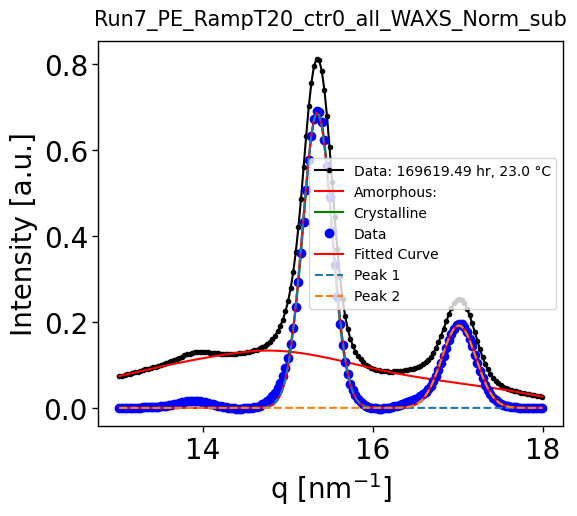

[ 0.68660148 15.34518914  0.12265628  0.19180268 17.01218796  0.14203037]
percentage_crytallinity: 47.72 ± 4.02 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT20_ctr0_all_WAXS_Norm_sub.dat_fitted.dat
2
Processing file: Run7_PE_RampT22_ctr1_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169664.5, bstop=6.105003333333333, ctemp=23.33892, I0=20.9714
Fitting 2 peaks with initial guess: [ 0.68660148 15.34518914  0.12265628  0.19180268 17.01218796  0.14203037]
Adjusted initial guess: [0.6909014587131657, 15.337445321513435, 1.0, 0.19575381028716887, 17.01626253341858, 1.1999999999999993]
Attempt 1 with initial guess: [0.6909014587131657, 15.337445321513435, 1.0, 0.19575381028716887, 17.01626253341858, 1.1999999999999993]
Fitted parameters: [ 0.68707691 15.34523432  0.12247772  0.19131675 17.01101301  0.14219155]


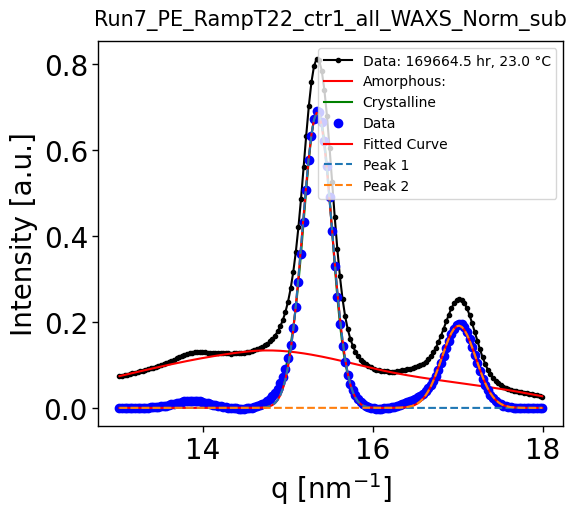

[ 0.68707691 15.34523432  0.12247772  0.19131675 17.01101301  0.14219155]
percentage_crytallinity: 47.55 ± 4.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT22_ctr1_all_WAXS_Norm_sub.dat_fitted.dat
3
Processing file: Run7_PE_RampT25_ctr2_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169740.65333333335, bstop=6.082703333333334, ctemp=28.724680000000003, I0=20.85784
Fitting 2 peaks with initial guess: [ 0.68707691 15.34523432  0.12247772  0.19131675 17.01101301  0.14219155]
Adjusted initial guess: [0.6920638176892631, 15.337445321513435, 1.0, 0.19521787786119874, 17.01626253341858, 1.1999999999999993]
Attempt 1 with initial guess: [0.6920638176892631, 15.337445321513435, 1.0, 0.19521787786119874, 17.01626253341858, 1.1999999999999993]
Fitted parameters: [ 0.68633488 15.33702017  0.12284766  0.19180834 16.99230377  0.14134047]


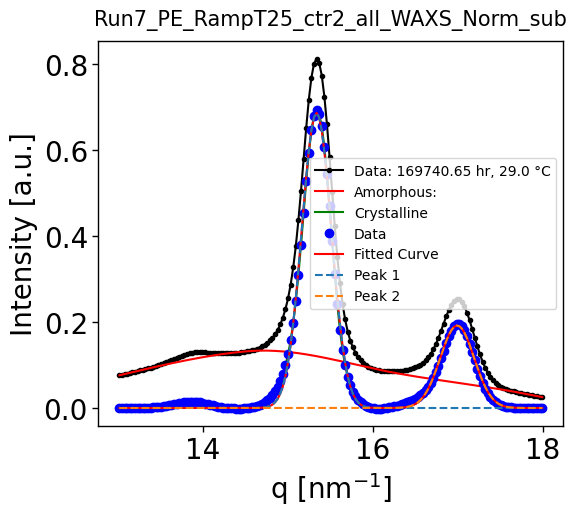

[ 0.68633488 15.33702017  0.12284766  0.19180834 16.99230377  0.14134047]
percentage_crytallinity: 47.40 ± 4.04 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT25_ctr2_all_WAXS_Norm_sub.dat_fitted.dat
4
Processing file: Run7_PE_RampT27_ctr3_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169785.9233333333, bstop=6.117249999999999, ctemp=29.292980333333333, I0=20.971663333333336
Fitting 2 peaks with initial guess: [ 0.68633488 15.33702017  0.12284766  0.19180834 16.99230377  0.14134047]
Adjusted initial guess: [0.6873105405922376, 15.337445321513435, 1.0, 0.19619303333045834, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.6873105405922376, 15.337445321513435, 1.0, 0.19619303333045834, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.68136364 15.33556116  0.12276506  0.1921405  16.98903476  0.14343142]


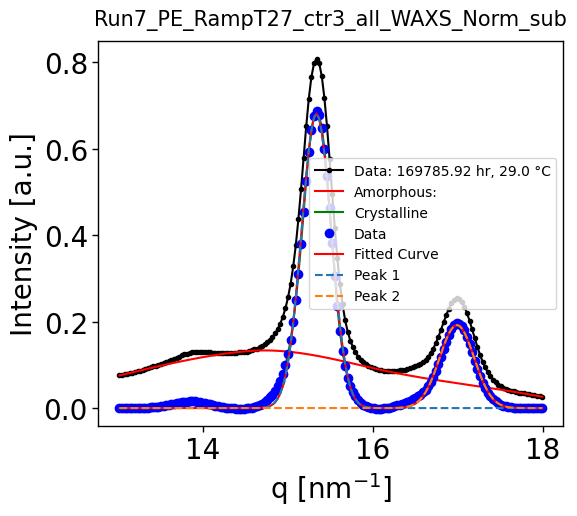

[ 0.68136364 15.33556116  0.12276506  0.1921405  16.98903476  0.14343142]
percentage_crytallinity: 47.51 ± 4.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT27_ctr3_all_WAXS_Norm_sub.dat_fitted.dat
5
Processing file: Run7_PE_RampT30_ctr4_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169857.6433333333, bstop=6.135423333333333, ctemp=33.402396, I0=21.03764
Fitting 2 peaks with initial guess: [ 0.68136364 15.33556116  0.12276506  0.1921405  16.98903476  0.14343142]
Adjusted initial guess: [0.68323383759317, 15.337445321513435, 1.0, 0.19340589010317866, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.68323383759317, 15.337445321513435, 1.0, 0.19340589010317866, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.67833023 15.32895878  0.12227691  0.18901145 16.9705376   0.14450326]


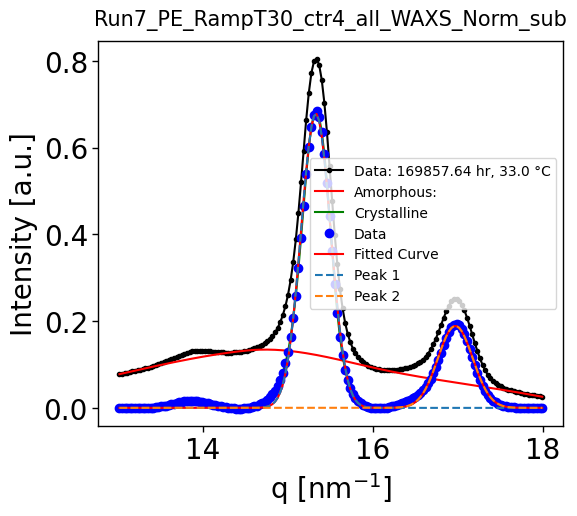

[ 0.67833023 15.32895878  0.12227691  0.18901145 16.9705376   0.14450326]
percentage_crytallinity: 47.15 ± 3.99 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT30_ctr4_all_WAXS_Norm_sub.dat_fitted.dat
6
Processing file: Run7_PE_RampT32_ctr5_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169902.64, bstop=6.122036666666666, ctemp=33.710713999999996, I0=21.00874333333333
Fitting 2 peaks with initial guess: [ 0.67833023 15.32895878  0.12227691  0.18901145 16.9705376   0.14450326]
Adjusted initial guess: [0.6862590242945442, 15.337445321513435, 1.0, 0.19277245271872423, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.6862590242945442, 15.337445321513435, 1.0, 0.19277245271872423, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.68090391 15.3280422   0.12280194  0.18857124 16.9675605   0.14280197]


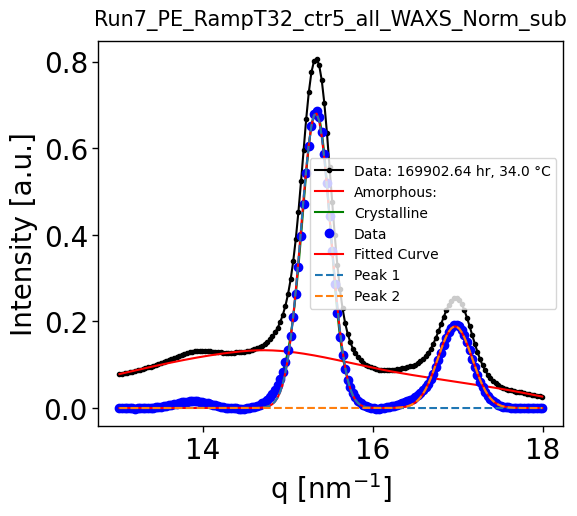

[ 0.68090391 15.3280422   0.12280194  0.18857124 16.9675605   0.14280197]
percentage_crytallinity: 47.02 ± 3.98 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT32_ctr5_all_WAXS_Norm_sub.dat_fitted.dat
7
Processing file: Run7_PE_RampT35_ctr6_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=169977.01, bstop=6.105323333333334, ctemp=38.40748333333334, I0=20.935386666666666
Fitting 2 peaks with initial guess: [ 0.68090391 15.3280422   0.12280194  0.18857124 16.9675605   0.14280197]
Adjusted initial guess: [0.6809817357284444, 15.337445321513435, 1.0, 0.19153995296463844, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.6809817357284444, 15.337445321513435, 1.0, 0.19153995296463844, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.67727814 15.32080717  0.12247801  0.18745362 16.94861108  0.14173552]


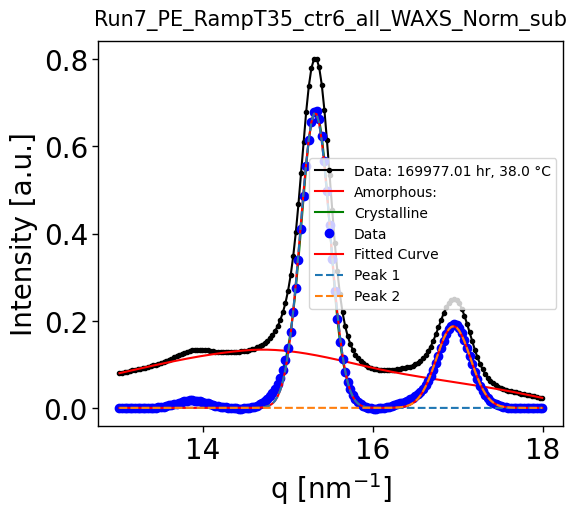

[ 0.67727814 15.32080717  0.12247801  0.18745362 16.94861108  0.14173552]
percentage_crytallinity: 46.95 ± 4.04 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT35_ctr6_all_WAXS_Norm_sub.dat_fitted.dat
8
Processing file: Run7_PE_RampT37_ctr7_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170022.05999999997, bstop=6.097713333333334, ctemp=38.28417833333333, I0=20.892516666666666
Fitting 2 peaks with initial guess: [ 0.67727814 15.32080717  0.12247801  0.18745362 16.94861108  0.14173552]
Adjusted initial guess: [0.6799070021608747, 15.337445321513435, 1.0, 0.19088886227079416, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.6799070021608747, 15.337445321513435, 1.0, 0.19088886227079416, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.67676794 15.32047581  0.12217863  0.18640908 16.94532256  0.14358832]


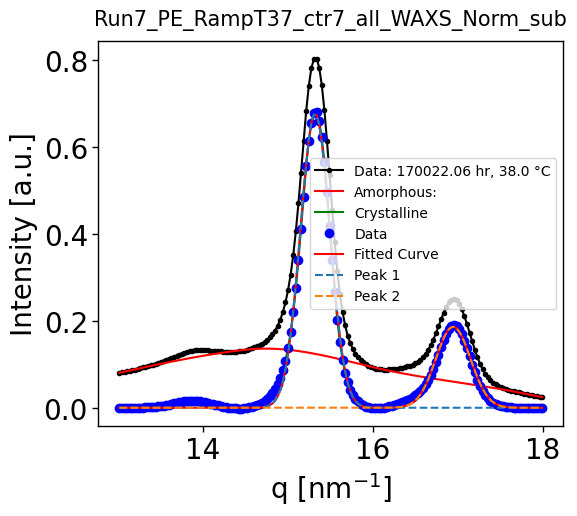

[ 0.67676794 15.32047581  0.12217863  0.18640908 16.94532256  0.14358832]
percentage_crytallinity: 46.67 ± 4.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT37_ctr7_all_WAXS_Norm_sub.dat_fitted.dat
9
Processing file: Run7_PE_RampT40_ctr8_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170104.51333333334, bstop=6.149440000000001, ctemp=43.30892933333334, I0=21.076883333333335
Fitting 2 peaks with initial guess: [ 0.67676794 15.32047581  0.12217863  0.18640908 16.94532256  0.14358832]
Adjusted initial guess: [0.6709008016183284, 15.306921372206068, 1.0, 0.1892846590194854, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6709008016183284, 15.306921372206068, 1.0, 0.1892846590194854, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.66708868 15.31316313  0.12213587  0.1856018  16.9237482   0.14250568]


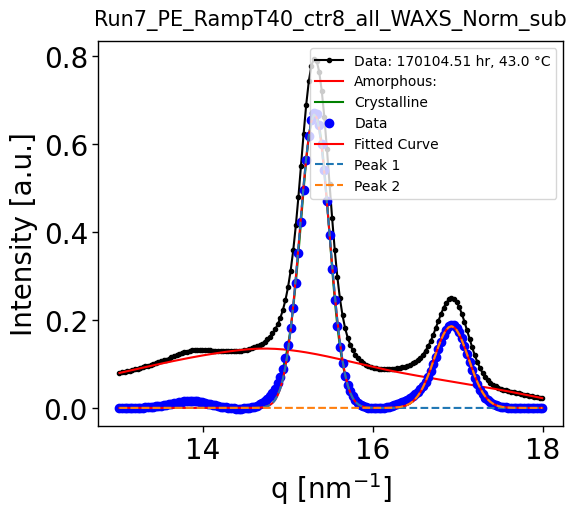

[ 0.66708868 15.31316313  0.12213587  0.1856018  16.9237482   0.14250568]
percentage_crytallinity: 46.52 ± 4.02 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT40_ctr8_all_WAXS_Norm_sub.dat_fitted.dat
10
Processing file: Run7_PE_RampT42_ctr9_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170148.93666666668, bstop=6.14104, ctemp=42.773029333333334, I0=21.052503333333334
Fitting 2 peaks with initial guess: [ 0.66708868 15.31316313  0.12213587  0.1856018  16.9237482   0.14250568]
Adjusted initial guess: [0.6723010941817693, 15.306921372206068, 1.0, 0.18921393373054265, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6723010941817693, 15.306921372206068, 1.0, 0.18921393373054265, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.66845742 15.31336699  0.12203477  0.18529186 16.92312722  0.14355079]


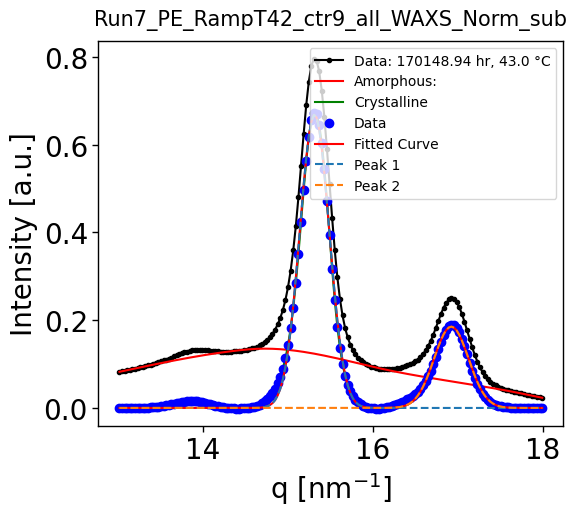

[ 0.66845742 15.31336699  0.12203477  0.18529186 16.92312722  0.14355079]
percentage_crytallinity: 46.34 ± 3.99 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT42_ctr9_all_WAXS_Norm_sub.dat_fitted.dat
11
Processing file: Run7_PE_RampT45_ctr10_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170222.68, bstop=6.1225, ctemp=48.113457000000004, I0=20.974663333333332
Fitting 2 peaks with initial guess: [ 0.66845742 15.31336699  0.12203477  0.18529186 16.92312722  0.14355079]
Adjusted initial guess: [0.6718578550904287, 15.306921372206068, 1.0, 0.18708096200426888, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.6718578550904287, 15.306921372206068, 1.0, 0.18708096200426888, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.66646602 15.30530619  0.12240689  0.18375253 16.89839451  0.14276871]


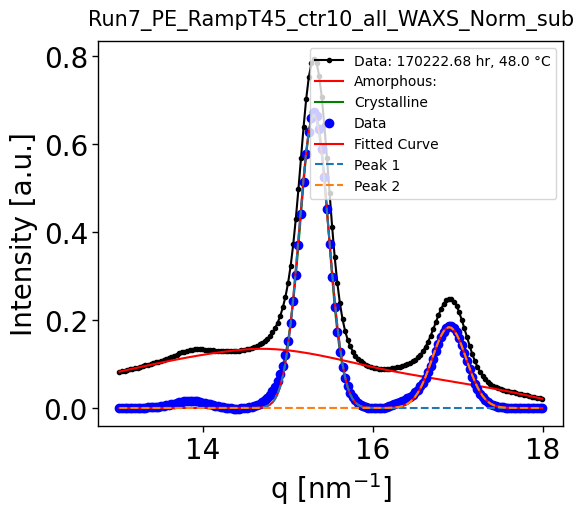

[ 0.66646602 15.30530619  0.12240689  0.18375253 16.89839451  0.14276871]
percentage_crytallinity: 46.38 ± 4.03 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT45_ctr10_all_WAXS_Norm_sub.dat_fitted.dat
12
Processing file: Run7_PE_RampT47_ctr11_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170266.80999999997, bstop=6.114033333333334, ctemp=47.45837366666666, I0=20.95266666666667
Fitting 2 peaks with initial guess: [ 0.66646602 15.30530619  0.12240689  0.18375253 16.89839451  0.14276871]
Adjusted initial guess: [0.6737420956619007, 15.306921372206068, 1.0, 0.18734759582244273, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6737420956619007, 15.306921372206068, 1.0, 0.18734759582244273, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.66836701 15.30627012  0.12244723  0.18418481 16.8994079   0.1422787 ]


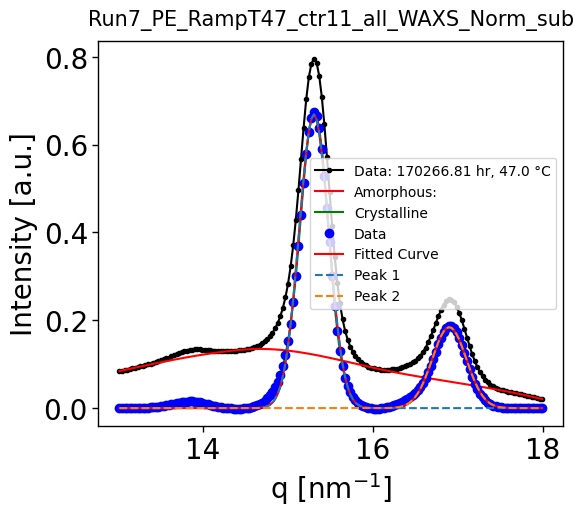

[ 0.66836701 15.30627012  0.12244723  0.18418481 16.8994079   0.1422787 ]
percentage_crytallinity: 46.41 ± 4.04 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT47_ctr11_all_WAXS_Norm_sub.dat_fitted.dat
13
Processing file: Run7_PE_RampT50_ctr12_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170326.75666666668, bstop=6.098033333333333, ctemp=50.734487, I0=20.872153333333333
Fitting 2 peaks with initial guess: [ 0.66836701 15.30627012  0.12244723  0.18418481 16.8994079   0.1422787 ]
Adjusted initial guess: [0.6730491540672889, 15.306921372206068, 1.0, 0.18868458989534703, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.6730491540672889, 15.306921372206068, 1.0, 0.18868458989534703, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.66805031 15.30068037  0.12227402  0.18453097 16.8841883   0.14281018]


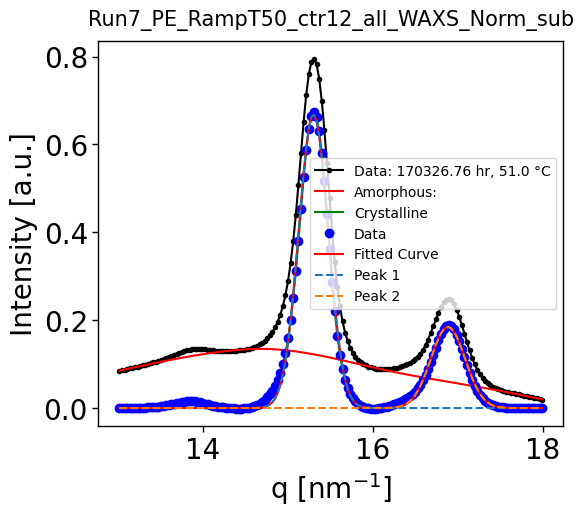

[ 0.66805031 15.30068037  0.12227402  0.18453097 16.8841883   0.14281018]
percentage_crytallinity: 46.42 ± 4.06 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT50_ctr12_all_WAXS_Norm_sub.dat_fitted.dat
14
Processing file: Run7_PE_RampT52_ctr13_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170407.21, bstop=6.158873333333333, ctemp=55.34498966666666, I0=21.115859999999998
Fitting 2 peaks with initial guess: [ 0.66805031 15.30068037  0.12227402  0.18453097 16.8841883   0.14281018]
Adjusted initial guess: [0.661288681794442, 15.306921372206068, 1.0, 0.18467059881108222, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.661288681794442, 15.306921372206068, 1.0, 0.18467059881108222, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.6575474  15.29402456  0.12213131  0.18095045 16.86040227  0.14293757]


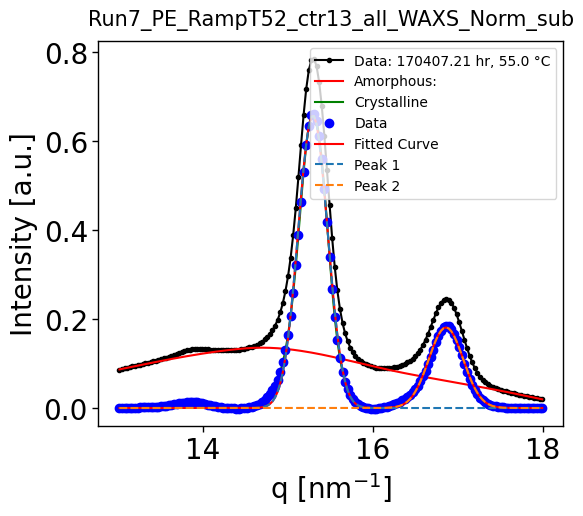

[ 0.6575474  15.29402456  0.12213131  0.18095045 16.86040227  0.14293757]
percentage_crytallinity: 45.80 ± 4.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT52_ctr13_all_WAXS_Norm_sub.dat_fitted.dat
15
Processing file: Run7_PE_RampT55_ctr14_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170452.27666666667, bstop=6.149746666666668, ctemp=55.148865, I0=21.046533333333333
Fitting 2 peaks with initial guess: [ 0.6575474  15.29402456  0.12213131  0.18095045 16.86040227  0.14293757]
Adjusted initial guess: [0.6700251922713162, 15.306921372206068, 1.0, 0.18915335020831045, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6700251922713162, 15.306921372206068, 1.0, 0.18915335020831045, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.66532529 15.29409984  0.12218901  0.18541779 16.86151235  0.14299245]


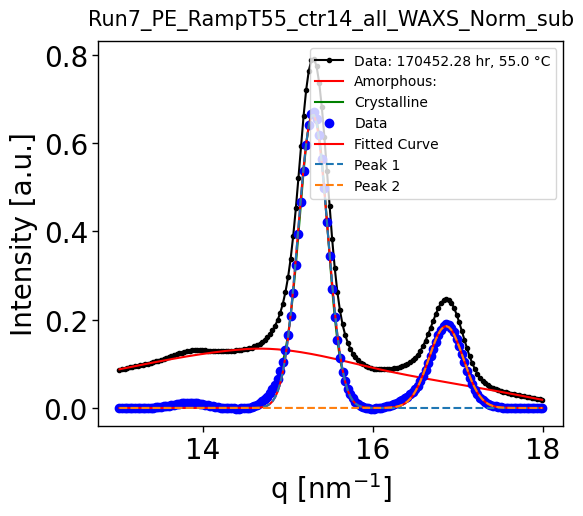

[ 0.66532529 15.29409984  0.12218901  0.18541779 16.86151235  0.14299245]
percentage_crytallinity: 46.47 ± 4.05 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT55_ctr14_all_WAXS_Norm_sub.dat_fitted.dat
16
Processing file: Run7_PE_RampT57_ctr15_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170503.70333333334, bstop=6.132446666666667, ctemp=57.56532666666667, I0=20.97945
Fitting 2 peaks with initial guess: [ 0.66532529 15.29409984  0.12218901  0.18541779 16.86151235  0.14299245]
Adjusted initial guess: [0.6702893307940839, 15.306921372206068, 1.0, 0.18798668112092204, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6702893307940839, 15.306921372206068, 1.0, 0.18798668112092204, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.66710959 15.29039037  0.12187789  0.18431979 16.84641527  0.14381601]


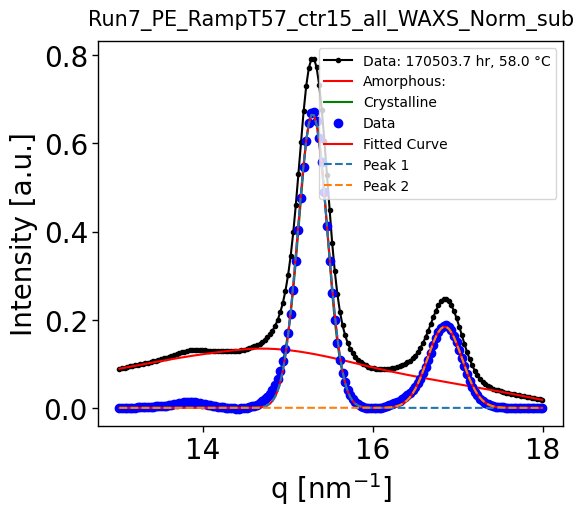

[ 0.66710959 15.29039037  0.12187789  0.18431979 16.84641527  0.14381601]
percentage_crytallinity: 46.48 ± 4.06 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT57_ctr15_all_WAXS_Norm_sub.dat_fitted.dat
17
Processing file: Run7_PE_RampT60_ctr16_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170576.15333333332, bstop=6.115553333333334, ctemp=62.55229566666667, I0=20.88702333333333
Fitting 2 peaks with initial guess: [ 0.66710959 15.29039037  0.12187789  0.18431979 16.84641527  0.14381601]
Adjusted initial guess: [0.6789451102967815, 15.2763974228987, 1.0, 0.19148811531456345, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.6789451102967815, 15.2763974228987, 1.0, 0.19148811531456345, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [ 0.67496801 15.28275509  0.12169033  0.18768347 16.82169143  0.14330021]


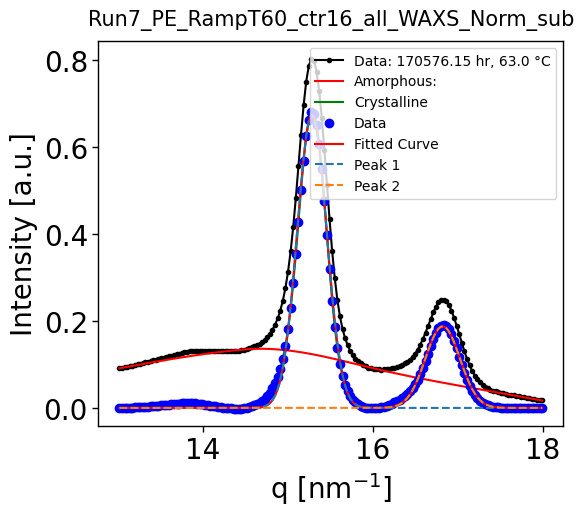

[ 0.67496801 15.28275509  0.12169033  0.18768347 16.82169143  0.14330021]
percentage_crytallinity: 46.74 ± 4.07 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT60_ctr16_all_WAXS_Norm_sub.dat_fitted.dat
18
Processing file: Run7_PE_RampT62_ctr17_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170621.05666666667, bstop=6.108123333333334, ctemp=62.43059433333334, I0=20.857853333333335
Fitting 2 peaks with initial guess: [ 0.67496801 15.28275509  0.12169033  0.18768347 16.82169143  0.14330021]
Adjusted initial guess: [0.6856412960634071, 15.2763974228987, 1.0, 0.1932195245470882, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.6856412960634071, 15.2763974228987, 1.0, 0.1932195245470882, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [ 0.68193346 15.28298806  0.12164528  0.18914913 16.82139882  0.14354798]


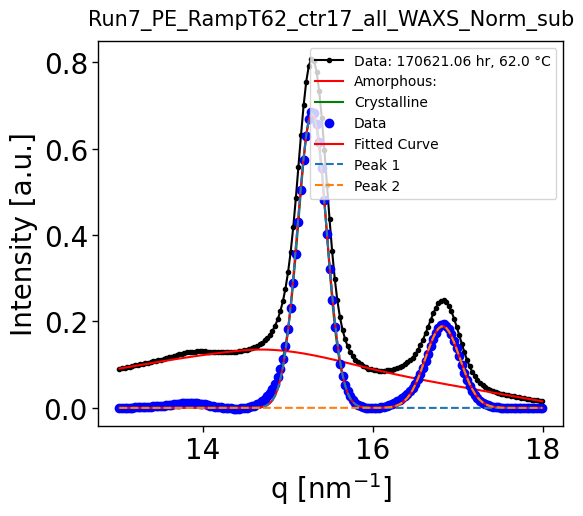

[ 0.68193346 15.28298806  0.12164528  0.18914913 16.82139882  0.14354798]
percentage_crytallinity: 47.32 ± 4.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT62_ctr17_all_WAXS_Norm_sub.dat_fitted.dat
19
Processing file: Run7_PE_RampT65_ctr18_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170670.41666666666, bstop=6.107896666666666, ctemp=64.80741633333332, I0=20.835113333333336
Fitting 2 peaks with initial guess: [ 0.68193346 15.28298806  0.12164528  0.18914913 16.82139882  0.14354798]
Adjusted initial guess: [0.6912408078937465, 15.2763974228987, 1.0, 0.19216686502787358, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.6912408078937465, 15.2763974228987, 1.0, 0.19216686502787358, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.68706969 15.27874866  0.12096998  0.18930609 16.80615716  0.14297333]


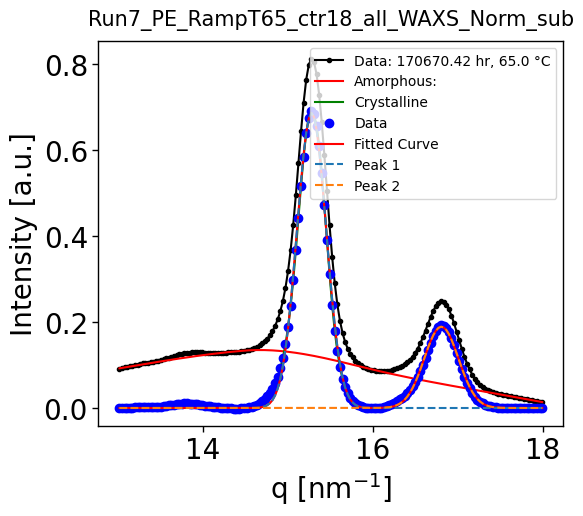

[ 0.68706969 15.27874866  0.12096998  0.18930609 16.80615716  0.14297333]
percentage_crytallinity: 47.26 ± 4.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT65_ctr18_all_WAXS_Norm_sub.dat_fitted.dat
20
Processing file: Run7_PE_RampT67_ctr19_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170738.87, bstop=6.141256666666666, ctemp=69.75322433333334, I0=20.99341
Fitting 2 peaks with initial guess: [ 0.68706969 15.27874866  0.12096998  0.18930609 16.80615716  0.14297333]
Adjusted initial guess: [0.6923398881845296, 15.2763974228987, 1.0, 0.19100609692964005, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.6923398881845296, 15.2763974228987, 1.0, 0.19100609692964005, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.68758994 15.27128055  0.1210675   0.18830134 16.78130745  0.14108153]


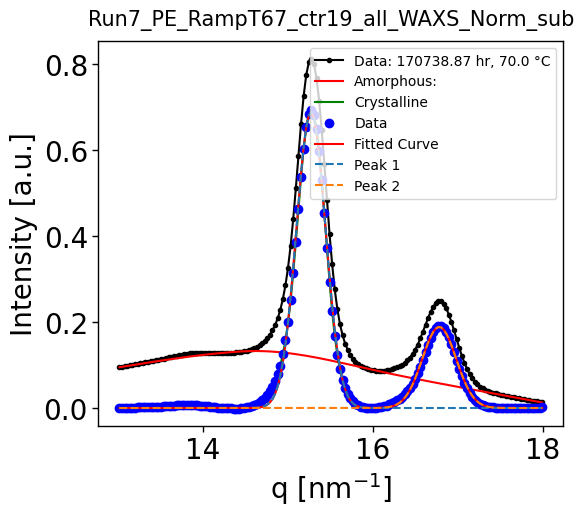

[ 0.68758994 15.27128055  0.1210675   0.18830134 16.78130745  0.14108153]
percentage_crytallinity: 47.35 ± 4.10 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT67_ctr19_all_WAXS_Norm_sub.dat_fitted.dat
21
Processing file: Run7_PE_RampT70_ctr20_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170818.94000000003, bstop=6.118473333333333, ctemp=72.22266666666667, I0=20.91987333333333
Fitting 2 peaks with initial guess: [ 0.68758994 15.27128055  0.1210675   0.18830134 16.78130745  0.14108153]
Adjusted initial guess: [0.7004206210167234, 15.2763974228987, 1.0, 0.19725902329053766, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.7004206210167234, 15.2763974228987, 1.0, 0.19725902329053766, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.69676487 15.26750233  0.1200172   0.19380321 16.76674816  0.14252019]


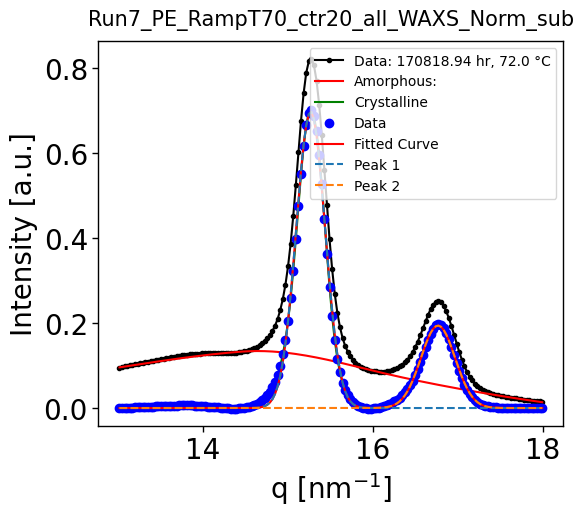

[ 0.69676487 15.26750233  0.1200172   0.19380321 16.76674816  0.14252019]
percentage_crytallinity: 47.73 ± 4.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT70_ctr20_all_WAXS_Norm_sub.dat_fitted.dat
22
Processing file: Run7_PE_RampT72_ctr21_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170899.0166666667, bstop=6.098956666666666, ctemp=74.645917, I0=20.815436666666667
Fitting 2 peaks with initial guess: [ 0.69676487 15.26750233  0.1200172   0.19380321 16.76674816  0.14252019]
Adjusted initial guess: [0.7080001527460612, 15.2763974228987, 1.0, 0.1982630697323103, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.7080001527460612, 15.2763974228987, 1.0, 0.1982630697323103, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.70470384 15.26527264  0.11979253  0.19521206 16.75427105  0.14168651]


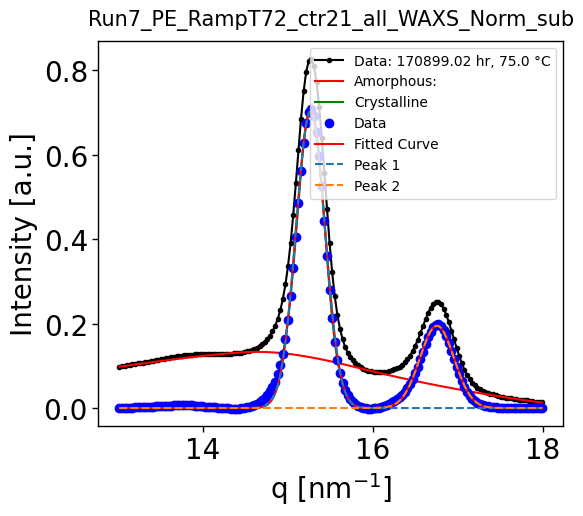

[ 0.70470384 15.26527264  0.11979253  0.19521206 16.75427105  0.14168651]
percentage_crytallinity: 48.10 ± 4.15 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT72_ctr21_all_WAXS_Norm_sub.dat_fitted.dat
23
Processing file: Run7_PE_RampT75_ctr22_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=170979.46, bstop=6.111483333333333, ctemp=77.09877266666666, I0=20.8267
Fitting 2 peaks with initial guess: [ 0.70470384 15.26527264  0.11979253  0.19521206 16.75427105  0.14168651]
Adjusted initial guess: [0.7116356355911588, 15.2763974228987, 1.0, 0.19876101565450313, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.7116356355911588, 15.2763974228987, 1.0, 0.19876101565450313, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.71027408 15.2599849   0.11911442  0.19592516 16.73817039  0.1402404 ]


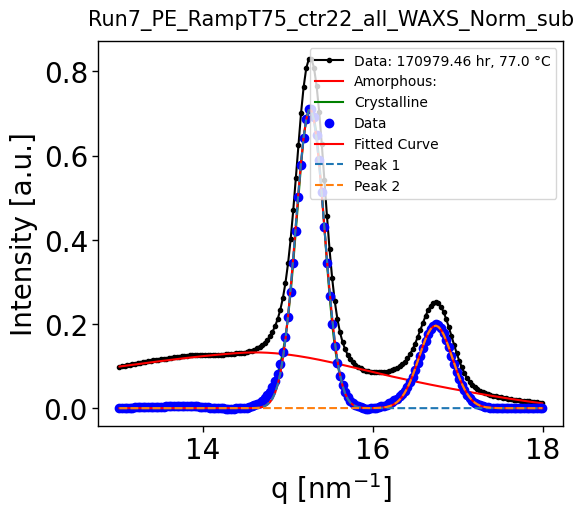

[ 0.71027408 15.2599849   0.11911442  0.19592516 16.73817039  0.1402404 ]
percentage_crytallinity: 48.24 ± 4.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT75_ctr22_all_WAXS_Norm_sub.dat_fitted.dat
24
Processing file: Run7_PE_RampT77_ctr23_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171061.97, bstop=6.153363333333334, ctemp=79.50071233333334, I0=20.986966666666664
Fitting 2 peaks with initial guess: [ 0.71027408 15.2599849   0.11911442  0.19592516 16.73817039  0.1402404 ]
Adjusted initial guess: [0.7086142061720727, 15.2763974228987, 1.0, 0.19781745983993715, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.7086142061720727, 15.2763974228987, 1.0, 0.19781745983993715, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.70832455 15.25797925  0.11845493  0.19541597 16.72618609  0.13997043]


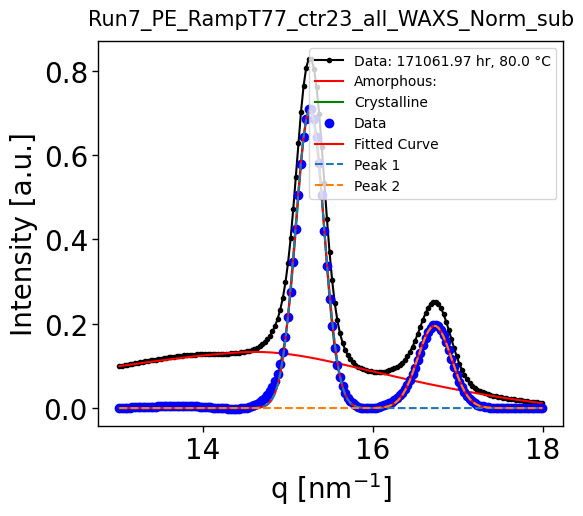

[ 0.70832455 15.25797925  0.11845493  0.19541597 16.72618609  0.13997043]
percentage_crytallinity: 47.88 ± 4.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT77_ctr23_all_WAXS_Norm_sub.dat_fitted.dat
25
Processing file: Run7_PE_RampT80_ctr24_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171145.66333333336, bstop=6.132556666666667, ctemp=81.918274, I0=20.86742333333333
Fitting 2 peaks with initial guess: [ 0.70832455 15.25797925  0.11845493  0.19541597 16.72618609  0.13997043]
Adjusted initial guess: [0.7172720943334542, 15.245873473591335, 1.0, 0.1976025764202063, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.7172720943334542, 15.245873473591335, 1.0, 0.1976025764202063, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.71688168 15.25508076  0.11781783  0.19503966 16.71326395  0.13831835]


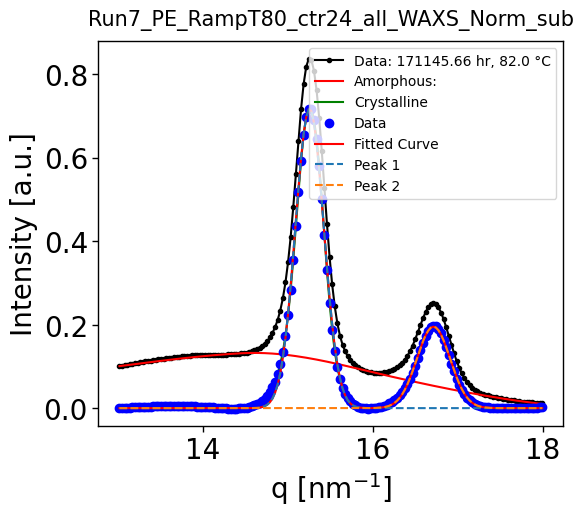

[ 0.71688168 15.25508076  0.11781783  0.19503966 16.71326395  0.13831835]
percentage_crytallinity: 48.15 ± 4.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT80_ctr24_all_WAXS_Norm_sub.dat_fitted.dat
26
Processing file: Run7_PE_RampT82_ctr25_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171232.22, bstop=6.108846666666667, ctemp=84.335126, I0=20.794539999999998
Fitting 2 peaks with initial guess: [ 0.71688168 15.25508076  0.11781783  0.19503966 16.71326395  0.13831835]
Adjusted initial guess: [0.7228026648196484, 15.245873473591335, 1.0, 0.20049008905092494, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.7228026648196484, 15.245873473591335, 1.0, 0.20049008905092494, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.72153032 15.24967203  0.11695048  0.1978922  16.6952486   0.13911254]


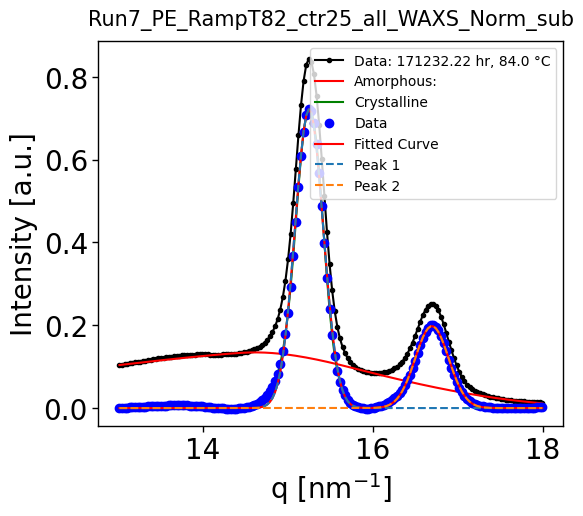

[ 0.72153032 15.24967203  0.11695048  0.1978922  16.6952486   0.13911254]
percentage_crytallinity: 48.28 ± 4.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT82_ctr25_all_WAXS_Norm_sub.dat_fitted.dat
27
Processing file: Run7_PE_RampT85_ctr26_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171319.19666666666, bstop=6.167433333333332, ctemp=86.746602, I0=20.979803333333333
Fitting 2 peaks with initial guess: [ 0.72153032 15.24967203  0.11695048  0.1978922  16.6952486   0.13911254]
Adjusted initial guess: [0.7204560555160936, 15.245873473591335, 1.0, 0.19565859130897037, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.7204560555160936, 15.245873473591335, 1.0, 0.19565859130897037, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.71935561 15.24604282  0.11633583  0.19353282 16.68124503  0.13802615]


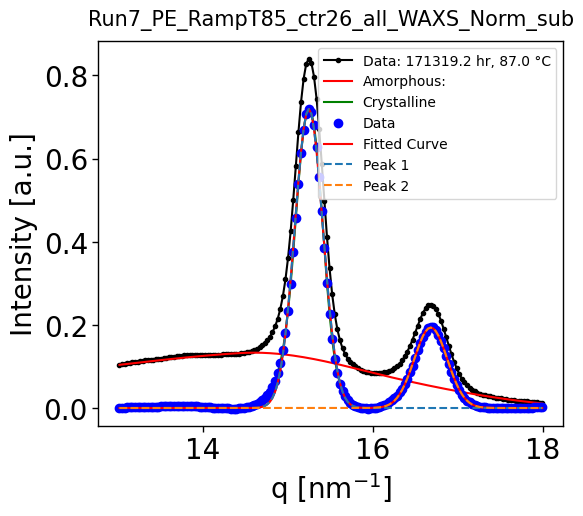

[ 0.71935561 15.24604282  0.11633583  0.19353282 16.68124503  0.13802615]
percentage_crytallinity: 47.86 ± 4.15 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT85_ctr26_all_WAXS_Norm_sub.dat_fitted.dat
28
Processing file: Run7_PE_RampT87_ctr27_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171407.45333333334, bstop=6.1397466666666665, ctemp=89.124326, I0=20.914023333333333
Fitting 2 peaks with initial guess: [ 0.71935561 15.24604282  0.11633583  0.19353282 16.68124503  0.13802615]
Adjusted initial guess: [0.7238112069315963, 15.245873473591335, 1.0, 0.19794772452081028, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.7238112069315963, 15.245873473591335, 1.0, 0.19794772452081028, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.72257395 15.24246383  0.11600792  0.19619535 16.66744096  0.13655341]


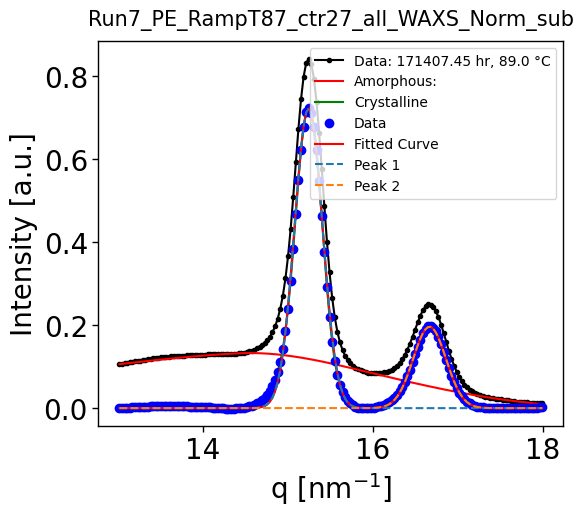

[ 0.72257395 15.24246383  0.11600792  0.19619535 16.66744096  0.13655341]
percentage_crytallinity: 48.07 ± 4.19 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT87_ctr27_all_WAXS_Norm_sub.dat_fitted.dat
29
Processing file: Run7_PE_RampT90_ctr28_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171496.07333333333, bstop=6.117173333333334, ctemp=91.56876866666666, I0=20.818369999999998
Fitting 2 peaks with initial guess: [ 0.72257395 15.24246383  0.11600792  0.19619535 16.66744096  0.13655341]
Adjusted initial guess: [0.7268299354759041, 15.245873473591335, 1.0, 0.1956491596633878, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.7268299354759041, 15.245873473591335, 1.0, 0.1956491596633878, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.72622982 15.2385389   0.11534244  0.19349813 16.65100877  0.13699948]


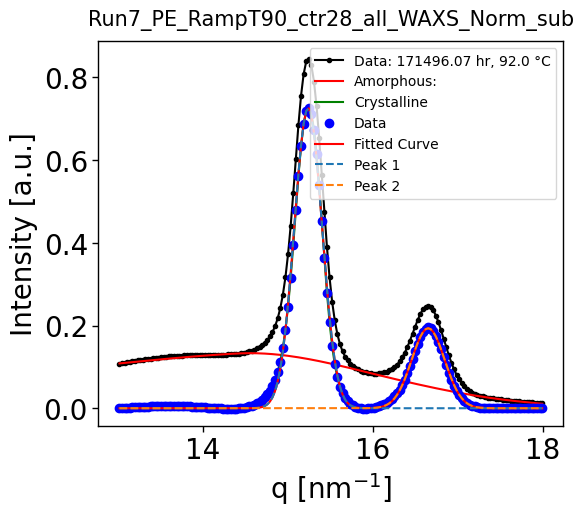

[ 0.72622982 15.2385389   0.11534244  0.19349813 16.65100877  0.13699948]
percentage_crytallinity: 47.92 ± 4.21 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT90_ctr28_all_WAXS_Norm_sub.dat_fitted.dat
30
Processing file: Run7_PE_RampT92_ctr29_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171586.22333333336, bstop=6.144593333333333, ctemp=94.01152533333334, I0=20.888923333333334
Fitting 2 peaks with initial guess: [ 0.72622982 15.2385389   0.11534244  0.19349813 16.65100877  0.13699948]
Adjusted initial guess: [0.7242076363186345, 15.245873473591335, 1.0, 0.19591806695704955, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.7242076363186345, 15.245873473591335, 1.0, 0.19591806695704955, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.72472506 15.23496754  0.1146683   0.19379936 16.6369521   0.13646951]


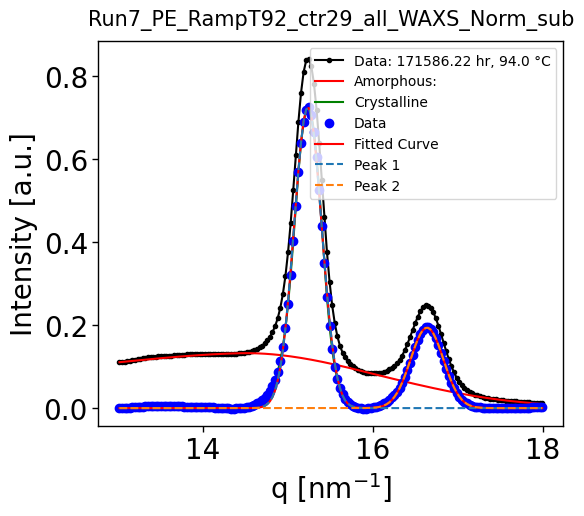

[ 0.72472506 15.23496754  0.1146683   0.19379936 16.6369521   0.13646951]
percentage_crytallinity: 47.90 ± 4.21 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT92_ctr29_all_WAXS_Norm_sub.dat_fitted.dat
31
Processing file: Run7_PE_RampT95_ctr30_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171678.09, bstop=6.14671, ctemp=96.33691433333333, I0=20.86594
Fitting 2 peaks with initial guess: [ 0.72472506 15.23496754  0.1146683   0.19379936 16.6369521   0.13646951]
Adjusted initial guess: [0.7238619091370475, 15.245873473591335, 1.0, 0.19357792517109135, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.7238619091370475, 15.245873473591335, 1.0, 0.19357792517109135, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.72527925 15.2324312   0.11432736  0.1916056  16.62226755  0.13562549]


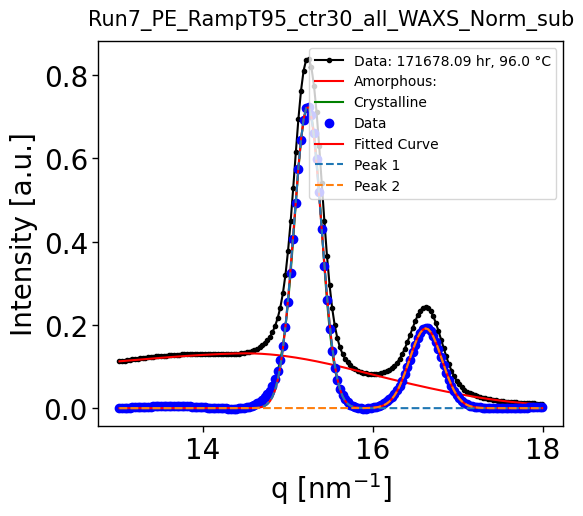

[ 0.72527925 15.2324312   0.11432736  0.1916056  16.62226755  0.13562549]
percentage_crytallinity: 48.05 ± 4.28 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT95_ctr30_all_WAXS_Norm_sub.dat_fitted.dat
32
Processing file: Run7_PE_RampT97_ctr31_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171770.02, bstop=6.1228066666666665, ctemp=98.75475333333334, I0=20.769343333333335
Fitting 2 peaks with initial guess: [ 0.72527925 15.2324312   0.11432736  0.1916056  16.62226755  0.13562549]
Adjusted initial guess: [0.7212385697686822, 15.245873473591335, 1.0, 0.19241758488160815, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.7212385697686822, 15.245873473591335, 1.0, 0.19241758488160815, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.72471307 15.22866093  0.11359397  0.19093989 16.60747114  0.13456186]


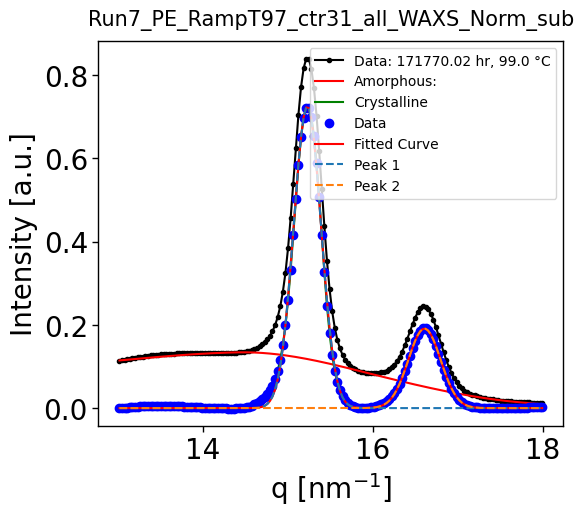

[ 0.72471307 15.22866093  0.11359397  0.19093989 16.60747114  0.13456186]
percentage_crytallinity: 47.48 ± 4.27 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT97_ctr31_all_WAXS_Norm_sub.dat_fitted.dat
33
Processing file: Run7_PE_RampT100_ctr32_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171863.18, bstop=6.10043, ctemp=101.17446666666666, I0=20.687223333333336
Fitting 2 peaks with initial guess: [ 0.72471307 15.22866093  0.11359397  0.19093989 16.60747114  0.13456186]
Adjusted initial guess: [0.7228522281687354, 15.215349524283969, 1.0, 0.18924956838488516, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.7228522281687354, 15.215349524283969, 1.0, 0.18924956838488516, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.72610126 15.22615776  0.112864    0.18726685 16.59058196  0.13436925]


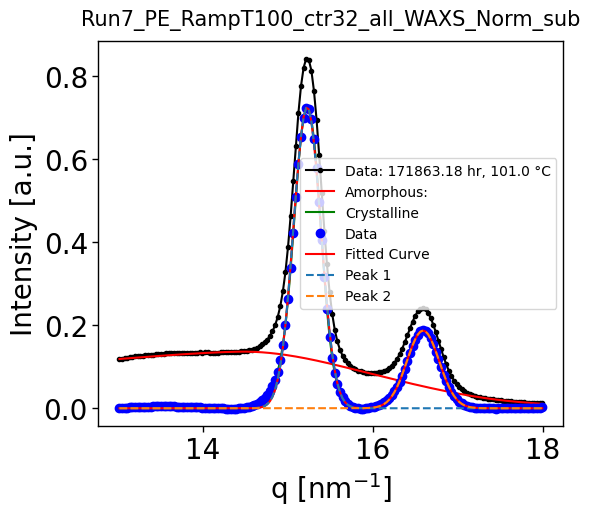

[ 0.72610126 15.22615776  0.112864    0.18726685 16.59058196  0.13436925]
percentage_crytallinity: 46.72 ± 4.25 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT100_ctr32_all_WAXS_Norm_sub.dat_fitted.dat
34
Processing file: Run7_PE_RampT102_ctr33_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=171955.87666666668, bstop=6.15647, ctemp=103.5872, I0=20.91862666666667
Fitting 2 peaks with initial guess: [ 0.72610126 15.22615776  0.112864    0.18726685 16.59058196  0.13436925]
Adjusted initial guess: [0.7097047281931609, 15.215349524283969, 1.0, 0.18420008413416536, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.7097047281931609, 15.215349524283969, 1.0, 0.18420008413416536, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.71269125 15.22301342  0.11201174  0.18242486 16.5763281   0.13437254]


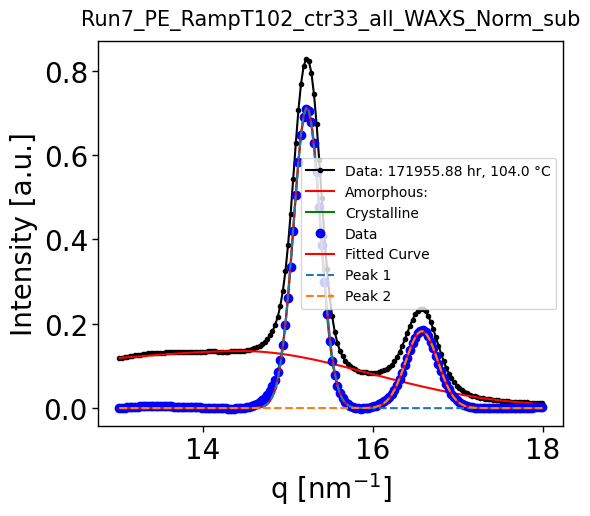

[ 0.71269125 15.22301342  0.11201174  0.18242486 16.5763281   0.13437254]
percentage_crytallinity: 46.40 ± 4.27 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT102_ctr33_all_WAXS_Norm_sub.dat_fitted.dat
35
Processing file: Run7_PE_RampT105_ctr34_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172048.84, bstop=6.1324700000000005, ctemp=106.00106666666666, I0=20.803906666666666
Fitting 2 peaks with initial guess: [ 0.71269125 15.22301342  0.11201174  0.18242486 16.5763281   0.13437254]
Adjusted initial guess: [0.7079732166001531, 15.215349524283969, 1.0, 0.18035987456698954, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.7079732166001531, 15.215349524283969, 1.0, 0.18035987456698954, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.71057147 15.22014625  0.11139663  0.17903719 16.56014528  0.13241637]


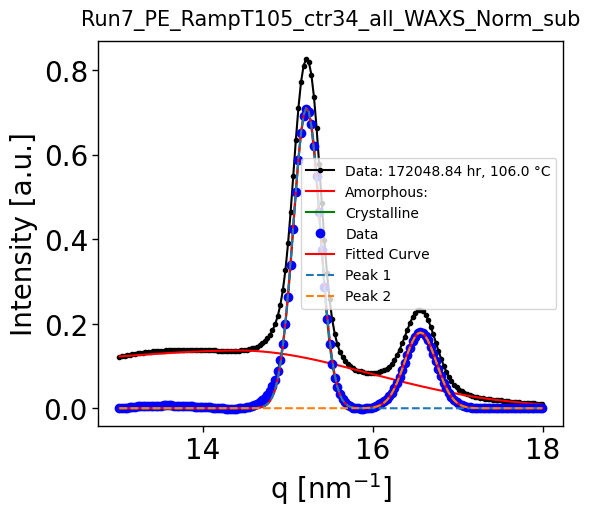

[ 0.71057147 15.22014625  0.11139663  0.17903719 16.56014528  0.13241637]
percentage_crytallinity: 45.91 ± 4.29 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT105_ctr34_all_WAXS_Norm_sub.dat_fitted.dat
36
Processing file: Run7_PE_RampT107_ctr35_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172142.6, bstop=6.110936666666667, ctemp=108.354, I0=20.685306666666666
Fitting 2 peaks with initial guess: [ 0.71057147 15.22014625  0.11139663  0.17903719 16.56014528  0.13241637]
Adjusted initial guess: [0.7063231296451218, 15.215349524283969, 1.0, 0.17498104325425767, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.7063231296451218, 15.215349524283969, 1.0, 0.17498104325425767, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.70912478 15.21740696  0.11062881  0.17416326 16.54585751  0.13301224]


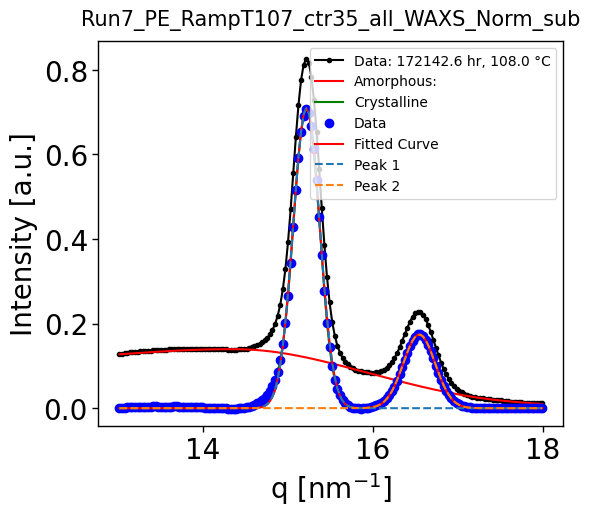

[ 0.70912478 15.21740696  0.11062881  0.17416326 16.54585751  0.13301224]
percentage_crytallinity: 45.13 ± 4.30 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT107_ctr35_all_WAXS_Norm_sub.dat_fitted.dat
37
Processing file: Run7_PE_RampT110_ctr36_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172235.05666666667, bstop=6.169316666666667, ctemp=110.74663333333332, I0=20.900183333333334
Fitting 2 peaks with initial guess: [ 0.70912478 15.21740696  0.11062881  0.17416326 16.54585751  0.13301224]
Adjusted initial guess: [0.6900100837525289, 15.215349524283969, 1.0, 0.16655687976950884, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.6900100837525289, 15.215349524283969, 1.0, 0.16655687976950884, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.6934922  15.2141123   0.10991479  0.1654755  16.52987678  0.13195155]


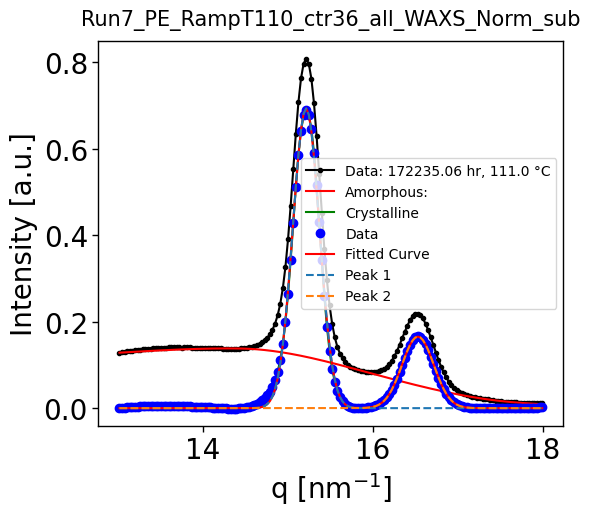

[ 0.6934922  15.2141123   0.10991479  0.1654755  16.52987678  0.13195155]
percentage_crytallinity: 44.57 ± 4.33 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT110_ctr36_all_WAXS_Norm_sub.dat_fitted.dat
38
Processing file: Run7_PE_RampT112_ctr37_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172326.90333333332, bstop=6.1406133333333335, ctemp=113.21303333333333, I0=20.786133333333332
Fitting 2 peaks with initial guess: [ 0.6934922  15.2141123   0.10991479  0.1654755  16.52987678  0.13195155]
Adjusted initial guess: [0.6837211607309364, 15.215349524283969, 1.0, 0.16046649127202597, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.6837211607309364, 15.215349524283969, 1.0, 0.16046649127202597, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.68738551 15.21108114  0.1092908   0.15965187 16.51448269  0.13346509]


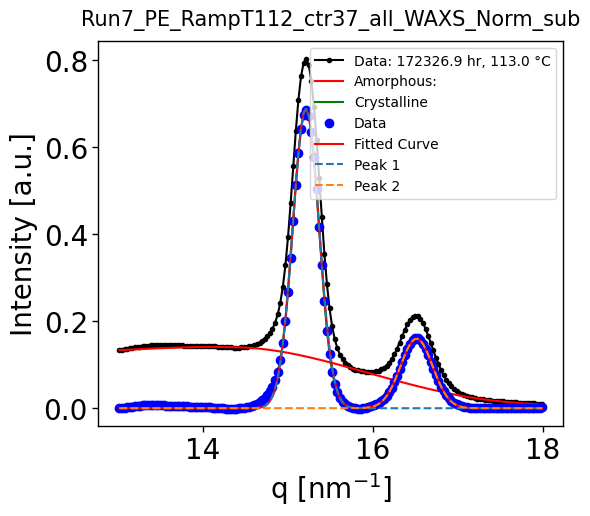

[ 0.68738551 15.21108114  0.1092908   0.15965187 16.51448269  0.13346509]
percentage_crytallinity: 44.09 ± 4.38 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT112_ctr37_all_WAXS_Norm_sub.dat_fitted.dat
39
Processing file: Run7_PE_RampT115_ctr38_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172419.05666666667, bstop=6.122013333333334, ctemp=115.62270000000001, I0=20.671086666666664
Fitting 2 peaks with initial guess: [ 0.68738551 15.21108114  0.1092908   0.15965187 16.51448269  0.13346509]
Adjusted initial guess: [0.6638501097600153, 15.215349524283969, 1.0, 0.15426781366917863, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.6638501097600153, 15.215349524283969, 1.0, 0.15426781366917863, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [ 0.67031564 15.20877753  0.10688701  0.15276866 16.49817071  0.13376691]


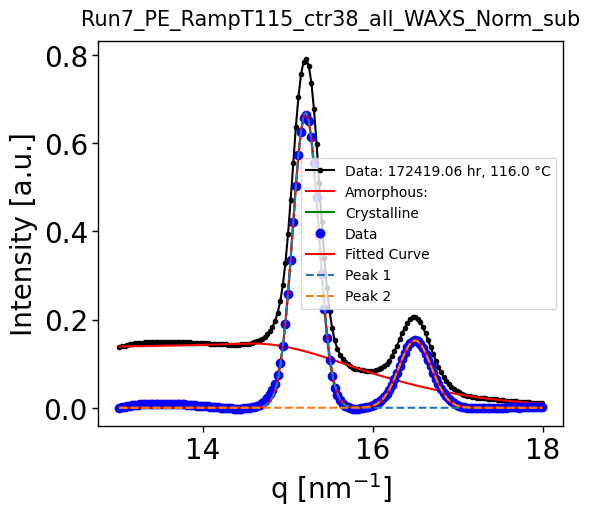

[ 0.67031564 15.20877753  0.10688701  0.15276866 16.49817071  0.13376691]
percentage_crytallinity: 42.11 ± 4.38 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT115_ctr38_all_WAXS_Norm_sub.dat_fitted.dat
40
Processing file: Run7_PE_RampT117_ctr39_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172511.26333333334, bstop=6.17621, ctemp=118.10090000000001, I0=20.888769999999997
Fitting 2 peaks with initial guess: [ 0.67031564 15.20877753  0.10688701  0.15276866 16.49817071  0.13376691]
Adjusted initial guess: [0.6395648105225843, 15.215349524283969, 1.0, 0.14013016063808248, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.6395648105225843, 15.215349524283969, 1.0, 0.14013016063808248, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.64635842 15.20588456  0.1061435   0.1392328  16.4837102   0.13400354]


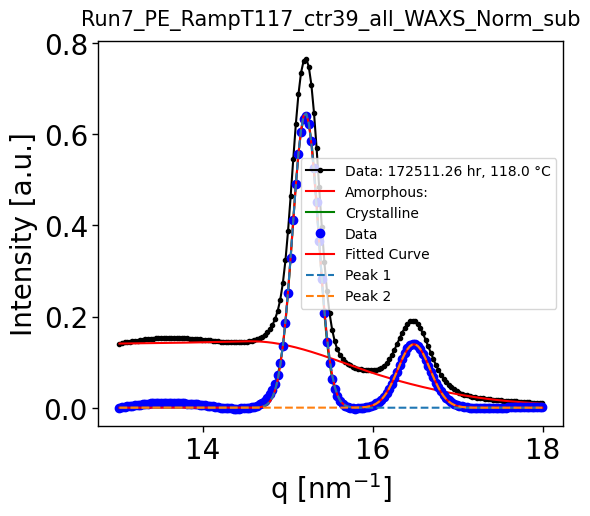

[ 0.64635842 15.20588456  0.1061435   0.1392328  16.4837102   0.13400354]
percentage_crytallinity: 41.08 ± 4.41 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT117_ctr39_all_WAXS_Norm_sub.dat_fitted.dat
41
Processing file: Run7_PE_RampT120_ctr40_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172606.18, bstop=6.14483, ctemp=120.38896666666666, I0=20.760413333333332
Fitting 2 peaks with initial guess: [ 0.64635842 15.20588456  0.1061435   0.1392328  16.4837102   0.13400354]
Adjusted initial guess: [0.6173749143814583, 15.215349524283969, 1.0, 0.13067389732813234, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.6173749143814583, 15.215349524283969, 1.0, 0.13067389732813234, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.62482469 15.20331918  0.10551388  0.13008753 16.47149639  0.13251259]


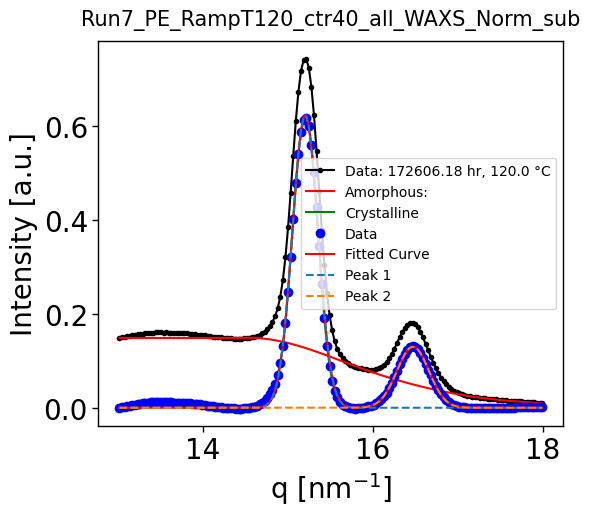

[ 0.62482469 15.20331918  0.10551388  0.13008753 16.47149639  0.13251259]
percentage_crytallinity: 39.52 ± 4.45 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT120_ctr40_all_WAXS_Norm_sub.dat_fitted.dat
42
Processing file: Run7_PE_RampT122_ctr41_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172698.70333333334, bstop=6.123916666666667, ctemp=122.89683333333335, I0=20.71171
Fitting 2 peaks with initial guess: [ 0.62482469 15.20331918  0.10551388  0.13008753 16.47149639  0.13251259]
Adjusted initial guess: [0.5827263150765132, 15.215349524283969, 1.0, 0.11249426263295165, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.5827263150765132, 15.215349524283969, 1.0, 0.11249426263295165, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.59077527 15.19976009  0.10498084  0.11220099 16.46004575  0.13415452]


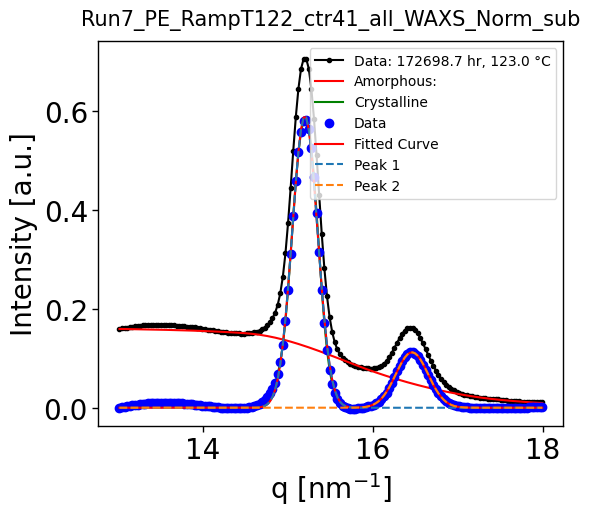

[ 0.59077527 15.19976009  0.10498084  0.11220099 16.46004575  0.13415452]
percentage_crytallinity: 37.33 ± 4.54 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT122_ctr41_all_WAXS_Norm_sub.dat_fitted.dat
43
Processing file: Run7_PE_RampT125_ctr42_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172793.25666666668, bstop=6.163243333333334, ctemp=125.28033333333333, I0=20.79493666666667
Fitting 2 peaks with initial guess: [ 0.59077527 15.19976009  0.10498084  0.11220099 16.46004575  0.13415452]
Adjusted initial guess: [0.5273504591480173, 15.215349524283969, 1.0, 0.09454411559185164, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.5273504591480173, 15.215349524283969, 1.0, 0.09454411559185164, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [ 0.53558536 15.19801537  0.10427556  0.0943935  16.45473382  0.13533023]


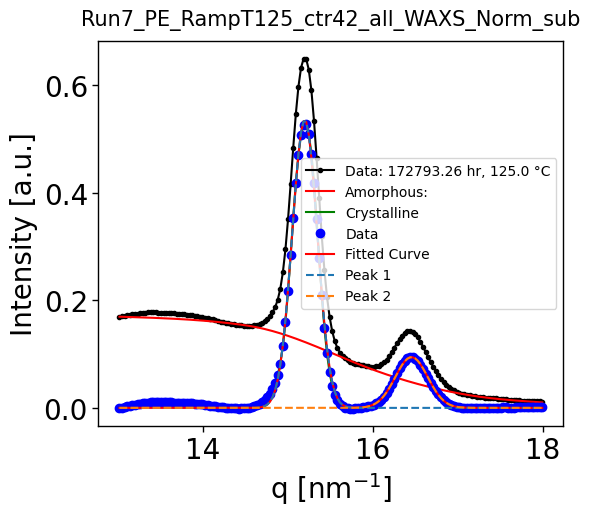

[ 0.53558536 15.19801537  0.10427556  0.0943935  16.45473382  0.13533023]
percentage_crytallinity: 34.47 ± 4.60 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT125_ctr42_all_WAXS_Norm_sub.dat_fitted.dat
44
Processing file: Run7_PE_RampT127_ctr43_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172889.00666666668, bstop=6.167856666666666, ctemp=127.67856666666665, I0=20.81347
Fitting 2 peaks with initial guess: [ 0.53558536 15.19801537  0.10427556  0.0943935  16.45473382  0.13533023]
Adjusted initial guess: [0.44038838156075255, 15.215349524283969, 1.0, 0.07266898236879021, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.44038838156075255, 15.215349524283969, 1.0, 0.07266898236879021, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [ 0.44781286 15.19748376  0.10322946  0.07285943 16.45316729  0.137043  ]


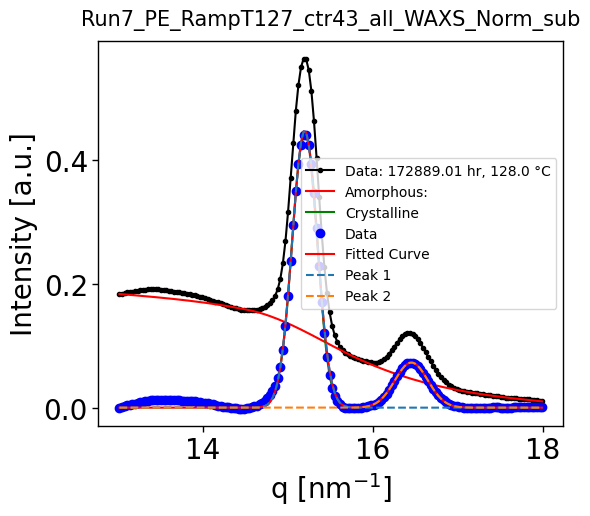

[ 0.44781286 15.19748376  0.10322946  0.07285943 16.45316729  0.137043  ]
percentage_crytallinity: 29.82 ± 4.71 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT127_ctr43_all_WAXS_Norm_sub.dat_fitted.dat
45
Processing file: Run7_PE_RampT130_ctr44_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=172983.83, bstop=6.14783, ctemp=130.14873666666668, I0=20.681963333333332
Fitting 2 peaks with initial guess: [ 0.44781286 15.19748376  0.10322946  0.07285943 16.45316729  0.137043  ]
Adjusted initial guess: [0.3043542973772058, 15.215349524283969, 1.0, 0.04670363267688633, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.3043542973772058, 15.215349524283969, 1.0, 0.04670363267688633, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [ 0.30958029 15.19713394  0.1026652   0.04659687 16.44748966  0.14108852]


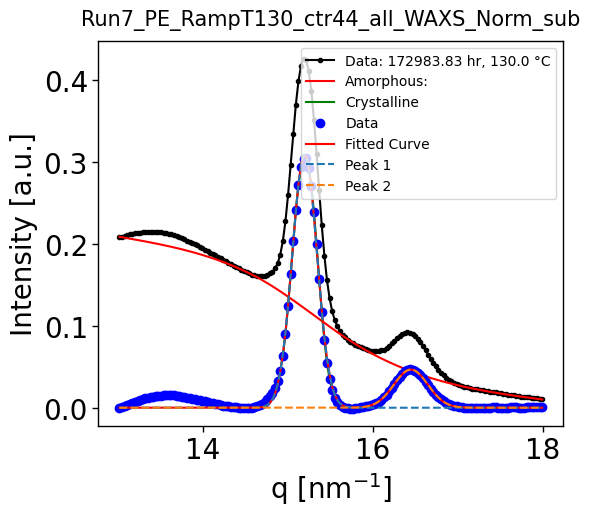

[ 0.30958029 15.19713394  0.1026652   0.04659687 16.44748966  0.14108852]
percentage_crytallinity: 22.24 ± 4.94 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT130_ctr44_all_WAXS_Norm_sub.dat_fitted.dat
46
Processing file: Run7_PE_RampT132_ctr45_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173081.13333333333, bstop=6.159216666666666, ctemp=132.571, I0=20.71077
Fitting 2 peaks with initial guess: [ 0.30958029 15.19713394  0.1026652   0.04659687 16.44748966  0.14108852]
Adjusted initial guess: [0.051485196575711295, 15.184825574976603, 1.0, 0.009557744952163383, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.051485196575711295, 15.184825574976603, 1.0, 0.009557744952163383, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [1.42193122e-02 1.48000000e+01 9.43959189e-01 2.49217698e-10
 1.72000000e+01 4.35391643e-08]
Peak 2 has ampl

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_12628/2097560518.py:6: RuntimeWarning: divide by zero encountered in divide
  return amplitude * np.exp(-((x - mean) / (2 * stddev))**2)


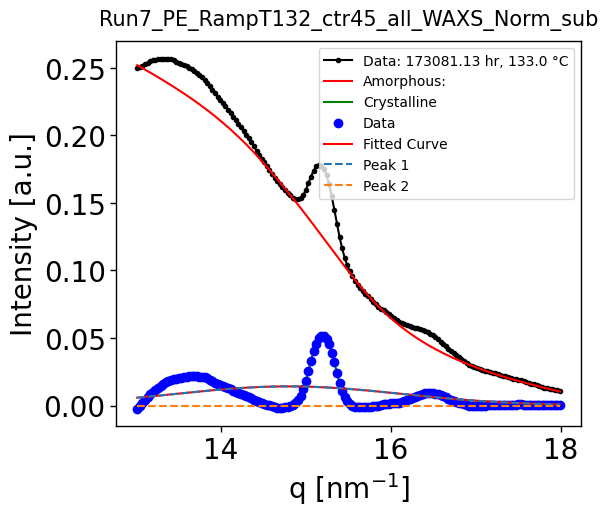

[1.42193122e-02 1.48000000e+01 9.43959189e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 6.88 ± 5.31 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT132_ctr45_all_WAXS_Norm_sub.dat_fitted.dat
47
Processing file: Run7_PE_RampT135_ctr46_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173178.71333333335, bstop=6.179289999999999, ctemp=135.00383333333332, I0=20.758926666666664
Fitting 2 peaks with initial guess: [1.42193122e-02 1.48000000e+01 9.43959189e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0011947475691582998, 14.940633980517672, 1.0, 0.0013264873341275393, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.0011947475691582998, 14.940633980517672, 1.0, 0.0013264873341275393, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [1.75797929e-03 1.48000000e+01 1.00000000e+0

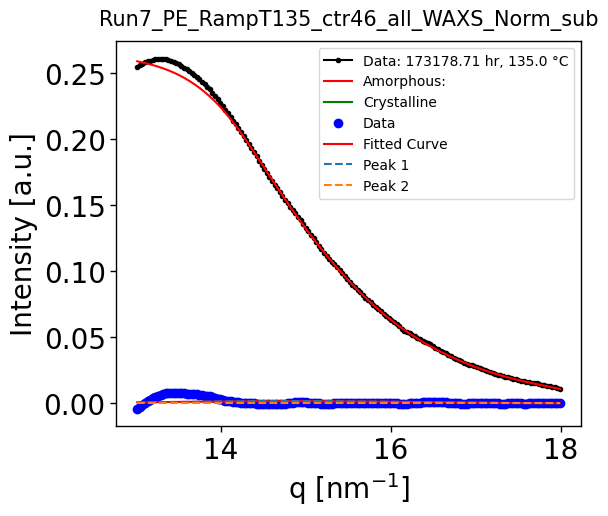

[1.75797929e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.09 ± 5.54 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT135_ctr46_all_WAXS_Norm_sub.dat_fitted.dat
48
Processing file: Run7_PE_RampT137_ctr47_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173278.29666666666, bstop=6.161026666666667, ctemp=137.44247333333334, I0=20.65442
Fitting 2 peaks with initial guess: [1.75797929e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0008387972489755091, 14.87958608190294, 1.0, 0.0010500581956641199, 17.199406229262777, 1.1999999999999993]
Attempt 1 with initial guess: [0.0008387972489755091, 14.87958608190294, 1.0, 0.0010500581956641199, 17.199406229262777, 1.1999999999999993]
Fitted parameters: [1.23335025e-03 1.48000001e+01 1.00000000e+00 4.42704789

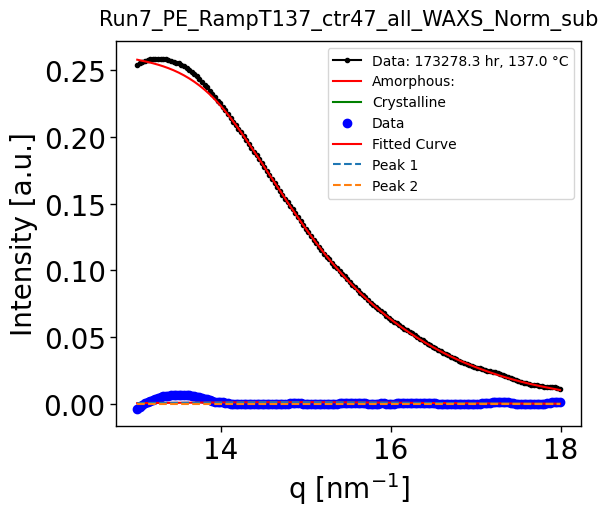

[1.23335025e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.82 ± 5.59 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT137_ctr47_all_WAXS_Norm_sub.dat_fitted.dat
49
Processing file: Run7_PE_RampT140_ctr48_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173380.41666666666, bstop=6.165726666666667, ctemp=139.82506666666666, I0=20.660513333333338
Fitting 2 peaks with initial guess: [1.23335025e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.001201062275720352, 15.154301625669238, 1.0, 0.0010053952295071417, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.001201062275720352, 15.154301625669238, 1.0, 0.0010053952295071417, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [9.00705308e-04 1.48000000e+01 1.00000000e+00 

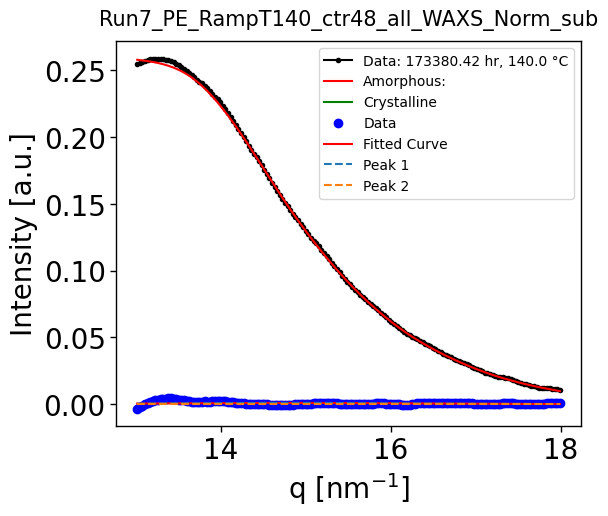

[9.00705308e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.59 ± 5.64 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT140_ctr48_all_WAXS_Norm_sub.dat_fitted.dat
50
Processing file: Run7_PE_RampT142_ctr49_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173481.61333333334, bstop=6.1889166666666675, ctemp=142.32966666666667, I0=20.74721333333333
Fitting 2 peaks with initial guess: [9.00705308e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0005792796867928884, 14.818538183288208, 1.0, 0.0017283543097369979, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.0005792796867928884, 14.818538183288208, 1.0, 0.0017283543097369979, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [8.11648858e-04 1.48000000e+01 1.00000000e+00 

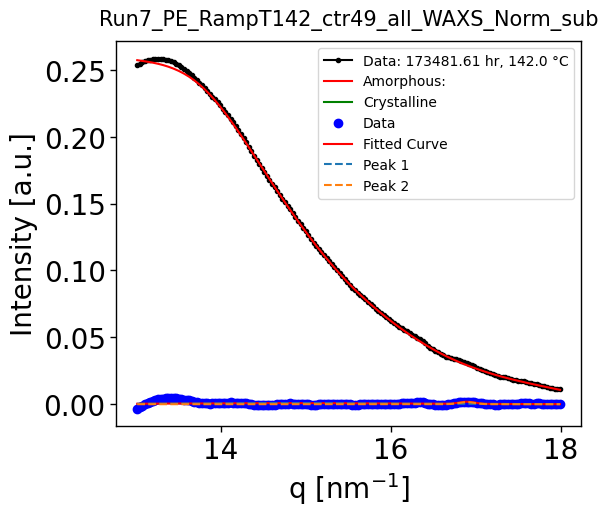

[8.11648858e-04 1.48000000e+01 1.00000000e+00 1.58060457e-03
 1.68983480e+01 6.42682217e-02]
percentage_crytallinity: 0.61 ± 5.62 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT142_ctr49_all_WAXS_Norm_sub.dat_fitted.dat
51
Processing file: Run7_PE_RampT145_ctr50_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173586.27333333335, bstop=6.158243333333334, ctemp=144.79670000000002, I0=20.620563333333333
Fitting 2 peaks with initial guess: [8.11648858e-04 1.48000000e+01 1.00000000e+00 1.58060457e-03
 1.68983480e+01 6.42682217e-02]
Adjusted initial guess: [0.000699723941995703, 15.551112966664999, 1.0, 0.0005733354765526458, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.000699723941995703, 15.551112966664999, 1.0, 0.0005733354765526458, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [7.05605154e-04 1.48000000e+01 1.00000000e+00 3.

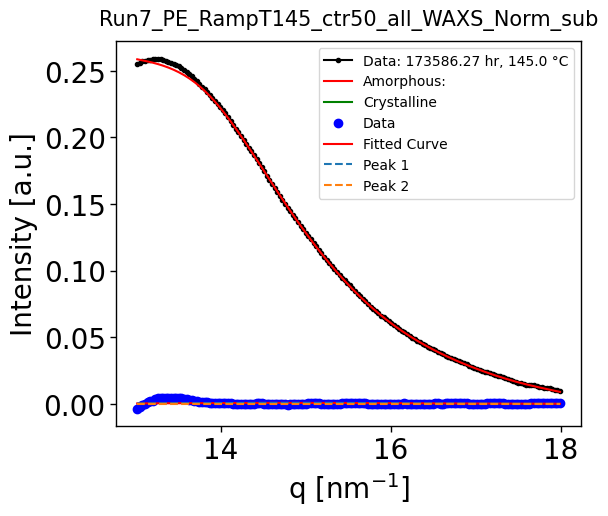

[7.05605154e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.51 ± 5.72 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT145_ctr50_all_WAXS_Norm_sub.dat_fitted.dat
52
Processing file: Run7_PE_RampT147_ctr51_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173693.47333333336, bstop=6.190086666666667, ctemp=147.22203333333331, I0=20.71992
Fitting 2 peaks with initial guess: [7.05605154e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0013506885401223245, 15.795304561123928, 1.0, 0.0016515504011074128, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.0013506885401223245, 15.795304561123928, 1.0, 0.0016515504011074128, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [1.09543981e-03 1.48000000e+01 9.99999999e-01 3.045365

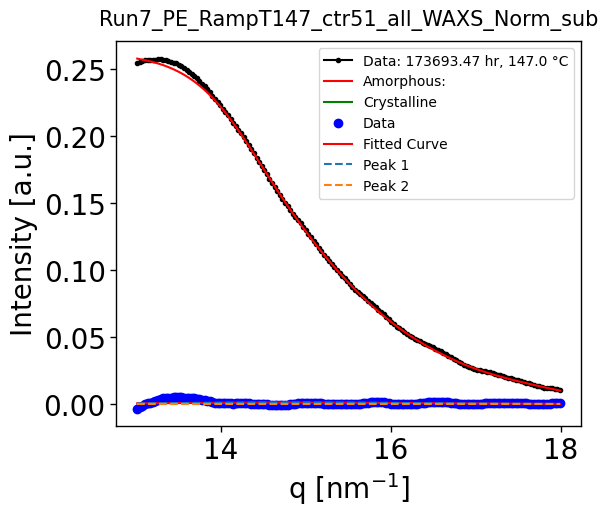

[1.09543981e-03 1.48000000e+01 9.99999999e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.74 ± 5.67 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT147_ctr51_all_WAXS_Norm_sub.dat_fitted.dat
53
Processing file: Run7_PE_RampT150_ctr52_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173802.50333333333, bstop=6.173729999999999, ctemp=149.68987, I0=20.67104
Fitting 2 peaks with initial guess: [1.09543981e-03 1.48000000e+01 9.99999999e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0011160104709919405, 15.490065068050265, 1.0, 0.0012379452390054932, 16.131068003504957, 1.1999999999999993]
Attempt 1 with initial guess: [0.0011160104709919405, 15.490065068050265, 1.0, 0.0012379452390054932, 16.131068003504957, 1.1999999999999993]
Fitted parameters: [9.97065821e-04 1.48000000e+01 1.00000000e+00 1.24717486e-14
 1

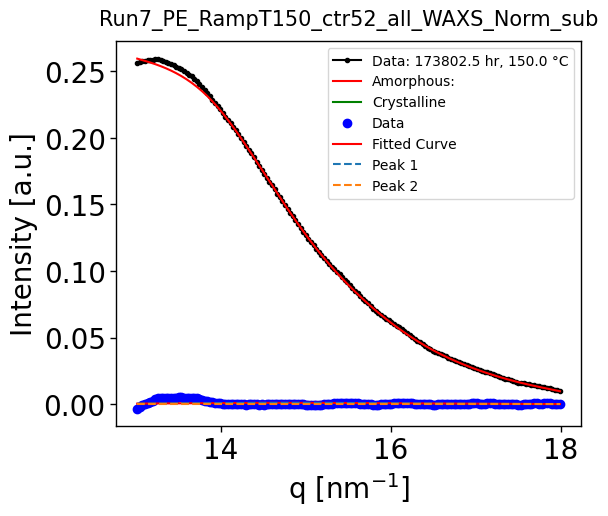

[9.97065821e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.68 ± 5.72 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT150_ctr52_all_WAXS_Norm_sub.dat_fitted.dat
54
Processing file: Run7_PE_RampT152_ctr53_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=173915.08333333334, bstop=6.144783333333334, ctemp=152.09719666666666, I0=20.545576666666665
Fitting 2 peaks with initial guess: [9.97065821e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0006586342291868136, 15.154301625669238, 1.0, 0.0009185907900410538, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.0006586342291868136, 15.154301625669238, 1.0, 0.0009185907900410538, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [8.42212646e-04 1.48000000e+01 1.00000000e+0

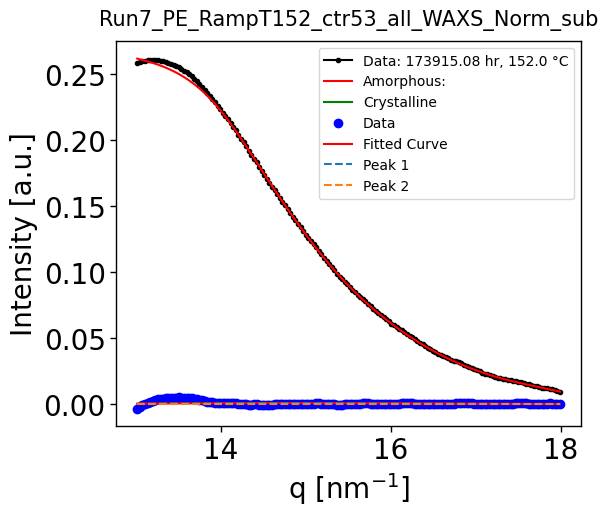

[8.42212646e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.58 ± 5.74 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT152_ctr53_all_WAXS_Norm_sub.dat_fitted.dat
55
Processing file: Run7_PE_RampT155_ctr54_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174029.17666666664, bstop=6.192453333333333, ctemp=154.60216666666668, I0=20.714883333333333
Fitting 2 peaks with initial guess: [8.42212646e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0013452046908075388, 15.429017169435532, 1.0, 0.0008747238643326168, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.0013452046908075388, 15.429017169435532, 1.0, 0.0008747238643326168, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [2.05555766e-03 1.48000000e+01 1.00000000e+0

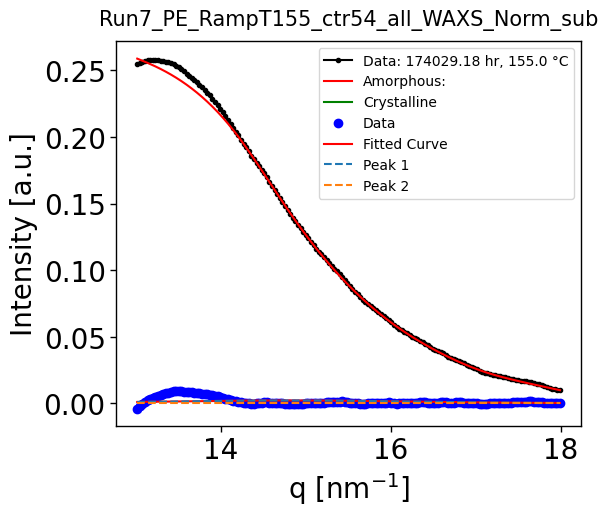

[2.05555766e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.31 ± 5.75 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT155_ctr54_all_WAXS_Norm_sub.dat_fitted.dat
56
Processing file: Run7_PE_RampT157_ctr55_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174147.83333333334, bstop=6.160863333333334, ctemp=157.03150333333335, I0=20.582736666666666
Fitting 2 peaks with initial guess: [2.05555766e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.001077978508558064, 15.3679692708208, 1.0, 0.0009433838382582813, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.001077978508558064, 15.3679692708208, 1.0, 0.0009433838382582813, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [9.90095733e-04 1.48000000e+01 1.00000000e+00 2.18

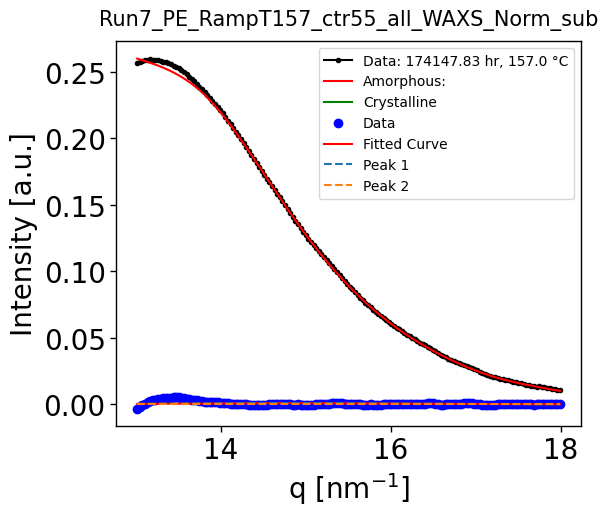

[9.90095733e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.67 ± 5.78 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT157_ctr55_all_WAXS_Norm_sub.dat_fitted.dat
57
Processing file: Run7_PE_RampT160_ctr56_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=174269.42666666667, bstop=6.145283333333334, ctemp=159.54453666666666, I0=20.51071333333333
Fitting 2 peaks with initial guess: [9.90095733e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.000615241149710774, 15.398493220128167, 1.0, 0.0009776996611892824, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.000615241149710774, 15.398493220128167, 1.0, 0.0009776996611892824, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [9.82481381e-04 1.48000053e+01 1.00000000e+00 4

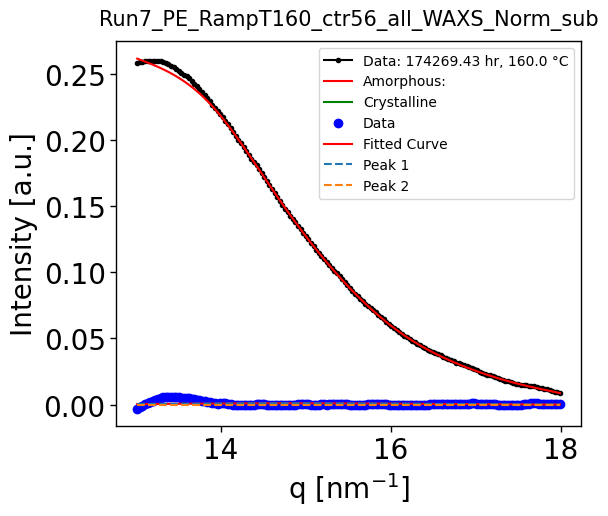

[9.82481381e-04 1.48000053e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.69 ± 5.85 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run7_PE_RampT160_ctr56_all_WAXS_Norm_sub.dat_fitted.dat
filename: 57
timer: 57
CTEMP: 57
I0: 57
bstop: 57
crystal: 57
Amorphous: 57
percentage_crytallinity: 57
percentage_crytallinity_error: 57
peak1_values: 57
peak1_values_error: 57
peak2_values: 57
peak2_values_error: 57


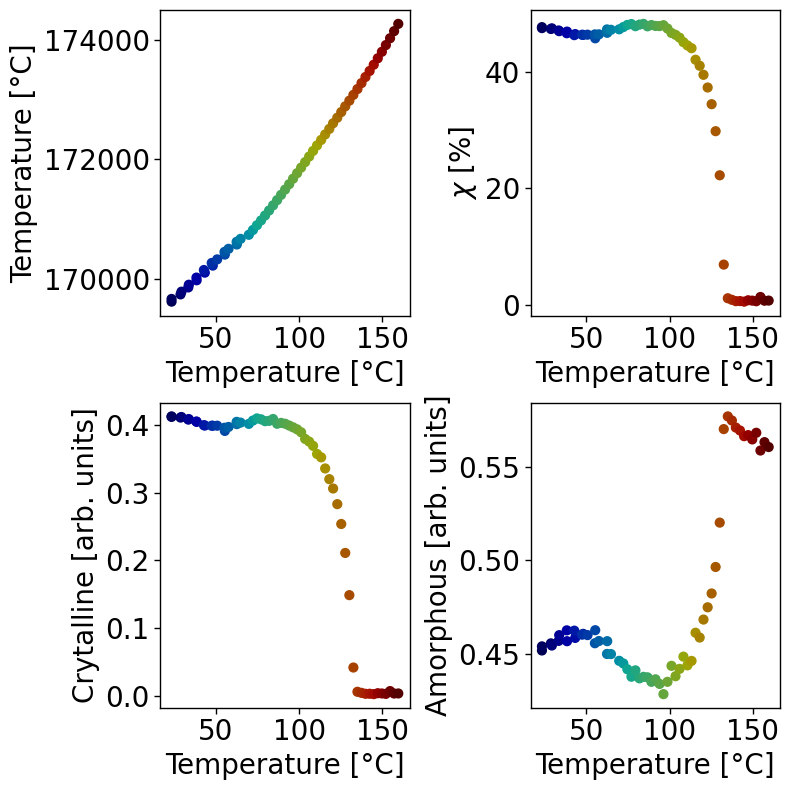

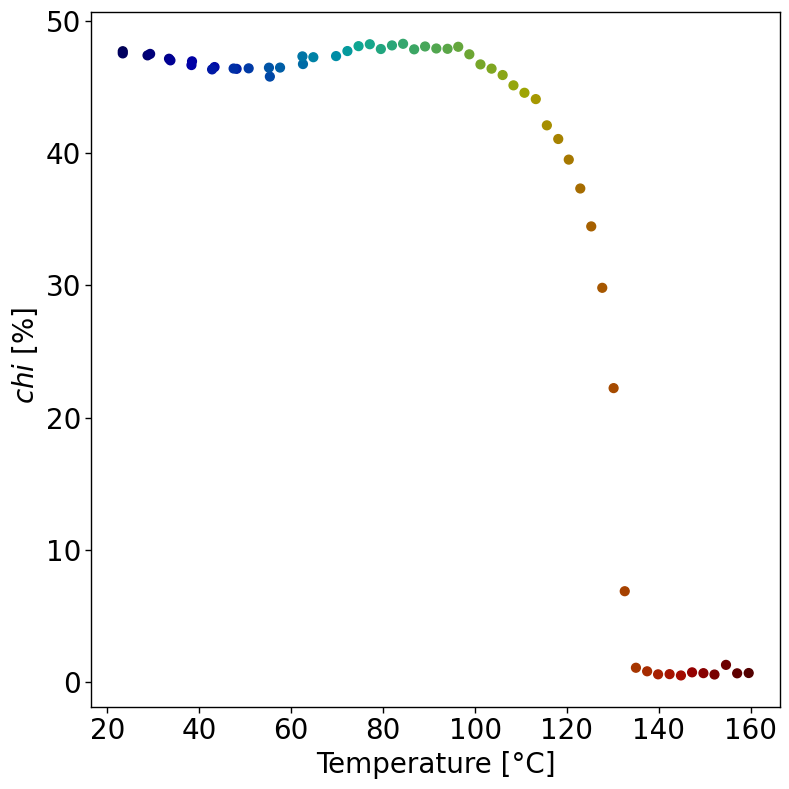

[9.40263587, 15.19262149, 0.13692225, 2.04649794, 16.85926851, 0.17693848]
Matching files for Run6_PE_AcOH_RampT: ['Run6_PE_AcOH_RampT20_ctr0_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT22_ctr1_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT25_ctr2_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT27_ctr3_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT30_ctr4_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT32_ctr5_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT35_ctr6_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT37_ctr7_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT40_ctr8_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT42_ctr9_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT45_ctr10_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT47_ctr11_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT50_ctr12_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT52_ctr13_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT55_ctr14_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT57_ctr15_all_WAXS_Norm_sub.dat', 'Run6_PE_AcOH_RampT60_ctr16_all_WAXS_Norm_sub.dat', 'Run6_PE_Ac

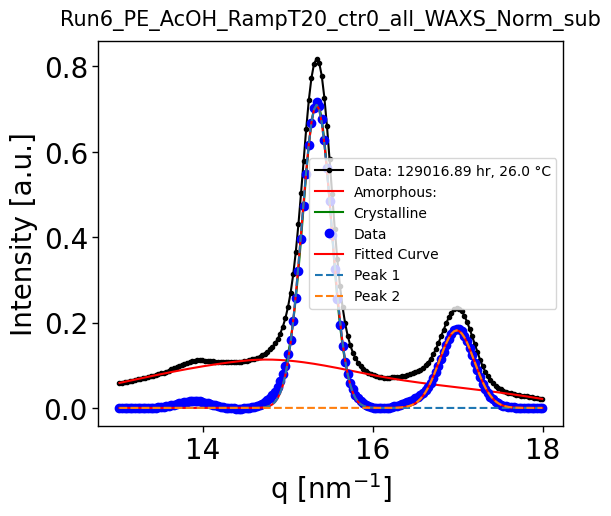

[ 0.70931511 15.33758861  0.12340244  0.18157226 16.9874486   0.14569255]
percentage_crytallinity: 52.62 ± 5.93 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT20_ctr0_all_WAXS_Norm_sub.dat_fitted.dat
2
Processing file: Run6_PE_AcOH_RampT22_ctr1_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129062.18666666666, bstop=4.48916, ctemp=26.089660666666664, I0=21.193836666666666
Fitting 2 peaks with initial guess: [ 0.70931511 15.33758861  0.12340244  0.18157226 16.9874486   0.14569255]
Adjusted initial guess: [0.7164814312338125, 15.337445321513435, 1.0, 0.1864545195964299, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7164814312338125, 15.337445321513435, 1.0, 0.1864545195964299, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71064118 15.33770415  0.12355984  0.18248158 16.98922946  0.14590695]


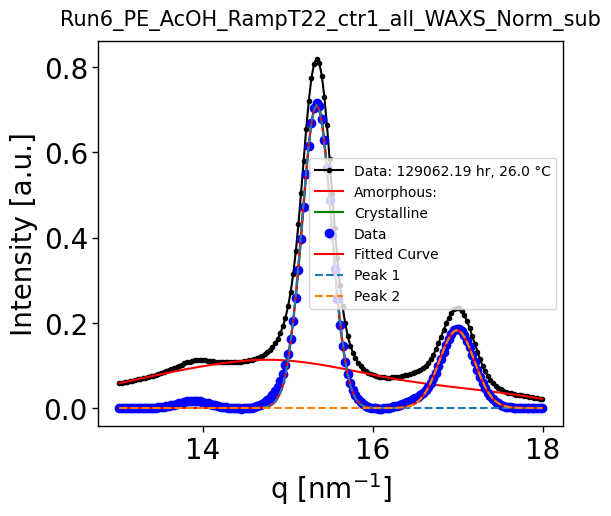

[ 0.71064118 15.33770415  0.12355984  0.18248158 16.98922946  0.14590695]
percentage_crytallinity: 52.59 ± 5.95 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT22_ctr1_all_WAXS_Norm_sub.dat_fitted.dat
3
Processing file: Run6_PE_AcOH_RampT25_ctr2_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129107.27333333333, bstop=4.476323333333333, ctemp=26.00623333333333, I0=21.192326666666663
Fitting 2 peaks with initial guess: [ 0.71064118 15.33770415  0.12355984  0.18248158 16.98922946  0.14590695]
Adjusted initial guess: [0.7172651350367625, 15.337445321513435, 1.0, 0.18810508784249036, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7172651350367625, 15.337445321513435, 1.0, 0.18810508784249036, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71176905 15.33818849  0.12307946  0.1843744  16.9913304   0.14530352]


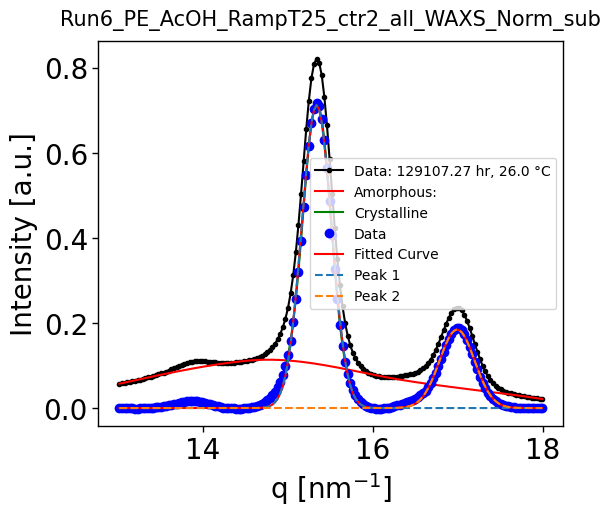

[ 0.71176905 15.33818849  0.12307946  0.1843744  16.9913304   0.14530352]
percentage_crytallinity: 52.69 ± 5.97 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT25_ctr2_all_WAXS_Norm_sub.dat_fitted.dat
4
Processing file: Run6_PE_AcOH_RampT27_ctr3_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129183.92, bstop=4.465003333333333, ctemp=29.595519, I0=21.06884333333333
Fitting 2 peaks with initial guess: [ 0.71176905 15.33818849  0.12307946  0.1843744  16.9913304   0.14530352]
Adjusted initial guess: [0.7198432739879478, 15.337445321513435, 1.0, 0.1862336648387603, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7198432739879478, 15.337445321513435, 1.0, 0.1862336648387603, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71383221 15.33328232  0.12314269  0.18269979 16.97827359  0.14399112]


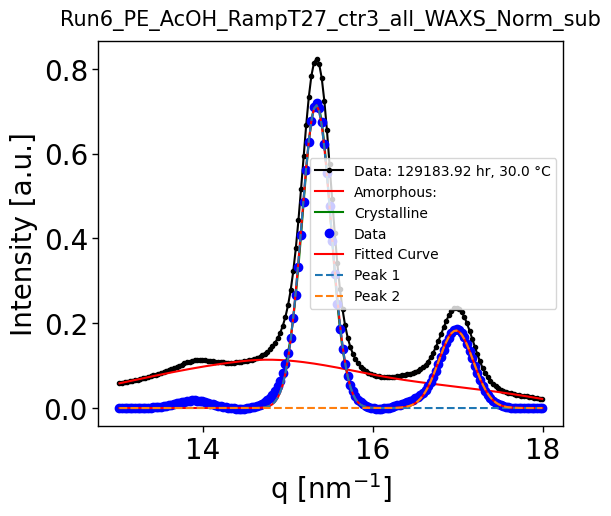

[ 0.71383221 15.33328232  0.12314269  0.18269979 16.97827359  0.14399112]
percentage_crytallinity: 52.41 ± 5.97 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT27_ctr3_all_WAXS_Norm_sub.dat_fitted.dat
5
Processing file: Run6_PE_AcOH_RampT30_ctr4_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129228.75, bstop=4.4589533333333335, ctemp=29.933646666666665, I0=21.023506666666666
Fitting 2 peaks with initial guess: [ 0.71383221 15.33328232  0.12314269  0.18269979 16.97827359  0.14399112]
Adjusted initial guess: [0.7188110954061935, 15.337445321513435, 1.0, 0.18680416679864423, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7188110954061935, 15.337445321513435, 1.0, 0.18680416679864423, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71276906 15.33147198  0.12342524  0.18288122 16.97164183  0.14500484]


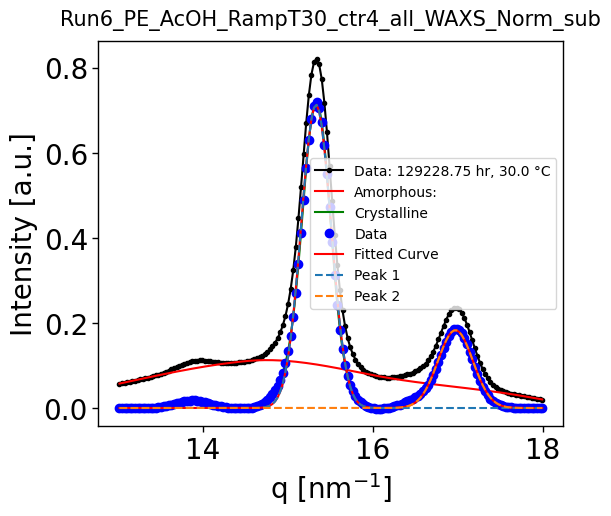

[ 0.71276906 15.33147198  0.12342524  0.18288122 16.97164183  0.14500484]
percentage_crytallinity: 52.81 ± 6.05 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT30_ctr4_all_WAXS_Norm_sub.dat_fitted.dat
6
Processing file: Run6_PE_AcOH_RampT32_ctr5_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129304.59333333334, bstop=4.502483333333333, ctemp=34.345937, I0=21.27558
Fitting 2 peaks with initial guess: [ 0.71276906 15.33147198  0.12342524  0.18288122 16.97164183  0.14500484]
Adjusted initial guess: [0.7067574038485392, 15.337445321513435, 1.0, 0.18385605761576315, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.7067574038485392, 15.337445321513435, 1.0, 0.18385605761576315, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.70150401 15.32519996  0.12339109  0.17993949 16.95570387  0.14525809]


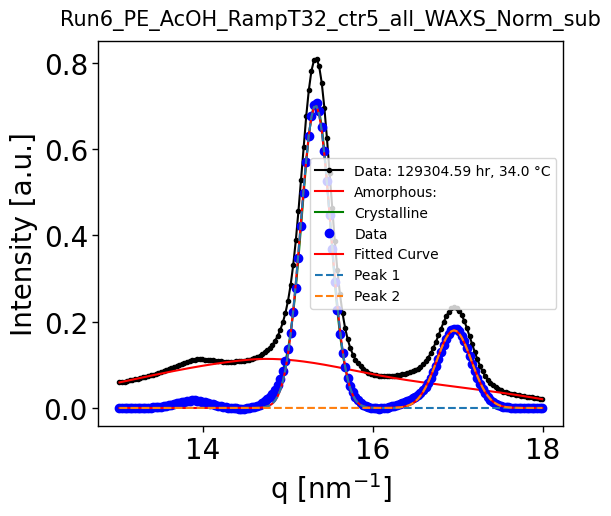

[ 0.70150401 15.32519996  0.12339109  0.17993949 16.95570387  0.14525809]
percentage_crytallinity: 52.18 ± 5.94 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT32_ctr5_all_WAXS_Norm_sub.dat_fitted.dat
7
Processing file: Run6_PE_AcOH_RampT35_ctr6_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129376.74333333333, bstop=4.49233, ctemp=36.624919999999996, I0=21.201773333333332
Fitting 2 peaks with initial guess: [ 0.70150401 15.32519996  0.12339109  0.17993949 16.95570387  0.14525809]
Adjusted initial guess: [0.7044069945318848, 15.337445321513435, 1.0, 0.1832141601630956, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.7044069945318848, 15.337445321513435, 1.0, 0.1832141601630956, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.7005293  15.32125477  0.12300701  0.17955151 16.94523203  0.14640294]


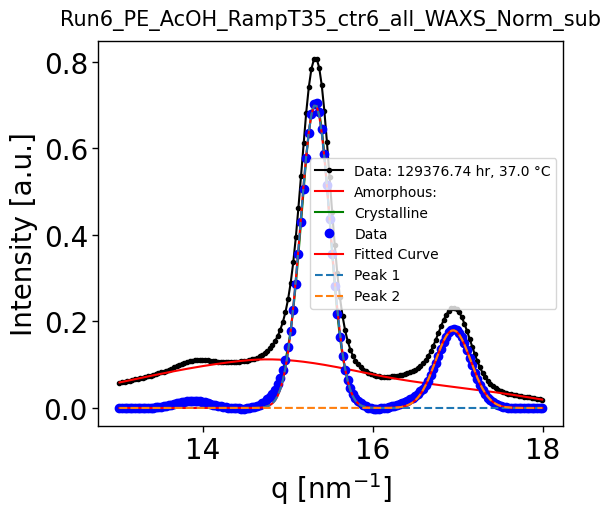

[ 0.7005293  15.32125477  0.12300701  0.17955151 16.94523203  0.14640294]
percentage_crytallinity: 52.41 ± 6.05 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT35_ctr6_all_WAXS_Norm_sub.dat_fitted.dat
8
Processing file: Run6_PE_AcOH_RampT37_ctr7_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129451.43333333333, bstop=4.48036, ctemp=39.09291566666666, I0=21.1027
Fitting 2 peaks with initial guess: [ 0.7005293  15.32125477  0.12300701  0.17955151 16.94523203  0.14640294]
Adjusted initial guess: [0.7011972757364611, 15.306921372206068, 1.0, 0.1837667254992486, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.7011972757364611, 15.306921372206068, 1.0, 0.1837667254992486, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.69775709 15.31786683  0.1230927   0.17993392 16.93391872  0.14696621]


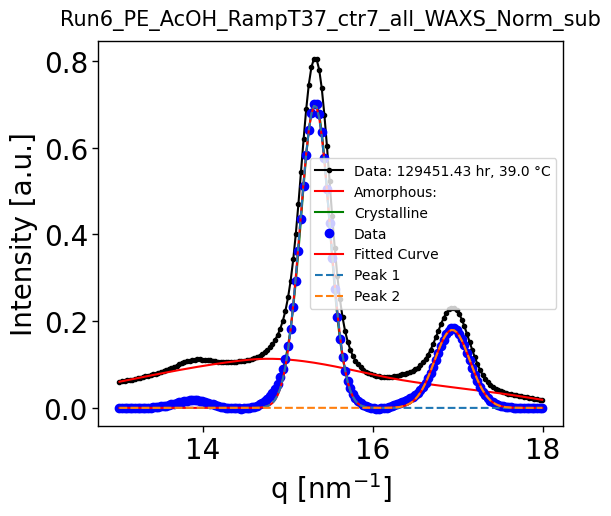

[ 0.69775709 15.31786683  0.1230927   0.17993392 16.93391872  0.14696621]
percentage_crytallinity: 52.48 ± 6.09 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT37_ctr7_all_WAXS_Norm_sub.dat_fitted.dat
9
Processing file: Run6_PE_AcOH_RampT40_ctr8_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129528.57, bstop=4.467663333333333, ctemp=41.57303, I0=21.00780333333333
Fitting 2 peaks with initial guess: [ 0.69775709 15.31786683  0.1230927   0.17993392 16.93391872  0.14696621]
Adjusted initial guess: [0.7024375377750978, 15.306921372206068, 1.0, 0.18396835342553097, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.7024375377750978, 15.306921372206068, 1.0, 0.18396835342553097, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.69812437 15.31373054  0.12296172  0.18007185 16.92074419  0.14671229]


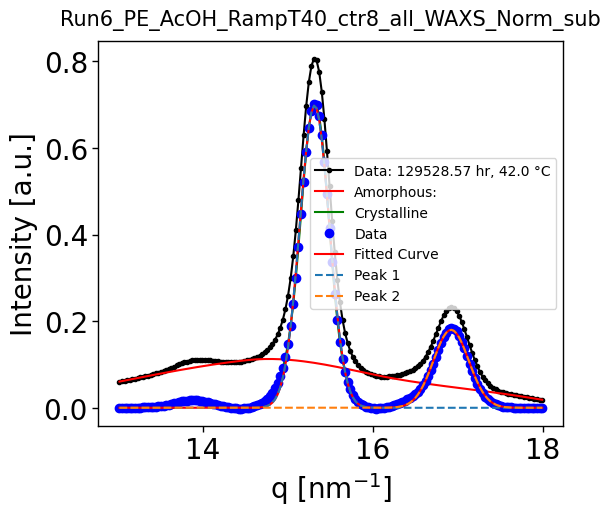

[ 0.69812437 15.31373054  0.12296172  0.18007185 16.92074419  0.14671229]
percentage_crytallinity: 52.56 ± 6.14 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT40_ctr8_all_WAXS_Norm_sub.dat_fitted.dat
10
Processing file: Run6_PE_AcOH_RampT42_ctr9_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129607.42333333334, bstop=4.510913333333334, ctemp=43.98438766666666, I0=21.23734
Fitting 2 peaks with initial guess: [ 0.69812437 15.31373054  0.12296172  0.18007185 16.92074419  0.14671229]
Adjusted initial guess: [0.6950265863879684, 15.306921372206068, 1.0, 0.18024986425491443, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6950265863879684, 15.306921372206068, 1.0, 0.18024986425491443, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.69009406 15.31081931  0.12306777  0.17628677 16.90819581  0.14696442]


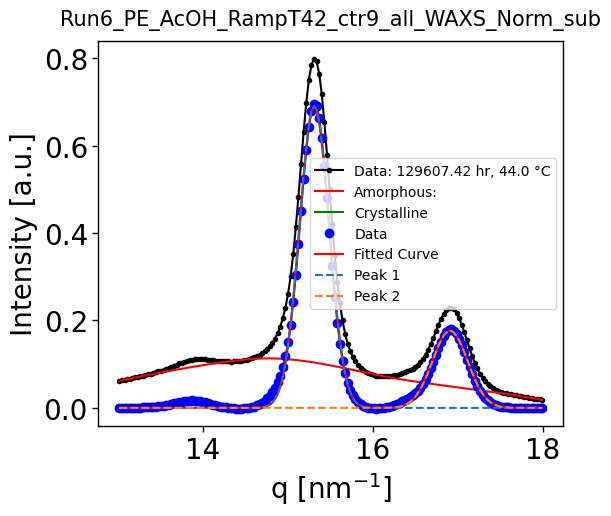

[ 0.69009406 15.31081931  0.12306777  0.17628677 16.90819581  0.14696442]
percentage_crytallinity: 51.95 ± 6.03 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT42_ctr9_all_WAXS_Norm_sub.dat_fitted.dat
11
Processing file: Run6_PE_AcOH_RampT45_ctr10_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129688.78000000001, bstop=4.49488, ctemp=46.41739666666666, I0=21.157
Fitting 2 peaks with initial guess: [ 0.69009406 15.31081931  0.12306777  0.17628677 16.90819581  0.14696442]
Adjusted initial guess: [0.695161713183208, 15.306921372206068, 1.0, 0.17947264236126606, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.695161713183208, 15.306921372206068, 1.0, 0.17947264236126606, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.68946755 15.3065693   0.12321687  0.17618932 16.89753595  0.14648416]


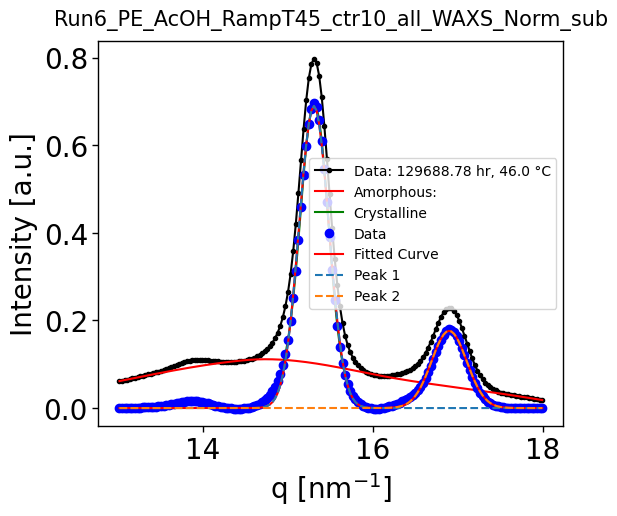

[ 0.68946755 15.3065693   0.12321687  0.17618932 16.89753595  0.14648416]
percentage_crytallinity: 52.17 ± 6.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT45_ctr10_all_WAXS_Norm_sub.dat_fitted.dat
12
Processing file: Run6_PE_AcOH_RampT47_ctr11_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129772.62, bstop=4.4844566666666665, ctemp=48.83392333333333, I0=21.08565666666667
Fitting 2 peaks with initial guess: [ 0.68946755 15.3065693   0.12321687  0.17618932 16.89753595  0.14648416]
Adjusted initial guess: [0.695853774148073, 15.306921372206068, 1.0, 0.17872469079417108, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.695853774148073, 15.306921372206068, 1.0, 0.17872469079417108, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.69051528 15.30334215  0.12306914  0.17547587 16.88446778  0.14493722]


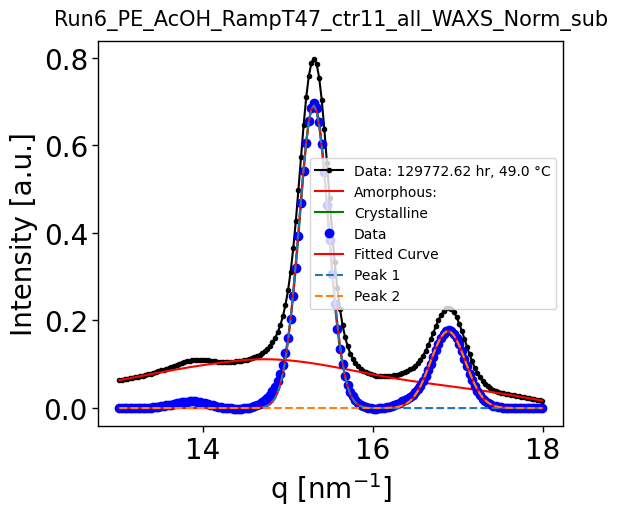

[ 0.69051528 15.30334215  0.12306914  0.17547587 16.88446778  0.14493722]
percentage_crytallinity: 51.90 ± 6.13 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT47_ctr11_all_WAXS_Norm_sub.dat_fitted.dat
13
Processing file: Run6_PE_AcOH_RampT50_ctr12_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129858.95333333332, bstop=4.460719999999999, ctemp=51.24975733333333, I0=20.97548
Fitting 2 peaks with initial guess: [ 0.69051528 15.30334215  0.12306914  0.17547587 16.88446778  0.14493722]
Adjusted initial guess: [0.6984285679519123, 15.306921372206068, 1.0, 0.17971354306069715, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.6984285679519123, 15.306921372206068, 1.0, 0.17971354306069715, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.69308299 15.30575561  0.12281973  0.17631963 16.87923011  0.14610533]


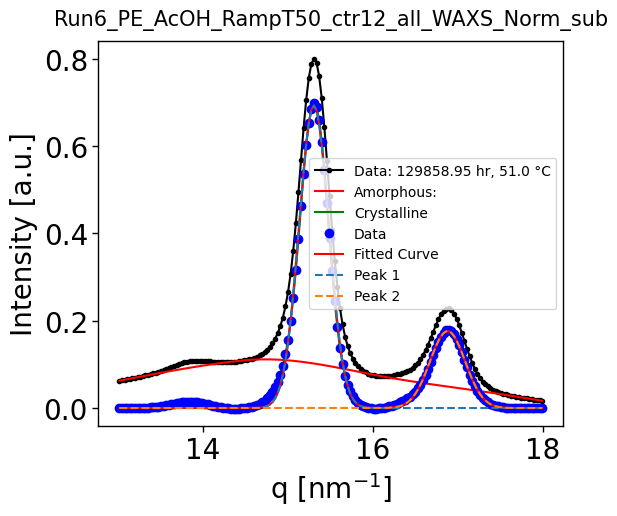

[ 0.69308299 15.30575561  0.12281973  0.17631963 16.87923011  0.14610533]
percentage_crytallinity: 52.22 ± 6.22 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT50_ctr12_all_WAXS_Norm_sub.dat_fitted.dat
14
Processing file: Run6_PE_AcOH_RampT52_ctr13_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=129948.01333333335, bstop=4.50465, ctemp=53.65444933333333, I0=21.172046666666667
Fitting 2 peaks with initial guess: [ 0.69308299 15.30575561  0.12281973  0.17631963 16.87923011  0.14610533]
Adjusted initial guess: [0.6901217965168244, 15.306921372206068, 1.0, 0.17761334335714105, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6901217965168244, 15.306921372206068, 1.0, 0.17761334335714105, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.68490801 15.29983827  0.12296268  0.17422493 16.86331381  0.14618115]


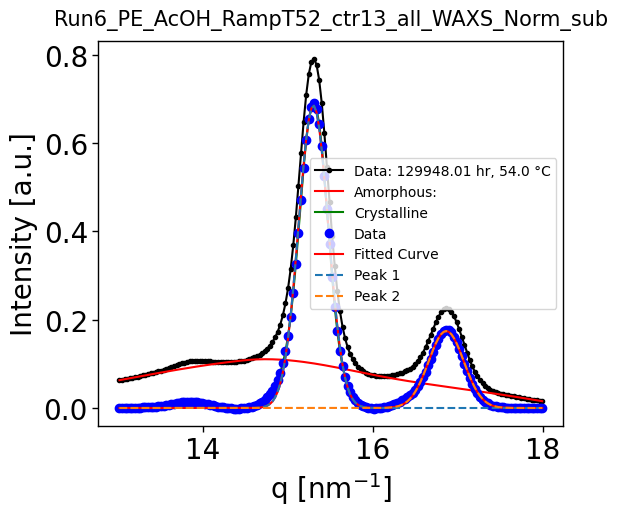

[ 0.68490801 15.29983827  0.12296268  0.17422493 16.86331381  0.14618115]
percentage_crytallinity: 52.36 ± 6.22 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT52_ctr13_all_WAXS_Norm_sub.dat_fitted.dat
15
Processing file: Run6_PE_AcOH_RampT55_ctr14_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130040.59333333334, bstop=4.491716666666666, ctemp=56.066476, I0=21.117523333333335
Fitting 2 peaks with initial guess: [ 0.68490801 15.29983827  0.12296268  0.17422493 16.86331381  0.14618115]
Adjusted initial guess: [0.6900166481936173, 15.306921372206068, 1.0, 0.17848368244830753, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6900166481936173, 15.306921372206068, 1.0, 0.17848368244830753, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.68582011 15.2926305   0.12287637  0.17510239 16.84747631  0.14634671]


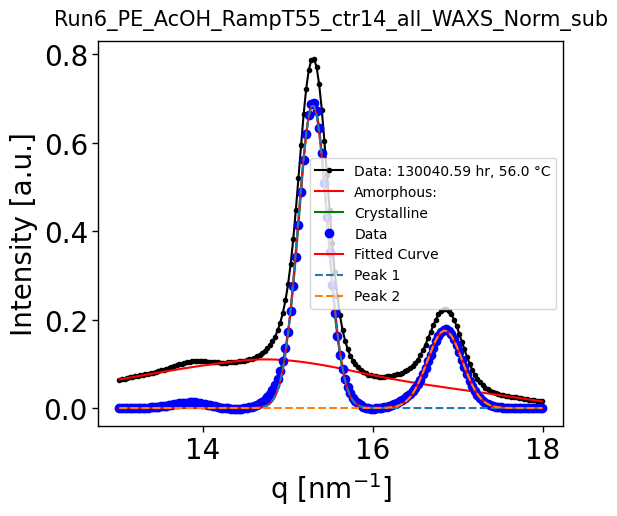

[ 0.68582011 15.2926305   0.12287637  0.17510239 16.84747631  0.14634671]
percentage_crytallinity: 52.52 ± 6.27 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT55_ctr14_all_WAXS_Norm_sub.dat_fitted.dat
16
Processing file: Run6_PE_AcOH_RampT57_ctr15_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130135.31666666665, bstop=4.47785, ctemp=58.47857666666667, I0=20.995743333333333
Fitting 2 peaks with initial guess: [ 0.68582011 15.2926305   0.12287637  0.17510239 16.84747631  0.14634671]
Adjusted initial guess: [0.6896831768794254, 15.306921372206068, 1.0, 0.17931388709231313, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.6896831768794254, 15.306921372206068, 1.0, 0.17931388709231313, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [ 0.68705589 15.28844037  0.12229673  0.17596109 16.83554261  0.14681943]


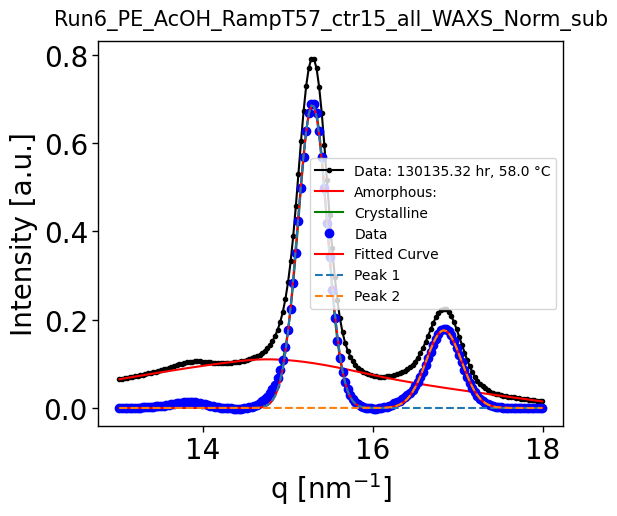

[ 0.68705589 15.28844037  0.12229673  0.17596109 16.83554261  0.14681943]
percentage_crytallinity: 52.59 ± 6.32 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT57_ctr15_all_WAXS_Norm_sub.dat_fitted.dat
17
Processing file: Run6_PE_AcOH_RampT60_ctr16_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130232.03666666667, bstop=4.518483333333333, ctemp=60.89105333333333, I0=21.152693333333332
Fitting 2 peaks with initial guess: [ 0.68705589 15.28844037  0.12229673  0.17596109 16.83554261  0.14681943]
Adjusted initial guess: [0.6864469449803289, 15.2763974228987, 1.0, 0.17862448084305194, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.6864469449803289, 15.2763974228987, 1.0, 0.17862448084305194, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [ 0.68289916 15.28530451  0.12229398  0.17502316 16.82208089  0.14596108]


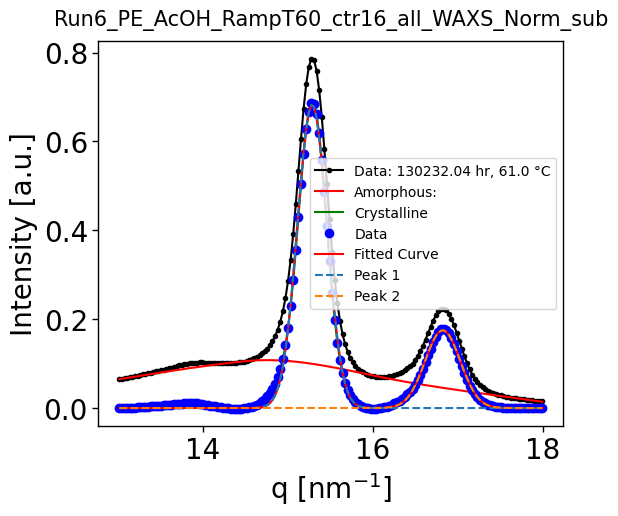

[ 0.68289916 15.28530451  0.12229398  0.17502316 16.82208089  0.14596108]
percentage_crytallinity: 52.88 ± 6.34 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT60_ctr16_all_WAXS_Norm_sub.dat_fitted.dat
18
Processing file: Run6_PE_AcOH_RampT62_ctr17_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130332.09999999999, bstop=1.85325, ctemp=63.72251666666667, I0=7.242273333333333
Fitting 2 peaks with initial guess: [ 0.68289916 15.28530451  0.12229398  0.17502316 16.82208089  0.14596108]
Adjusted initial guess: [1.6216731077241133, 15.2763974228987, 1.0, 0.4180500064442809, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [1.6216731077241133, 15.2763974228987, 1.0, 0.4180500064442809, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 1.61243521 15.28130319  0.12192999  0.41276924 16.80684451  0.1447899 ]


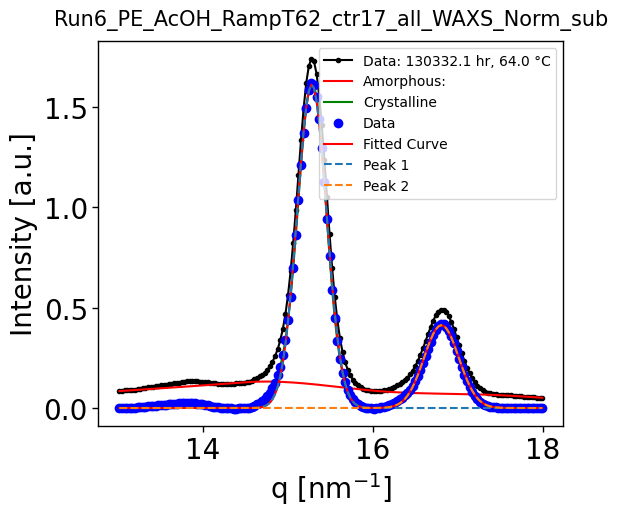

[ 1.61243521 15.28130319  0.12192999  0.41276924 16.80684451  0.1447899 ]
percentage_crytallinity: 66.70 ± 14.81 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT62_ctr17_all_WAXS_Norm_sub.dat_fitted.dat
19
Processing file: Run6_PE_AcOH_RampT65_ctr18_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130411.67, bstop=4.48102, ctemp=67.12642633333333, I0=20.98375
Fitting 2 peaks with initial guess: [ 1.61243521 15.28130319  0.12192999  0.41276924 16.80684451  0.1447899 ]
Adjusted initial guess: [0.6933597461115236, 15.2763974228987, 1.0, 0.1762364474186135, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.6933597461115236, 15.2763974228987, 1.0, 0.1762364474186135, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.68811955 15.27577676  0.12202205  0.17309434 16.78951632  0.14506856]


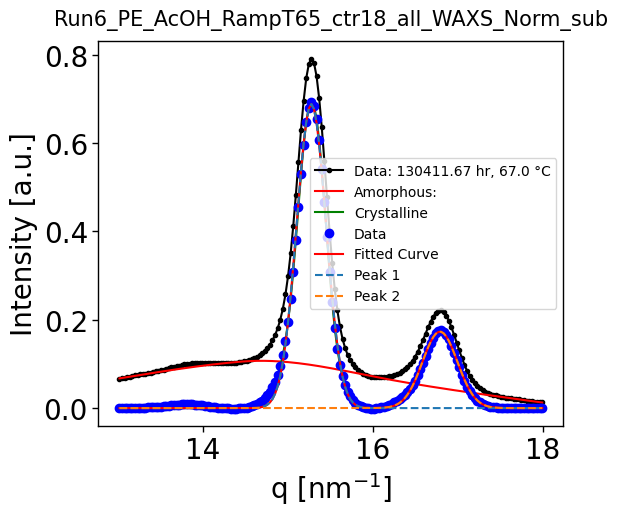

[ 0.68811955 15.27577676  0.12202205  0.17309434 16.78951632  0.14506856]
percentage_crytallinity: 52.91 ± 6.45 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT65_ctr18_all_WAXS_Norm_sub.dat_fitted.dat
20
Processing file: Run6_PE_AcOH_RampT67_ctr19_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130488.83, bstop=4.514473333333334, ctemp=69.51754766666666, I0=21.149323333333335
Fitting 2 peaks with initial guess: [ 0.68811955 15.27577676  0.12202205  0.17309434 16.78951632  0.14506856]
Adjusted initial guess: [0.68997648984053, 15.2763974228987, 1.0, 0.1753308189248361, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.68997648984053, 15.2763974228987, 1.0, 0.1753308189248361, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.68519236 15.27203101  0.12132146  0.17249427 16.77717272  0.1451414 ]


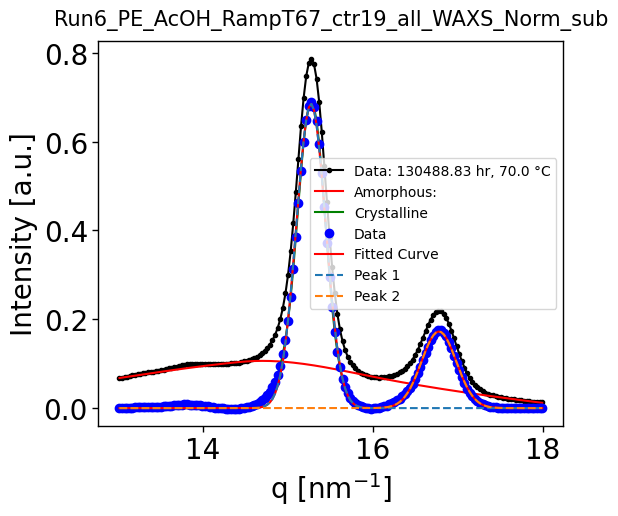

[ 0.68519236 15.27203101  0.12132146  0.17249427 16.77717272  0.1451414 ]
percentage_crytallinity: 53.08 ± 6.44 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT67_ctr19_all_WAXS_Norm_sub.dat_fitted.dat
21
Processing file: Run6_PE_AcOH_RampT70_ctr20_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130567.55666666666, bstop=4.522706666666667, ctemp=71.93394966666666, I0=21.156566666666667
Fitting 2 peaks with initial guess: [ 0.68519236 15.27203101  0.12132146  0.17249427 16.77717272  0.1451414 ]
Adjusted initial guess: [0.6923269816937871, 15.2763974228987, 1.0, 0.17479198048648692, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.6923269816937871, 15.2763974228987, 1.0, 0.17479198048648692, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.68753113 15.27312765  0.12099992  0.17232442 16.7694815   0.14310458]


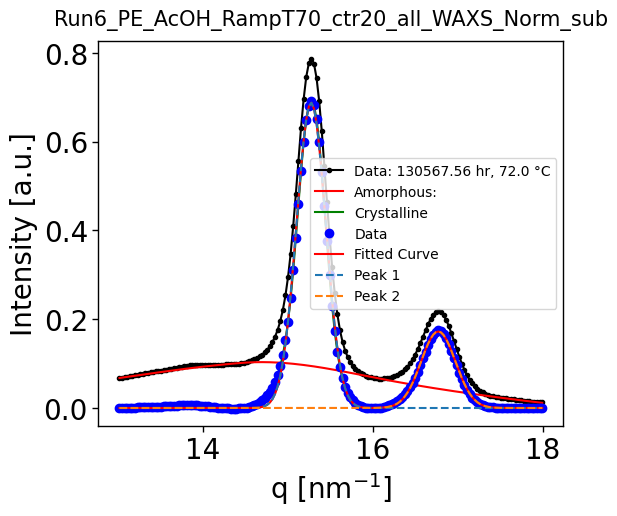

[ 0.68753113 15.27312765  0.12099992  0.17232442 16.7694815   0.14310458]
percentage_crytallinity: 53.48 ± 6.54 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT70_ctr20_all_WAXS_Norm_sub.dat_fitted.dat
22
Processing file: Run6_PE_AcOH_RampT72_ctr21_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130647.68333333333, bstop=4.50086, ctemp=74.35858133333333, I0=21.041443333333333
Fitting 2 peaks with initial guess: [ 0.68753113 15.27312765  0.12099992  0.17232442 16.7694815   0.14310458]
Adjusted initial guess: [0.6959434827842057, 15.2763974228987, 1.0, 0.17582309865761447, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.6959434827842057, 15.2763974228987, 1.0, 0.17582309865761447, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.69252268 15.2652886   0.12030197  0.17340875 16.75055337  0.14322356]


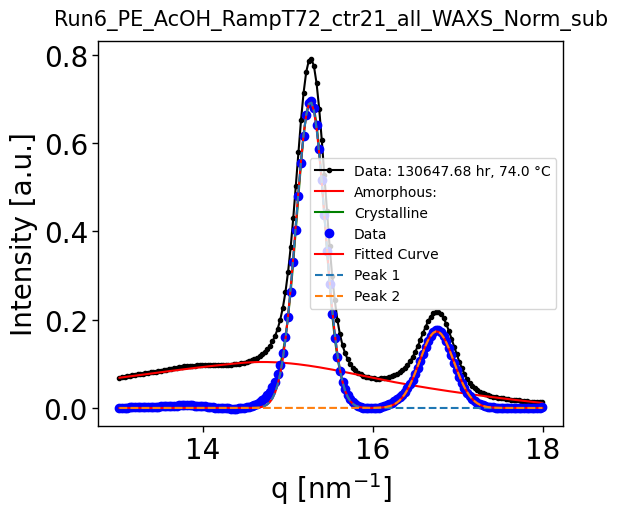

[ 0.69252268 15.2652886   0.12030197  0.17340875 16.75055337  0.14322356]
percentage_crytallinity: 53.66 ± 6.60 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT72_ctr21_all_WAXS_Norm_sub.dat_fitted.dat
23
Processing file: Run6_PE_AcOH_RampT75_ctr22_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130729.00333333334, bstop=4.4886333333333335, ctemp=76.747477, I0=20.97695
Fitting 2 peaks with initial guess: [ 0.69252268 15.2652886   0.12030197  0.17340875 16.75055337  0.14322356]
Adjusted initial guess: [0.6984540079020028, 15.2763974228987, 1.0, 0.1751915800588393, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.6984540079020028, 15.2763974228987, 1.0, 0.1751915800588393, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.69629868 15.26135246  0.11975819  0.172943   16.73715844  0.14181524]


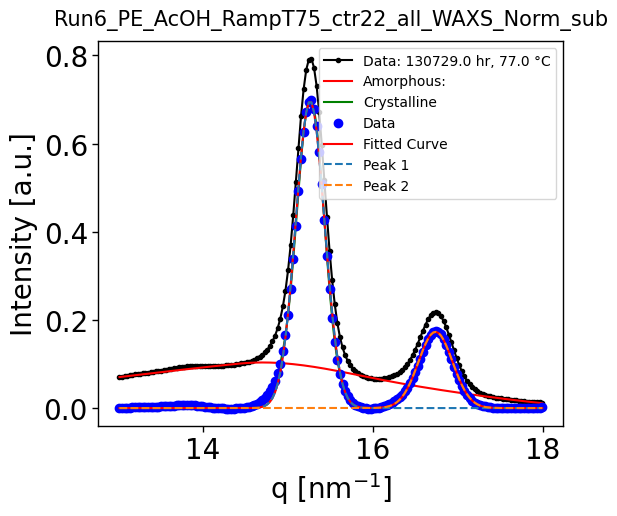

[ 0.69629868 15.26135246  0.11975819  0.172943   16.73715844  0.14181524]
percentage_crytallinity: 53.66 ± 6.64 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT75_ctr22_all_WAXS_Norm_sub.dat_fitted.dat
24
Processing file: Run6_PE_AcOH_RampT77_ctr23_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130810.86, bstop=4.5429466666666665, ctemp=79.19364433333334, I0=21.21479666666667
Fitting 2 peaks with initial guess: [ 0.69629868 15.26135246  0.11975819  0.172943   16.73715844  0.14181524]
Adjusted initial guess: [0.6913984132911204, 15.2763974228987, 1.0, 0.1731799338021924, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.6913984132911204, 15.2763974228987, 1.0, 0.1731799338021924, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.69044064 15.2578278   0.11930142  0.17126731 16.72303801  0.14148837]


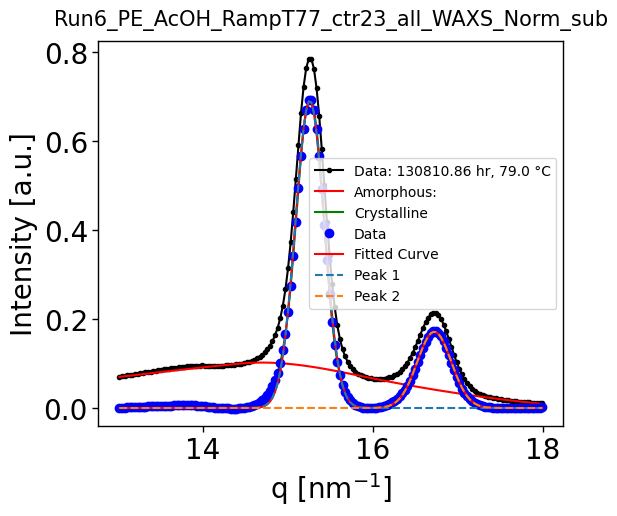

[ 0.69044064 15.2578278   0.11930142  0.17126731 16.72303801  0.14148837]
percentage_crytallinity: 53.95 ± 6.64 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT77_ctr23_all_WAXS_Norm_sub.dat_fitted.dat
25
Processing file: Run6_PE_AcOH_RampT80_ctr24_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130894.89333333333, bstop=4.5192000000000005, ctemp=81.57122033333333, I0=21.08801
Fitting 2 peaks with initial guess: [ 0.69044064 15.2578278   0.11930142  0.17126731 16.72303801  0.14148837]
Adjusted initial guess: [0.698204695912555, 15.245873473591335, 1.0, 0.1743063709864221, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.698204695912555, 15.245873473591335, 1.0, 0.1743063709864221, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.69705661 15.25466035  0.11887406  0.17197463 16.71078649  0.14188234]


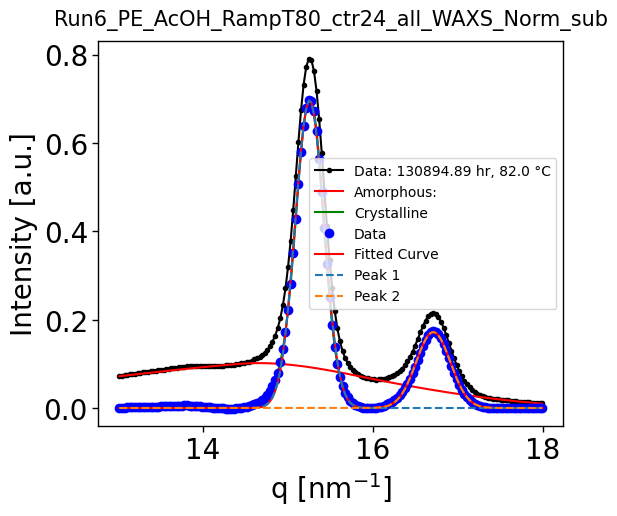

[ 0.69705661 15.25466035  0.11887406  0.17197463 16.71078649  0.14188234]
percentage_crytallinity: 54.09 ± 6.70 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT80_ctr24_all_WAXS_Norm_sub.dat_fitted.dat
26
Processing file: Run6_PE_AcOH_RampT82_ctr25_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=130980.5, bstop=4.5052433333333335, ctemp=83.94775133333333, I0=21.006196666666668
Fitting 2 peaks with initial guess: [ 0.69705661 15.25466035  0.11887406  0.17197463 16.71078649  0.14188234]
Adjusted initial guess: [0.701182865653994, 15.245873473591335, 1.0, 0.17418382555068695, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.701182865653994, 15.245873473591335, 1.0, 0.17418382555068695, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.69988433 15.2516475   0.1179315   0.17238041 16.69651714  0.14026494]


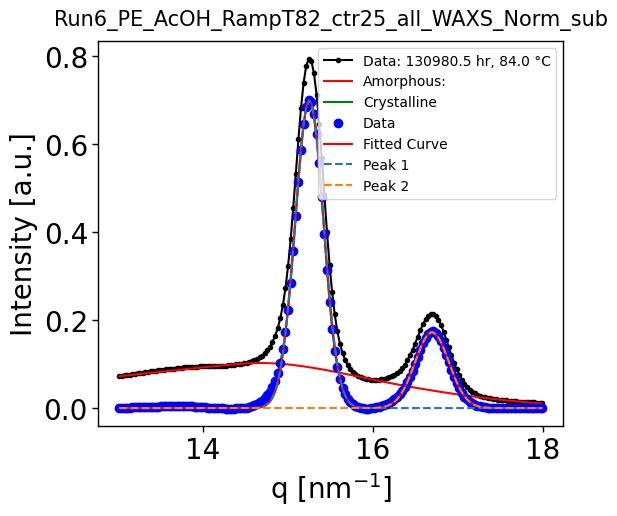

[ 0.69988433 15.2516475   0.1179315   0.17238041 16.69651714  0.14026494]
percentage_crytallinity: 53.95 ± 6.75 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT82_ctr25_all_WAXS_Norm_sub.dat_fitted.dat
27
Processing file: Run6_PE_AcOH_RampT85_ctr26_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131065.80333333334, bstop=4.4962133333333325, ctemp=86.42400100000002, I0=20.934859999999997
Fitting 2 peaks with initial guess: [ 0.69988433 15.2516475   0.1179315   0.17238041 16.69651714  0.14026494]
Adjusted initial guess: [0.7022315530470672, 15.245873473591335, 1.0, 0.1709182913436274, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.7022315530470672, 15.245873473591335, 1.0, 0.1709182913436274, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.70073798 15.24853308  0.11714355  0.16916033 16.68150735  0.1393581 ]


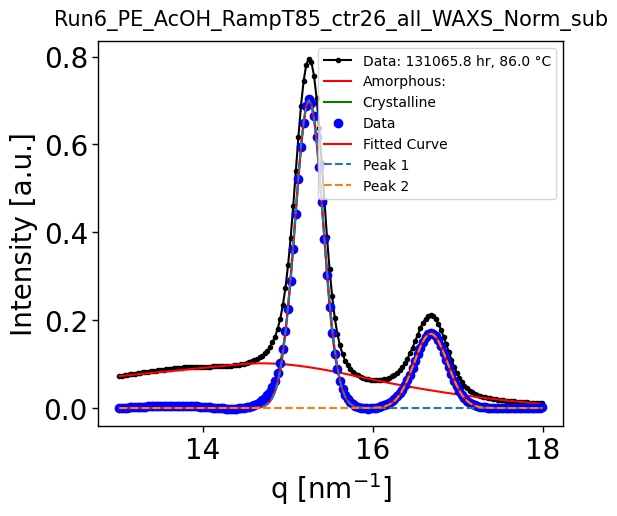

[ 0.70073798 15.24853308  0.11714355  0.16916033 16.68150735  0.1393581 ]
percentage_crytallinity: 53.89 ± 6.82 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT85_ctr26_all_WAXS_Norm_sub.dat_fitted.dat
28
Processing file: Run6_PE_AcOH_RampT87_ctr27_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131153.73, bstop=4.535833333333334, ctemp=88.733022, I0=21.10289333333333
Fitting 2 peaks with initial guess: [ 0.70073798 15.24853308  0.11714355  0.16916033 16.68150735  0.1393581 ]
Adjusted initial guess: [0.6952189110220371, 15.245873473591335, 1.0, 0.16821644271152789, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.6952189110220371, 15.245873473591335, 1.0, 0.16821644271152789, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.69363985 15.24497905  0.11651947  0.16646201 16.66891523  0.13872469]


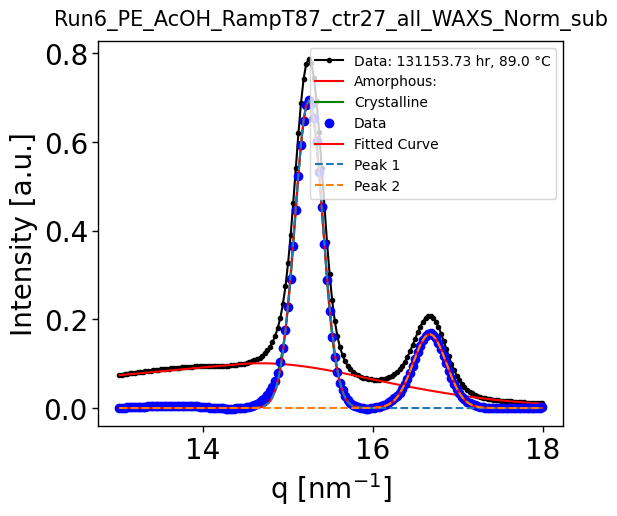

[ 0.69363985 15.24497905  0.11651947  0.16646201 16.66891523  0.13872469]
percentage_crytallinity: 53.62 ± 6.81 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT87_ctr27_all_WAXS_Norm_sub.dat_fitted.dat
29
Processing file: Run6_PE_AcOH_RampT90_ctr28_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131241.25666666665, bstop=4.5214, ctemp=91.14335899999999, I0=20.993370000000002
Fitting 2 peaks with initial guess: [ 0.69363985 15.24497905  0.11651947  0.16646201 16.66891523  0.13872469]
Adjusted initial guess: [0.6991649707670066, 15.245873473591335, 1.0, 0.16821313825007522, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.6991649707670066, 15.245873473591335, 1.0, 0.16821313825007522, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.69708205 15.24156895  0.11676855  0.16652055 16.65453029  0.13865207]


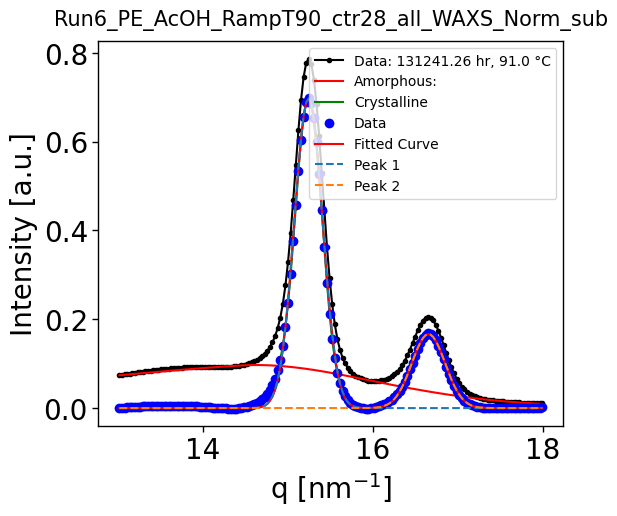

[ 0.69708205 15.24156895  0.11676855  0.16652055 16.65453029  0.13865207]
percentage_crytallinity: 54.81 ± 7.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT90_ctr28_all_WAXS_Norm_sub.dat_fitted.dat
30
Processing file: Run6_PE_AcOH_RampT92_ctr29_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131328.88, bstop=4.510703333333333, ctemp=93.53049700000001, I0=20.915270000000003
Fitting 2 peaks with initial guess: [ 0.69708205 15.24156895  0.11676855  0.16652055 16.65453029  0.13865207]
Adjusted initial guess: [0.6938175062697655, 15.245873473591335, 1.0, 0.16652402186764834, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.6938175062697655, 15.245873473591335, 1.0, 0.16652402186764834, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.69320732 15.23857831  0.11542568  0.16456708 16.63871342  0.13715556]


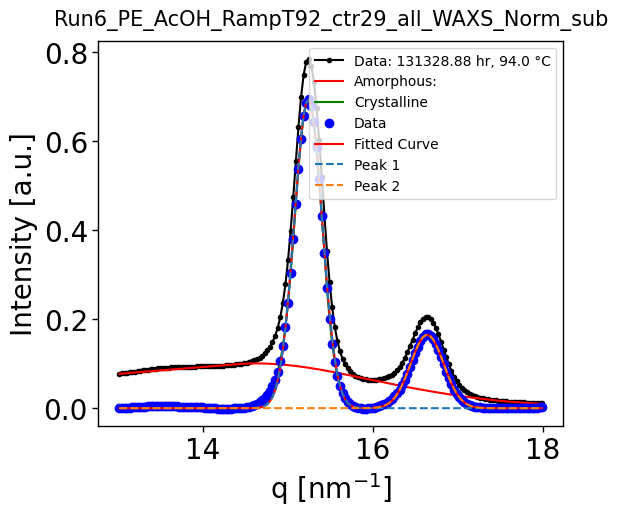

[ 0.69320732 15.23857831  0.11542568  0.16456708 16.63871342  0.13715556]
percentage_crytallinity: 53.42 ± 6.94 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT92_ctr29_all_WAXS_Norm_sub.dat_fitted.dat
31
Processing file: Run6_PE_AcOH_RampT95_ctr30_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131414.44666666666, bstop=4.551893333333333, ctemp=96.020055, I0=21.12174333333333
Fitting 2 peaks with initial guess: [ 0.69320732 15.23857831  0.11542568  0.16456708 16.63871342  0.13715556]
Adjusted initial guess: [0.6843605571356942, 15.245873473591335, 1.0, 0.16216555306822852, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.6843605571356942, 15.245873473591335, 1.0, 0.16216555306822852, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.6844951  15.23518685  0.11514642  0.16069567 16.62380533  0.13675278]


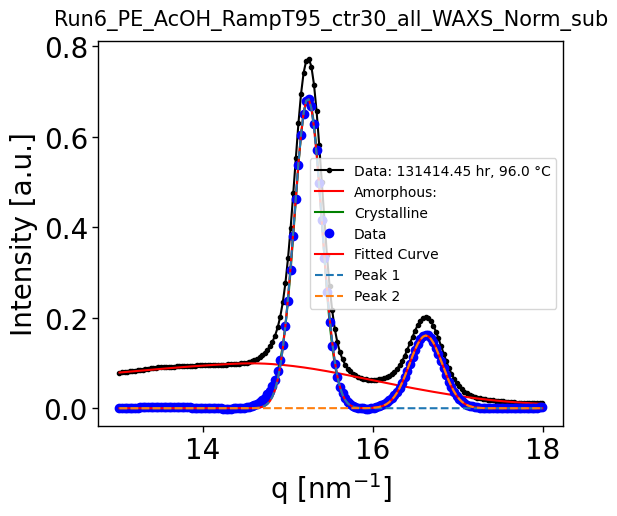

[ 0.6844951  15.23518685  0.11514642  0.16069567 16.62380533  0.13675278]
percentage_crytallinity: 53.05 ± 6.92 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT95_ctr30_all_WAXS_Norm_sub.dat_fitted.dat
32
Processing file: Run6_PE_AcOH_RampT97_ctr31_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131501.89333333334, bstop=4.538743333333334, ctemp=98.28188066666667, I0=21.00607666666667
Fitting 2 peaks with initial guess: [ 0.6844951  15.23518685  0.11514642  0.16069567 16.62380533  0.13675278]
Adjusted initial guess: [0.6775724814039368, 15.245873473591335, 1.0, 0.16110769939451763, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.6775724814039368, 15.245873473591335, 1.0, 0.16110769939451763, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.67879511 15.23185093  0.11441332  0.16007134 16.60889984  0.13581386]


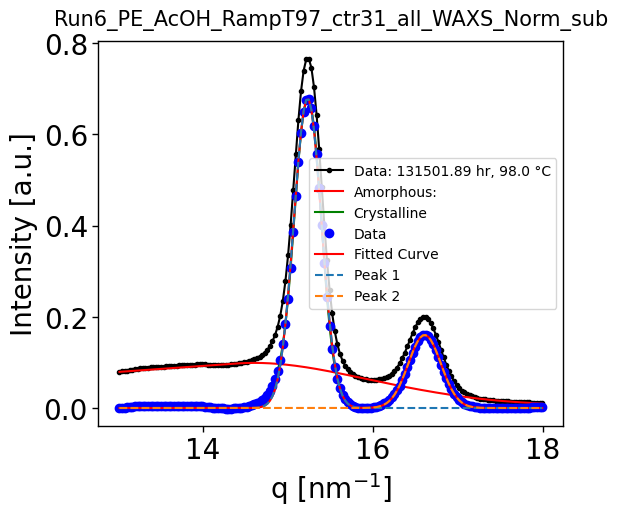

[ 0.67879511 15.23185093  0.11441332  0.16007134 16.60889984  0.13581386]
percentage_crytallinity: 53.14 ± 7.07 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT97_ctr31_all_WAXS_Norm_sub.dat_fitted.dat
33
Processing file: Run6_PE_AcOH_RampT100_ctr32_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131595.84333333335, bstop=4.52497, ctemp=102.1275, I0=20.923986666666668
Fitting 2 peaks with initial guess: [ 0.67879511 15.23185093  0.11441332  0.16007134 16.60889984  0.13581386]
Adjusted initial guess: [0.6633872201048675, 15.215349524283969, 1.0, 0.15533420240058263, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.6633872201048675, 15.215349524283969, 1.0, 0.15533420240058263, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.66529432 15.22584912  0.11401753  0.15414354 16.58333025  0.1347903 ]


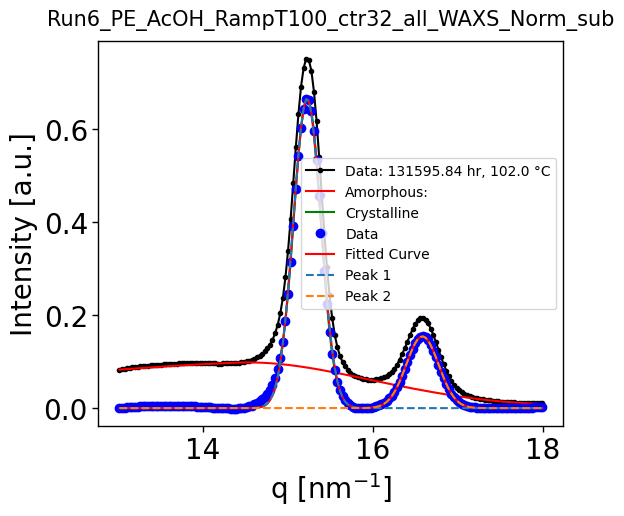

[ 0.66529432 15.22584912  0.11401753  0.15414354 16.58333025  0.1347903 ]
percentage_crytallinity: 52.49 ± 7.20 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT100_ctr32_all_WAXS_Norm_sub.dat_fitted.dat
34
Processing file: Run6_PE_AcOH_RampT102_ctr33_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131687.85333333336, bstop=4.552746666666667, ctemp=103.7401, I0=20.980306666666667
Fitting 2 peaks with initial guess: [ 0.66529432 15.22584912  0.11401753  0.15414354 16.58333025  0.1347903 ]
Adjusted initial guess: [0.6535667933680805, 15.215349524283969, 1.0, 0.1528450345922452, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.6535667933680805, 15.215349524283969, 1.0, 0.1528450345922452, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.65590215 15.22491069  0.1128937   0.1516285  16.57687918  0.13606934]


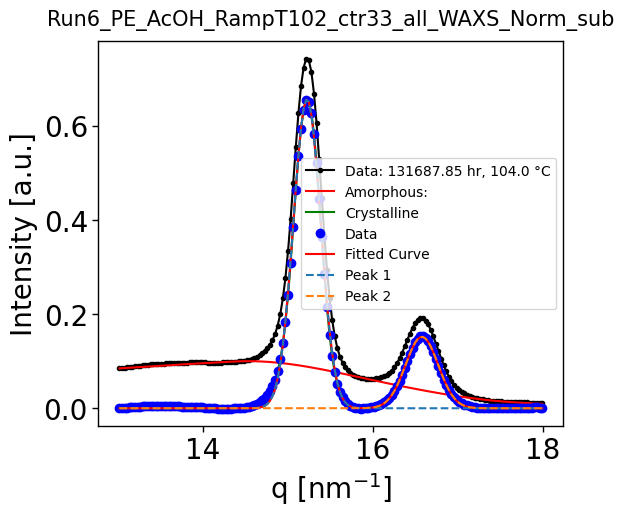

[ 0.65590215 15.22491069  0.1128937   0.1516285  16.57687918  0.13606934]
percentage_crytallinity: 51.65 ± 7.12 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT102_ctr33_all_WAXS_Norm_sub.dat_fitted.dat
35
Processing file: Run6_PE_AcOH_RampT105_ctr34_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131784.84333333332, bstop=4.558466666666667, ctemp=105.73513333333334, I0=21.00406
Fitting 2 peaks with initial guess: [ 0.65590215 15.22491069  0.1128937   0.1516285  16.57687918  0.13606934]
Adjusted initial guess: [0.6422533354058295, 15.215349524283969, 1.0, 0.14874351349025441, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.6422533354058295, 15.215349524283969, 1.0, 0.14874351349025441, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.64455059 15.22214293  0.11236524  0.14768738 16.5625171   0.13458543]


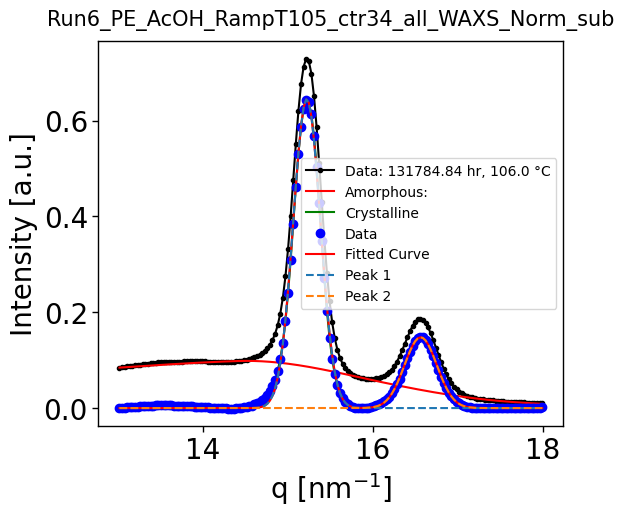

[ 0.64455059 15.22214293  0.11236524  0.14768738 16.5625171   0.13458543]
percentage_crytallinity: 51.37 ± 7.26 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT105_ctr34_all_WAXS_Norm_sub.dat_fitted.dat
36
Processing file: Run6_PE_AcOH_RampT107_ctr35_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131874.55000000002, bstop=4.53934, ctemp=108.25900000000001, I0=20.898823333333336
Fitting 2 peaks with initial guess: [ 0.64455059 15.22214293  0.11236524  0.14768738 16.5625171   0.13458543]
Adjusted initial guess: [0.631928654459146, 15.215349524283969, 1.0, 0.14378168262094915, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.631928654459146, 15.215349524283969, 1.0, 0.14378168262094915, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.63360836 15.21919265  0.11186157  0.14303782 16.54959204  0.13379757]


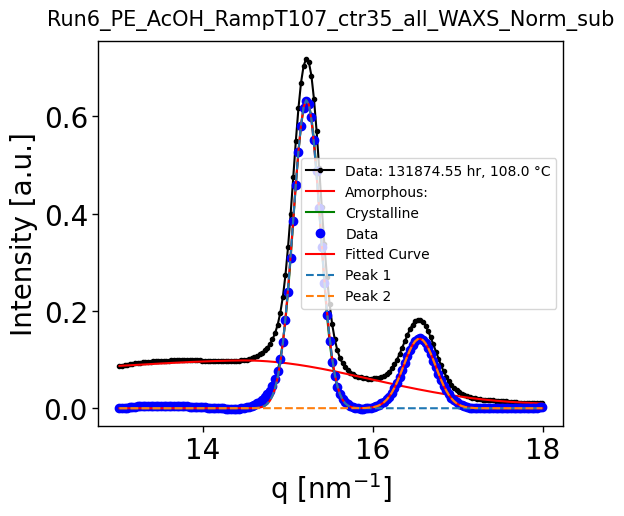

[ 0.63360836 15.21919265  0.11186157  0.14303782 16.54959204  0.13379757]
percentage_crytallinity: 50.57 ± 7.39 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT107_ctr35_all_WAXS_Norm_sub.dat_fitted.dat
37
Processing file: Run6_PE_AcOH_RampT110_ctr36_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=131964.74333333332, bstop=4.5159899999999995, ctemp=110.78943333333332, I0=20.838693333333335
Fitting 2 peaks with initial guess: [ 0.63360836 15.21919265  0.11186157  0.14303782 16.54959204  0.13379757]
Adjusted initial guess: [0.6134000257755788, 15.215349524283969, 1.0, 0.13791630050946516, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.6134000257755788, 15.215349524283969, 1.0, 0.13791630050946516, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.61529047 15.21608145  0.11100673  0.13712187 16.53208895  0.13392675]


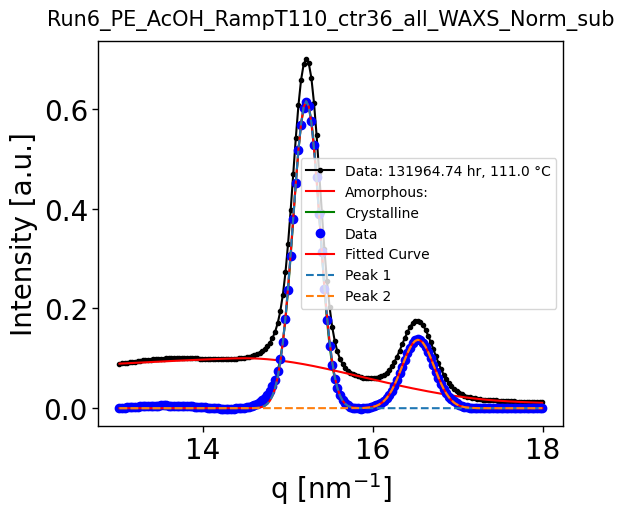

[ 0.61529047 15.21608145  0.11100673  0.13712187 16.53208895  0.13392675]
percentage_crytallinity: 49.48 ± 7.52 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT110_ctr36_all_WAXS_Norm_sub.dat_fitted.dat
38
Processing file: Run6_PE_AcOH_RampT112_ctr37_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132056.85666666666, bstop=4.552323333333334, ctemp=113.14893333333333, I0=21.00261
Fitting 2 peaks with initial guess: [ 0.61529047 15.21608145  0.11100673  0.13712187 16.53208895  0.13392675]
Adjusted initial guess: [0.5920904377665934, 15.215349524283969, 1.0, 0.12846812254243284, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.5920904377665934, 15.215349524283969, 1.0, 0.12846812254243284, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.59357203 15.21304286  0.11080026  0.12799338 16.52017484  0.13486595]


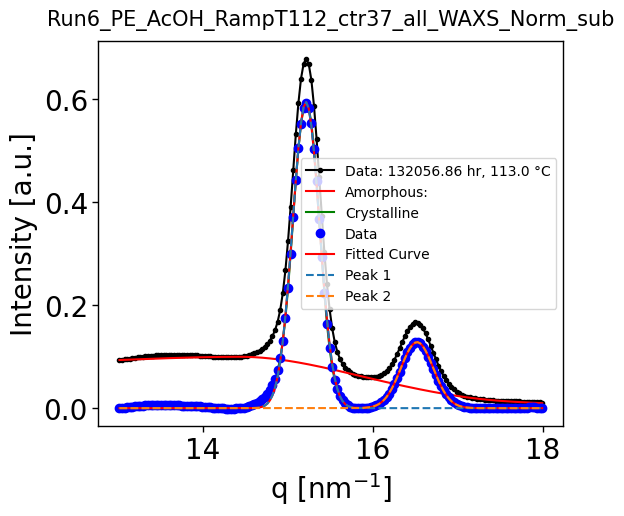

[ 0.59357203 15.21304286  0.11080026  0.12799338 16.52017484  0.13486595]
percentage_crytallinity: 48.52 ± 7.55 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT112_ctr37_all_WAXS_Norm_sub.dat_fitted.dat
39
Processing file: Run6_PE_AcOH_RampT115_ctr38_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132148.14, bstop=4.533196666666666, ctemp=115.56276666666668, I0=20.94739
Fitting 2 peaks with initial guess: [ 0.59357203 15.21304286  0.11080026  0.12799338 16.52017484  0.13486595]
Adjusted initial guess: [0.5727220688814366, 15.215349524283969, 1.0, 0.12064088046449115, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.5727220688814366, 15.215349524283969, 1.0, 0.12064088046449115, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [ 0.57496471 15.21045546  0.10973915  0.12000101 16.50603545  0.13456446]


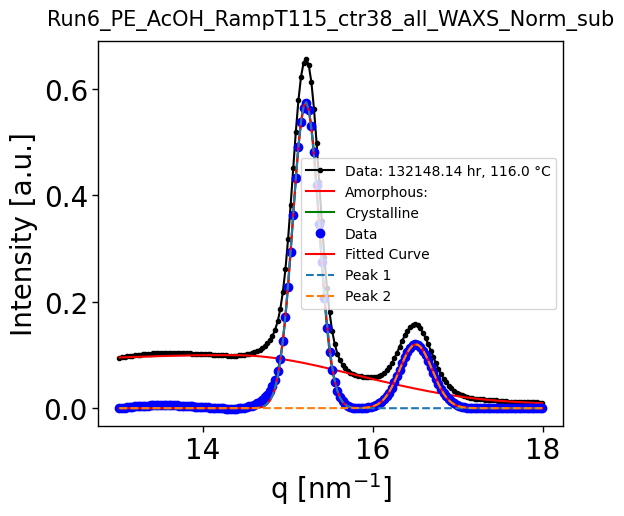

[ 0.57496471 15.21045546  0.10973915  0.12000101 16.50603545  0.13456446]
percentage_crytallinity: 47.52 ± 7.84 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT115_ctr38_all_WAXS_Norm_sub.dat_fitted.dat
40
Processing file: Run6_PE_AcOH_RampT117_ctr39_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132239.22, bstop=4.515023333333333, ctemp=118.00106666666666, I0=20.855416666666667
Fitting 2 peaks with initial guess: [ 0.57496471 15.21045546  0.10973915  0.12000101 16.50603545  0.13456446]
Adjusted initial guess: [0.5422125415829296, 15.215349524283969, 1.0, 0.11061442534967852, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.5422125415829296, 15.215349524283969, 1.0, 0.11061442534967852, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [ 0.54669393 15.20809572  0.10745741  0.11033523 16.49349102  0.1363481 ]


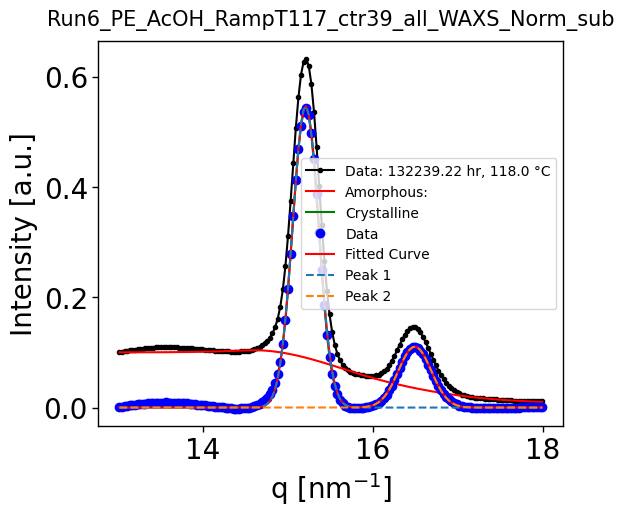

[ 0.54669393 15.20809572  0.10745741  0.11033523 16.49349102  0.1363481 ]
percentage_crytallinity: 45.09 ± 7.95 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT117_ctr39_all_WAXS_Norm_sub.dat_fitted.dat
41
Processing file: Run6_PE_AcOH_RampT120_ctr40_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132331.32, bstop=4.561303333333334, ctemp=120.38250000000001, I0=21.039396666666665
Fitting 2 peaks with initial guess: [ 0.54669393 15.20809572  0.10745741  0.11033523 16.49349102  0.1363481 ]
Adjusted initial guess: [0.5030469023404347, 15.215349524283969, 1.0, 0.09751279335911153, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.5030469023404347, 15.215349524283969, 1.0, 0.09751279335911153, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.50715413 15.20568758  0.10706228  0.09702087 16.48491586  0.13655366]


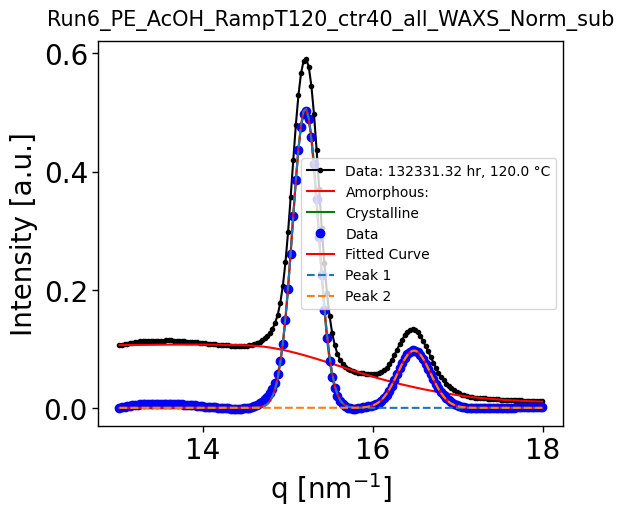

[ 0.50715413 15.20568758  0.10706228  0.09702087 16.48491586  0.13655366]
percentage_crytallinity: 42.42 ± 7.95 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT120_ctr40_all_WAXS_Norm_sub.dat_fitted.dat
42
Processing file: Run6_PE_AcOH_RampT122_ctr41_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132424.12333333335, bstop=4.54076, ctemp=122.77926666666667, I0=20.909573333333334
Fitting 2 peaks with initial guess: [ 0.50715413 15.20568758  0.10706228  0.09702087 16.48491586  0.13655366]
Adjusted initial guess: [0.4478695756368427, 15.215349524283969, 1.0, 0.08082670331131842, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.4478695756368427, 15.215349524283969, 1.0, 0.08082670331131842, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.45225357 15.20354665  0.10627098  0.08078405 16.47826146  0.13918514]


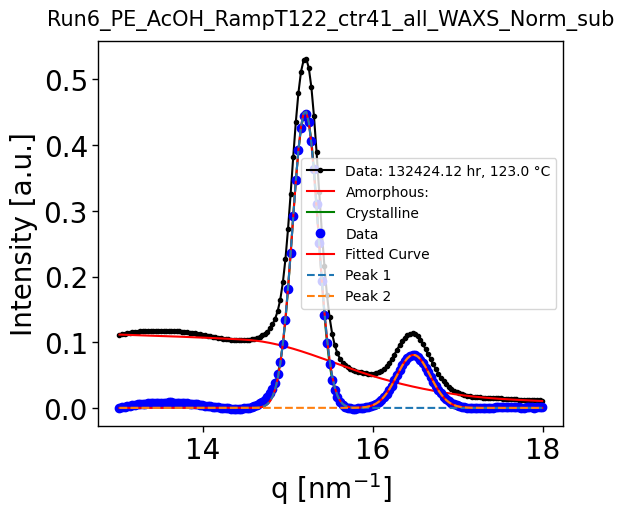

[ 0.45225357 15.20354665  0.10627098  0.08078405 16.47826146  0.13918514]
percentage_crytallinity: 40.00 ± 8.54 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT122_ctr41_all_WAXS_Norm_sub.dat_fitted.dat
43
Processing file: Run6_PE_AcOH_RampT125_ctr42_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132517.49666666667, bstop=4.509603333333334, ctemp=125.18666666666667, I0=20.832516666666667
Fitting 2 peaks with initial guess: [ 0.45225357 15.20354665  0.10627098  0.08078405 16.47826146  0.13918514]
Adjusted initial guess: [0.36124672142393954, 15.215349524283969, 1.0, 0.06168510500980338, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.36124672142393954, 15.215349524283969, 1.0, 0.06168510500980338, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.36537599 15.20228332  0.1048895   0.0618387  16.47674581  0.13829916]


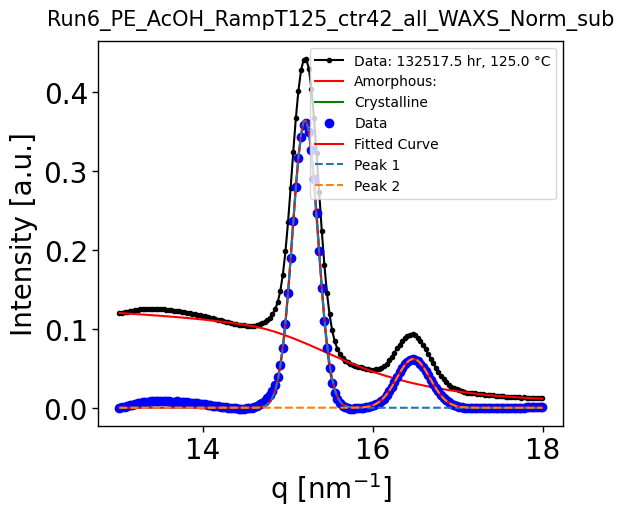

[ 0.36537599 15.20228332  0.1048895   0.0618387  16.47674581  0.13829916]
percentage_crytallinity: 34.30 ± 9.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT125_ctr42_all_WAXS_Norm_sub.dat_fitted.dat
44
Processing file: Run6_PE_AcOH_RampT127_ctr43_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132611.82666666666, bstop=4.534120000000001, ctemp=127.60303333333333, I0=21.046563333333335
Fitting 2 peaks with initial guess: [ 0.36537599 15.20228332  0.1048895   0.0618387  16.47674581  0.13829916]
Adjusted initial guess: [0.22745700062073979, 15.215349524283969, 1.0, 0.0373405671828799, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.22745700062073979, 15.215349524283969, 1.0, 0.0373405671828799, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.23059945 15.20109035  0.10332675  0.03735909 16.47742548  0.1425473 ]


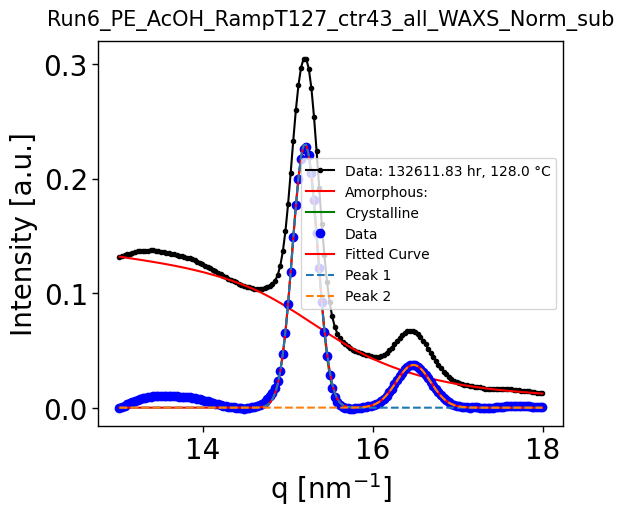

[ 0.23059945 15.20109035  0.10332675  0.03735909 16.47742548  0.1425473 ]
percentage_crytallinity: 25.03 ± 9.99 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT127_ctr43_all_WAXS_Norm_sub.dat_fitted.dat
45
Processing file: Run6_PE_AcOH_RampT130_ctr44_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132706.73, bstop=4.538726666666666, ctemp=130.00276, I0=20.922963333333332
Fitting 2 peaks with initial guess: [ 0.23059945 15.20109035  0.10332675  0.03735909 16.47742548  0.1425473 ]
Adjusted initial guess: [0.016367266776878067, 15.215349524283969, 1.0, 0.003375454232413505, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.016367266776878067, 15.215349524283969, 1.0, 0.003375454232413505, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [6.09789418e-03 1.48000000e+01 1.00000000e+00 5.15072522e-08
 1.71796755e+01 4.10539459e-05]


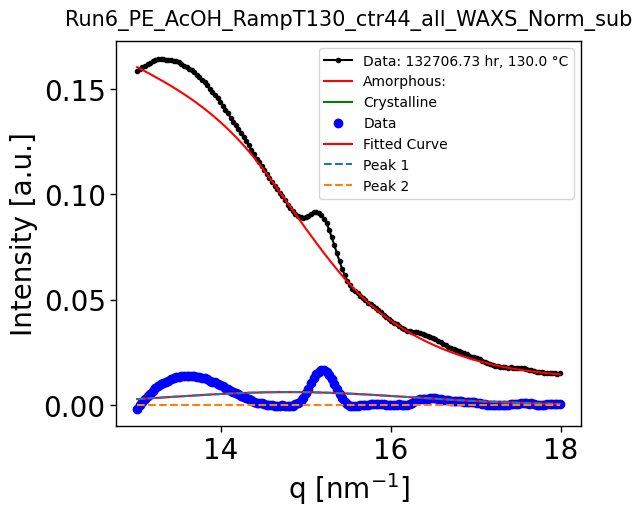

[6.09789418e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 5.10 ± 11.52 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT130_ctr44_all_WAXS_Norm_sub.dat_fitted.dat
46
Processing file: Run6_PE_AcOH_RampT132_ctr45_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132800.91333333336, bstop=4.53848, ctemp=132.56222666666667, I0=20.84808
Fitting 2 peaks with initial guess: [6.09789418e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0005488710179422374, 15.001681879132406, 1.0, 0.001050970364206618, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.0005488710179422374, 15.001681879132406, 1.0, 0.001050970364206618, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [7.19855889e-04 1.48000000e+01 1.00000000e+00 1.04633828e

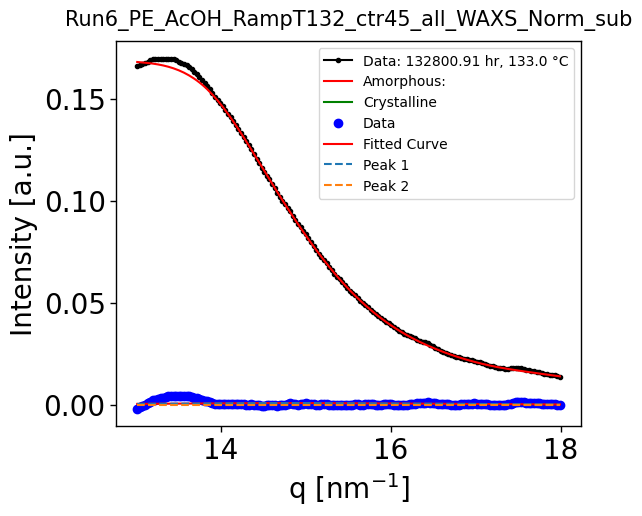

[7.19855889e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.78 ± 11.47 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT132_ctr45_all_WAXS_Norm_sub.dat_fitted.dat
47
Processing file: Run6_PE_AcOH_RampT135_ctr46_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132899.04333333333, bstop=4.58231, ctemp=134.93776666666665, I0=21.010256666666667
Fitting 2 peaks with initial guess: [7.19855889e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0007319579162558196, 15.795304561123928, 1.0, 0.0005278567073097248, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.0007319579162558196, 15.795304561123928, 1.0, 0.0005278567073097248, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [8.68553676e-04 1.48000780e+01 1.00000000e+00

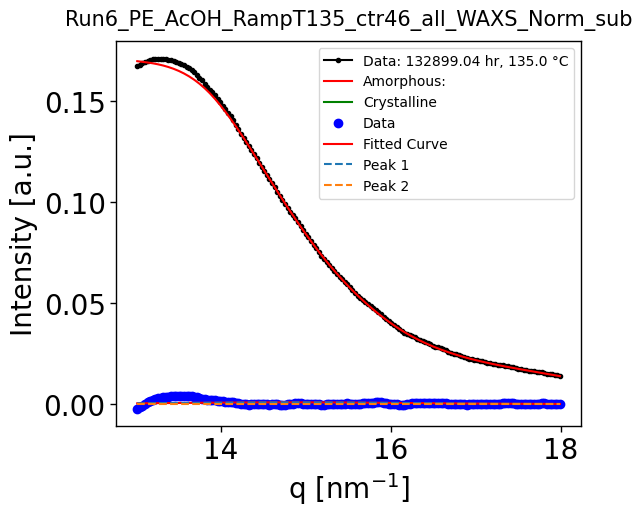

[8.68553676e-04 1.48000780e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.83 ± 11.10 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT135_ctr46_all_WAXS_Norm_sub.dat_fitted.dat
48
Processing file: Run6_PE_AcOH_RampT137_ctr47_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=132998.07666666666, bstop=4.57566, ctemp=137.31610333333333, I0=20.937473333333333
Fitting 2 peaks with initial guess: [8.68553676e-04 1.48000780e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0006439992969319852, 15.795304561123928, 1.0, 0.0010511484128978045, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.0006439992969319852, 15.795304561123928, 1.0, 0.0010511484128978045, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [7.77147080e-04 1.48000000e+01 1.00000000e+

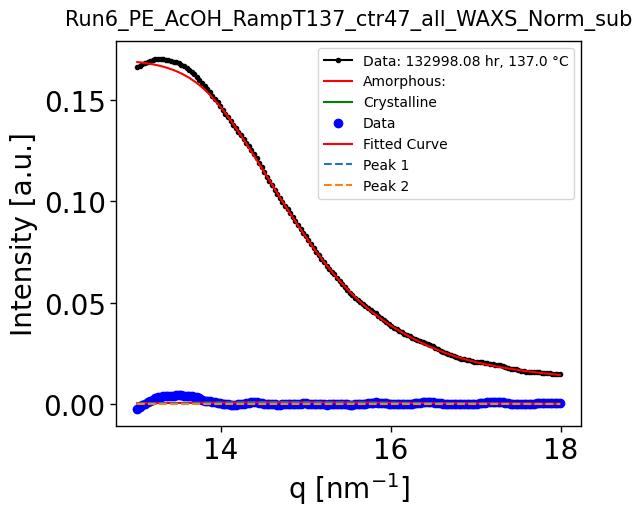

[7.7714708e-04 1.4800000e+01 1.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
percentage_crytallinity: 0.80 ± 11.38 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT137_ctr47_all_WAXS_Norm_sub.dat_fitted.dat
49
Processing file: Run6_PE_AcOH_RampT140_ctr48_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133096.78, bstop=4.55837, ctemp=139.81126666666668, I0=20.838913333333334
Fitting 2 peaks with initial guess: [7.7714708e-04 1.4800000e+01 1.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
Adjusted initial guess: [0.000981046161680696, 15.2763974228987, 1.0, 0.000407249802927806, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.000981046161680696, 15.2763974228987, 1.0, 0.000407249802927806, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [1.45856814e-03 1.48000001e+01 1.00000000e+00 5.22584991e-17
 1.71988639e+

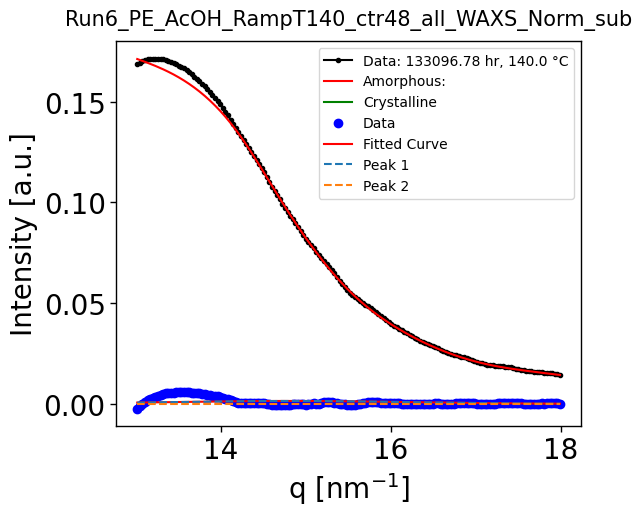

[1.45856814e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.36 ± 11.33 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT140_ctr48_all_WAXS_Norm_sub.dat_fitted.dat
50
Processing file: Run6_PE_AcOH_RampT142_ctr49_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133199.83666666667, bstop=4.598496666666667, ctemp=142.22546333333332, I0=20.95727666666667
Fitting 2 peaks with initial guess: [1.45856814e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0005098613156772486, 15.306921372206068, 1.0, 0.0005941785629850586, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.0005098613156772486, 15.306921372206068, 1.0, 0.0005941785629850586, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [1.37458473e-03 1.48000000e+01 1.0

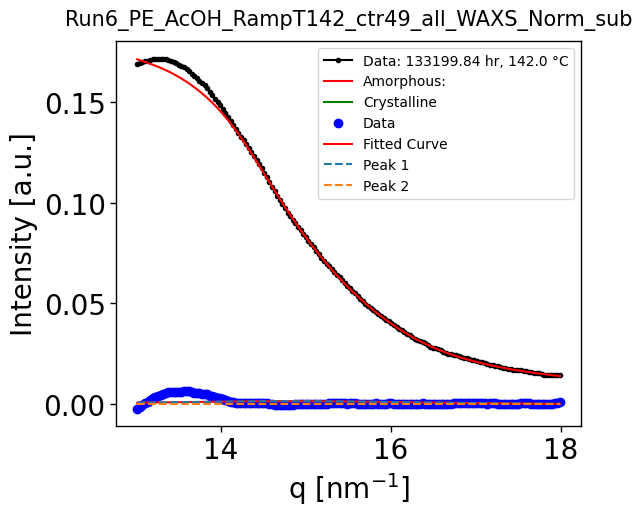

[1.37458473e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.27 ± 11.16 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT142_ctr49_all_WAXS_Norm_sub.dat_fitted.dat
51
Processing file: Run6_PE_AcOH_RampT145_ctr50_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133303.72, bstop=4.591516666666666, ctemp=144.67409666666666, I0=20.85127
Fitting 2 peaks with initial guess: [1.37458473e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0008146807102961673, 15.398493220128167, 1.0, 0.0008389548366598033, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.0008146807102961673, 15.398493220128167, 1.0, 0.0008389548366598033, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [6.59147379e-04 1.48000000e+01 1.00000000e+00 1.6492

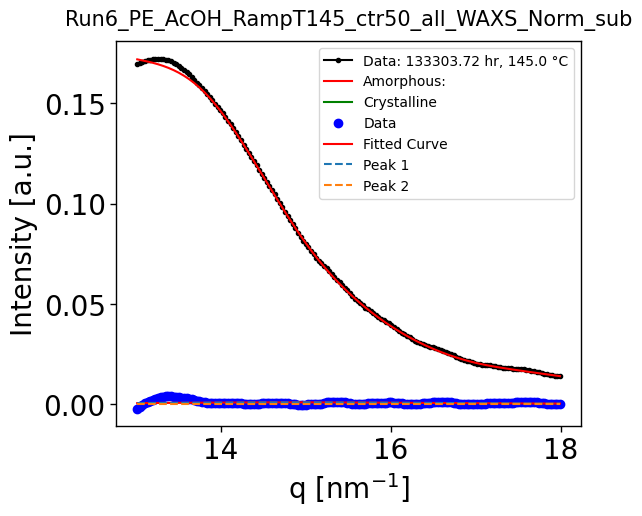

[6.59147379e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.69 ± 11.44 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT145_ctr50_all_WAXS_Norm_sub.dat_fitted.dat
52
Processing file: Run6_PE_AcOH_RampT147_ctr51_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133410.34, bstop=4.573286666666667, ctemp=147.1027333333333, I0=20.775503333333333
Fitting 2 peaks with initial guess: [6.59147379e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.00041948067862310895, 15.429017169435532, 1.0, 0.00043180339850591373, 17.046786482725945, 1.1999999999999993]
Attempt 1 with initial guess: [0.00041948067862310895, 15.429017169435532, 1.0, 0.00043180339850591373, 17.046786482725945, 1.1999999999999993]
Fitted parameters: [9.74646584e-04 1.48000000e+01 1.000000

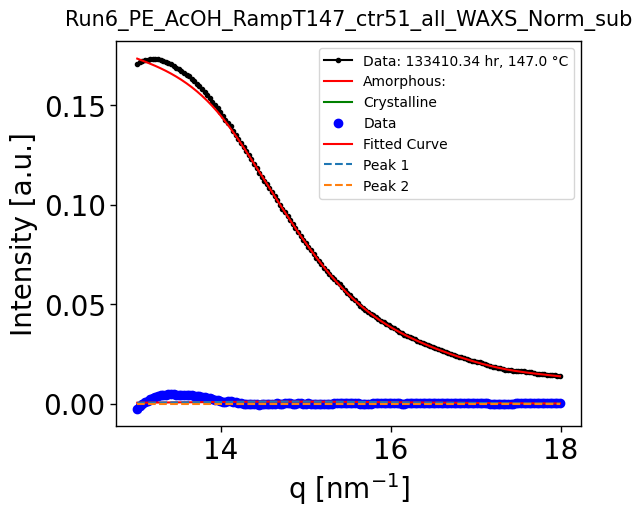

[9.74646584e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.96 ± 11.52 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT147_ctr51_all_WAXS_Norm_sub.dat_fitted.dat
53
Processing file: Run6_PE_AcOH_RampT150_ctr52_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133518.79666666666, bstop=4.621903333333333, ctemp=149.53719666666666, I0=20.92663333333333
Fitting 2 peaks with initial guess: [9.74646584e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0007774090048452142, 15.245873473591335, 1.0, 0.0005343804787833195, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.0007774090048452142, 15.245873473591335, 1.0, 0.0005343804787833195, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [7.06459276e-04 1.48000000e+01 1.000

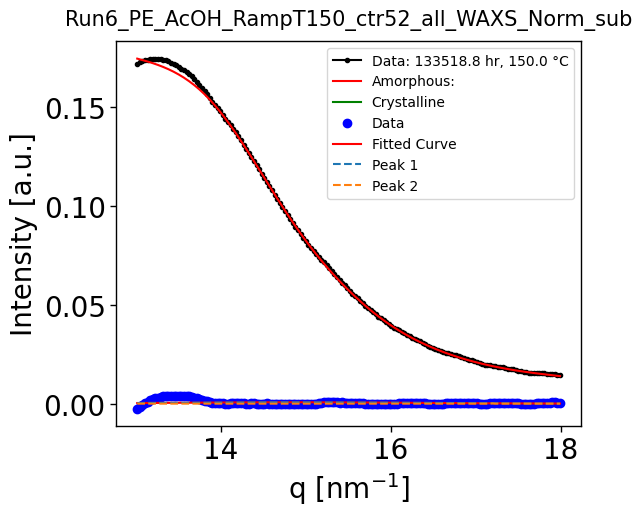

[7.06459276e-04 1.48000000e+01 1.00000000e+00 1.71493979e-03
 1.72000000e+01 1.81251099e-04]
percentage_crytallinity: 0.72 ± 11.05 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT150_ctr52_all_WAXS_Norm_sub.dat_fitted.dat
54
Processing file: Run6_PE_AcOH_RampT152_ctr53_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133629.31333333332, bstop=4.60995, ctemp=152.0456, I0=20.84051666666667
Fitting 2 peaks with initial guess: [7.06459276e-04 1.48000000e+01 1.00000000e+00 1.71493979e-03
 1.72000000e+01 1.81251099e-04]
Adjusted initial guess: [0.0008699191495056546, 15.795304561123928, 1.0, 0.001336746075272819, 16.314211699349155, 1.1999999999999993]
Attempt 1 with initial guess: [0.0008699191495056546, 15.795304561123928, 1.0, 0.001336746075272819, 16.314211699349155, 1.1999999999999993]
Fitted parameters: [2.80100847e-03 1.48000000e+01 1.00000000e+00 9.59532109

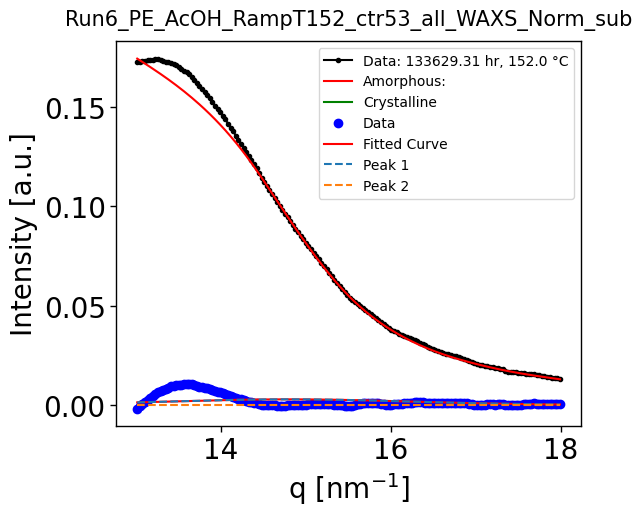

[2.80100847e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 2.58 ± 11.30 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT152_ctr53_all_WAXS_Norm_sub.dat_fitted.dat
55
Processing file: Run6_PE_AcOH_RampT155_ctr54_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133743.61666666667, bstop=4.60219, ctemp=154.522, I0=20.718186666666668
Fitting 2 peaks with initial guess: [2.80100847e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0009809581992417382, 15.184825574976603, 1.0, 0.000546018928018973, 16.34473564865652, 1.1999999999999993]
Attempt 1 with initial guess: [0.0009809581992417382, 15.184825574976603, 1.0, 0.000546018928018973, 16.34473564865652, 1.1999999999999993]
Fitted parameters: [8.81844958e-04 1.48000025e+01 1.00000000e+00 1.92328924e-

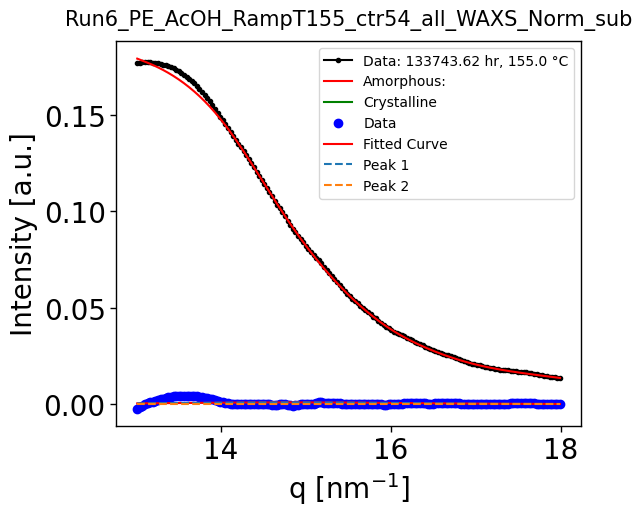

[8.81844958e-04 1.48000025e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.84 ± 11.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT155_ctr54_all_WAXS_Norm_sub.dat_fitted.dat
56
Processing file: Run6_PE_AcOH_RampT157_ctr55_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133861.96333333335, bstop=4.656586666666667, ctemp=156.9715666666667, I0=20.88226
Fitting 2 peaks with initial guess: [8.81844958e-04 1.48000025e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.000669813954670237, 15.398493220128167, 1.0, 0.0007793826883004396, 16.34473564865652, 1.1999999999999993]
Attempt 1 with initial guess: [0.000669813954670237, 15.398493220128167, 1.0, 0.0007793826883004396, 16.34473564865652, 1.1999999999999993]
Fitted parameters: [8.40592604e-04 1.48000003e+01 1.00000000e+00 6.

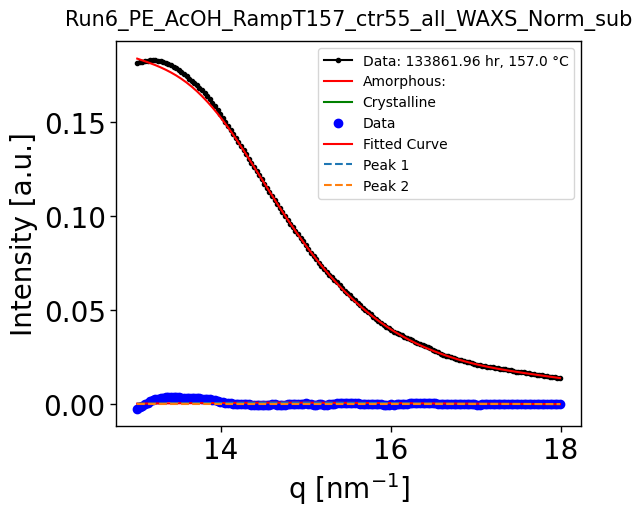

[8.40592604e-04 1.48000003e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.78 ± 10.60 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT157_ctr55_all_WAXS_Norm_sub.dat_fitted.dat
57
Processing file: Run6_PE_AcOH_RampT160_ctr56_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=133984.41666666666, bstop=4.651223333333333, ctemp=159.39366666666666, I0=20.735780000000002
Fitting 2 peaks with initial guess: [8.40592604e-04 1.48000003e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.00021179596327650096, 15.306921372206068, 1.0, 0.0006345053760419689, 16.28368775004179, 1.1999999999999993]
Attempt 1 with initial guess: [0.00021179596327650096, 15.306921372206068, 1.0, 0.0006345053760419689, 16.28368775004179, 1.1999999999999993]
Fitted parameters: [7.45691877e-04 1.48000000e+01 1.

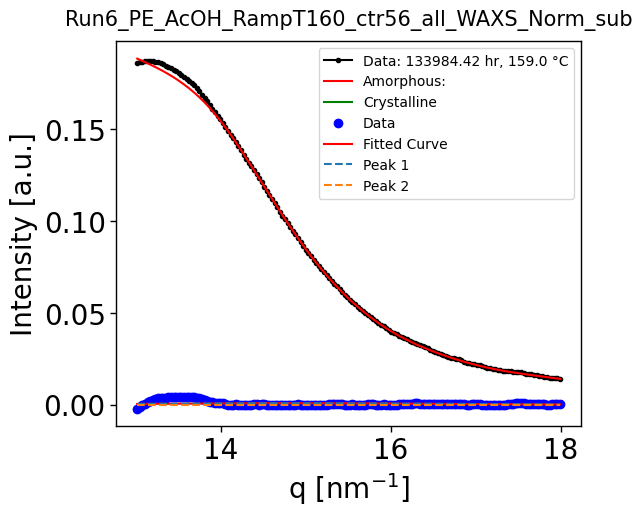

[7.45691877e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.74 ± 10.52 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run6_PE_AcOH_RampT160_ctr56_all_WAXS_Norm_sub.dat_fitted.dat
filename: 57
timer: 57
CTEMP: 57
I0: 57
bstop: 57
crystal: 57
Amorphous: 57
percentage_crytallinity: 57
percentage_crytallinity_error: 57
peak1_values: 57
peak1_values_error: 57
peak2_values: 57
peak2_values_error: 57


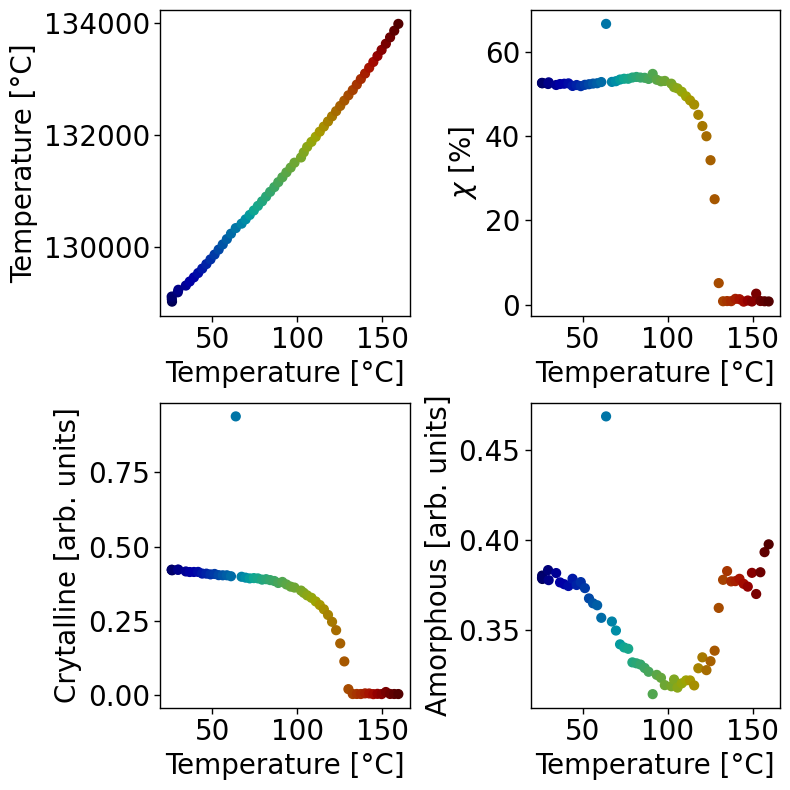

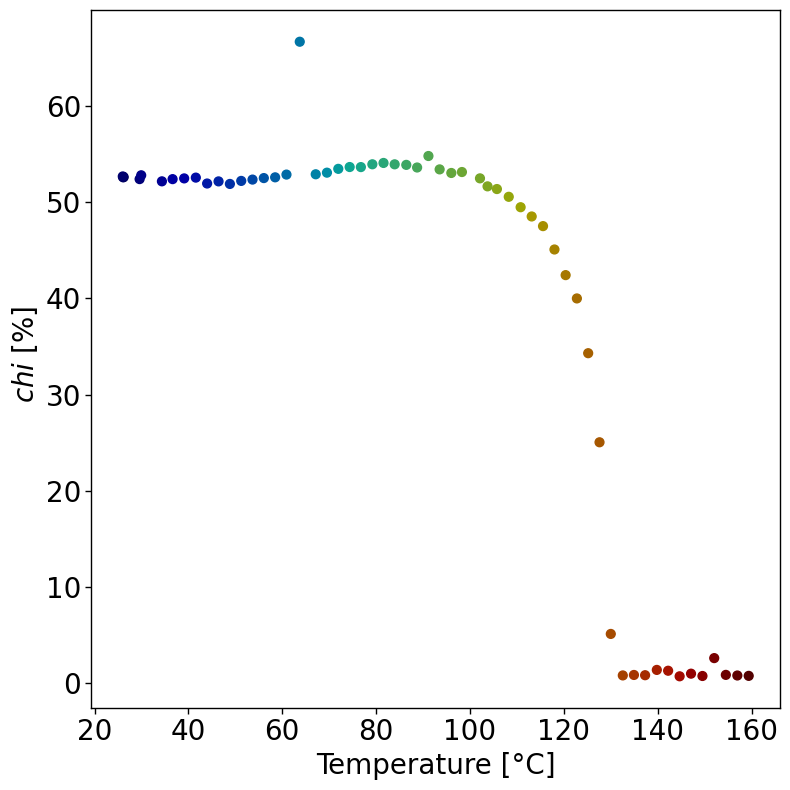

[9.40263587, 15.19262149, 0.13692225, 2.04649794, 16.85926851, 0.17693848]
Matching files for Run8_PE_Salt_RampT: ['Run8_PE_Salt_RampT20_ctr0_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT22_ctr1_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT25_ctr2_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT27_ctr3_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT30_ctr4_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT32_ctr5_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT35_ctr6_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT37_ctr7_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT40_ctr8_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT42_ctr9_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT45_ctr10_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT47_ctr11_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT50_ctr12_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT52_ctr13_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT55_ctr14_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT57_ctr15_all_WAXS_Norm_sub.dat', 'Run8_PE_Salt_RampT60_ctr16_all_WAXS_Norm_sub.dat', 'Run8_PE_Sa

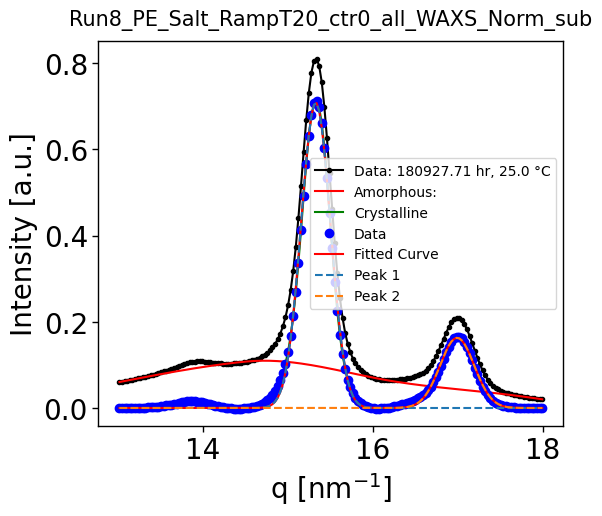

[ 0.70849856 15.32754467  0.12146763  0.1627433  16.99161011  0.14227821]
percentage_crytallinity: 52.83 ± 6.14 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT20_ctr0_all_WAXS_Norm_sub.dat_fitted.dat
2
Processing file: Run8_PE_Salt_RampT22_ctr1_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=180974.04333333333, bstop=4.737283333333333, ctemp=25.447500333333334, I0=20.72266
Fitting 2 peaks with initial guess: [ 0.70849856 15.32754467  0.12146763  0.1627433  16.99161011  0.14227821]
Adjusted initial guess: [0.7166537432865714, 15.337445321513435, 1.0, 0.16694254206779882, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7166537432865714, 15.337445321513435, 1.0, 0.16694254206779882, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71186759 15.32751837  0.12145736  0.16391785 16.99129844  0.14310729]


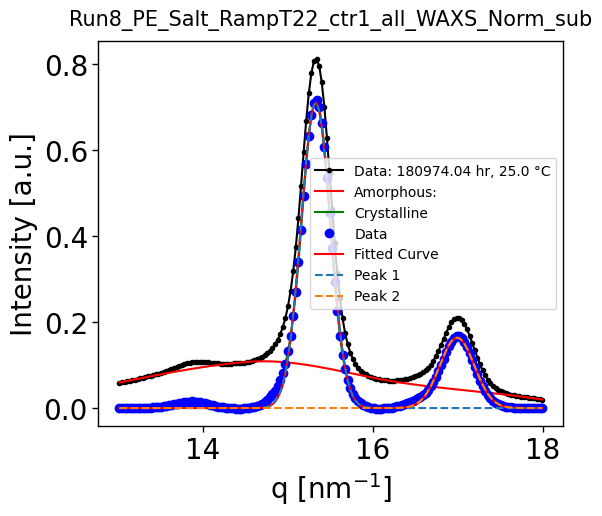

[ 0.71186759 15.32751837  0.12145736  0.16391785 16.99129844  0.14310729]
percentage_crytallinity: 53.01 ± 6.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT22_ctr1_all_WAXS_Norm_sub.dat_fitted.dat
3
Processing file: Run8_PE_Salt_RampT25_ctr2_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181019.1, bstop=4.723153333333333, ctemp=25.405586, I0=20.68992
Fitting 2 peaks with initial guess: [ 0.71186759 15.32751837  0.12145736  0.16391785 16.99129844  0.14310729]
Adjusted initial guess: [0.7178750107536022, 15.337445321513435, 1.0, 0.1676303833467255, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7178750107536022, 15.337445321513435, 1.0, 0.1676303833467255, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.71335897 15.32800684  0.12119278  0.16478354 16.99283993  0.14231028]


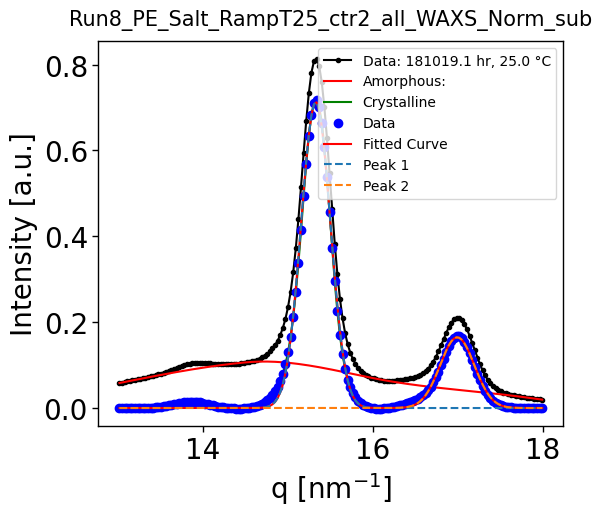

[ 0.71335897 15.32800684  0.12119278  0.16478354 16.99283993  0.14231028]
percentage_crytallinity: 53.30 ± 6.26 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT25_ctr2_all_WAXS_Norm_sub.dat_fitted.dat
4
Processing file: Run8_PE_Salt_RampT27_ctr3_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181094.79, bstop=4.7158066666666665, ctemp=31.668273, I0=20.617606666666667
Fitting 2 peaks with initial guess: [ 0.71335897 15.32800684  0.12119278  0.16478354 16.99283993  0.14231028]
Adjusted initial guess: [0.7085693304474266, 15.337445321513435, 1.0, 0.16610043855447595, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7085693304474266, 15.337445321513435, 1.0, 0.16610043855447595, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.70557143 15.3201004   0.1212575   0.16278277 16.97102315  0.14229107]


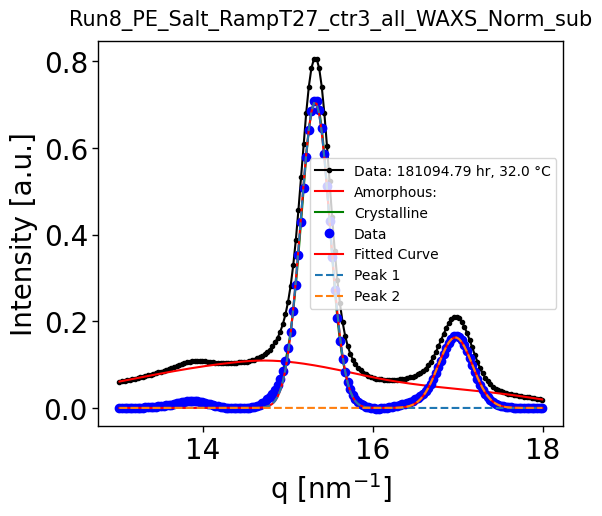

[ 0.70557143 15.3201004   0.1212575   0.16278277 16.97102315  0.14229107]
percentage_crytallinity: 52.59 ± 6.23 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT27_ctr3_all_WAXS_Norm_sub.dat_fitted.dat
5
Processing file: Run8_PE_Salt_RampT30_ctr4_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181139.93000000002, bstop=4.7029, ctemp=32.05538, I0=20.57220666666667
Fitting 2 peaks with initial guess: [ 0.70557143 15.3201004   0.1212575   0.16278277 16.97102315  0.14229107]
Adjusted initial guess: [0.7081786011709512, 15.306921372206068, 1.0, 0.16727720576303817, 16.985738584111214, 1.1999999999999993]
Attempt 1 with initial guess: [0.7081786011709512, 15.306921372206068, 1.0, 0.16727720576303817, 16.985738584111214, 1.1999999999999993]
Fitted parameters: [ 0.70585759 15.31818973  0.12113992  0.16401324 16.96623256  0.14210166]


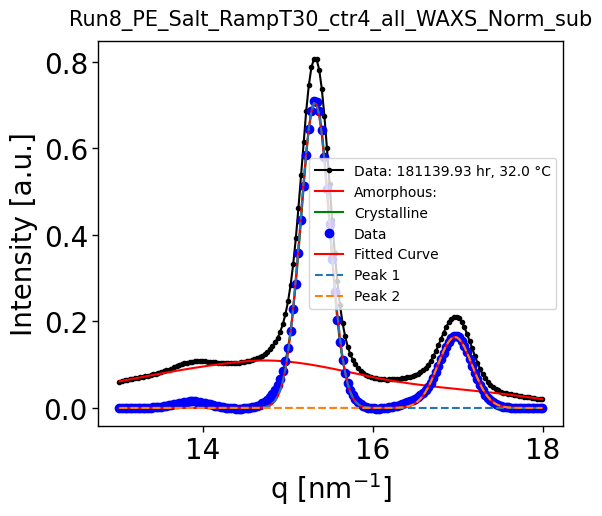

[ 0.70585759 15.31818973  0.12113992  0.16401324 16.96623256  0.14210166]
percentage_crytallinity: 52.51 ± 6.24 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT30_ctr4_all_WAXS_Norm_sub.dat_fitted.dat
6
Processing file: Run8_PE_Salt_RampT32_ctr5_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181211.29666666663, bstop=4.756923333333333, ctemp=36.05521666666667, I0=20.86673
Fitting 2 peaks with initial guess: [ 0.70585759 15.31818973  0.12113992  0.16401324 16.96623256  0.14210166]
Adjusted initial guess: [0.6958356468523843, 15.306921372206068, 1.0, 0.16396121570954209, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.6958356468523843, 15.306921372206068, 1.0, 0.16396121570954209, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.69179292 15.31290327  0.12129443  0.16077494 16.9521279   0.14214385]


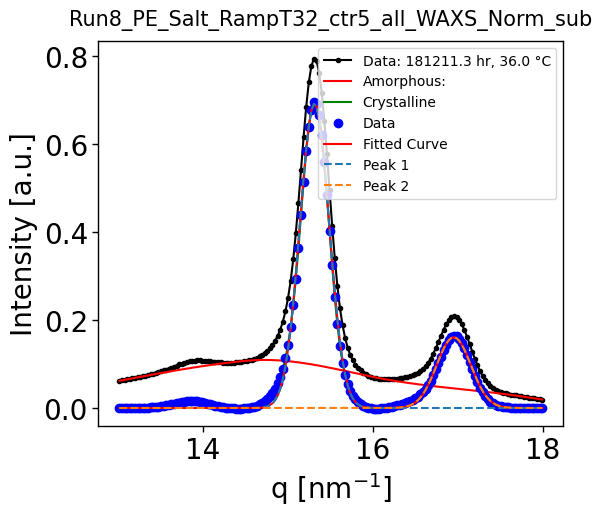

[ 0.69179292 15.31290327  0.12129443  0.16077494 16.9521279   0.14214385]
percentage_crytallinity: 52.17 ± 6.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT32_ctr5_all_WAXS_Norm_sub.dat_fitted.dat
7
Processing file: Run8_PE_Salt_RampT35_ctr6_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181256.31999999998, bstop=4.747656666666667, ctemp=36.286282666666665, I0=20.762676666666668
Fitting 2 peaks with initial guess: [ 0.69179292 15.31290327  0.12129443  0.16077494 16.9521279   0.14214385]
Adjusted initial guess: [0.6972239106683612, 15.306921372206068, 1.0, 0.1655182957056139, 16.95521463480385, 1.1999999999999993]
Attempt 1 with initial guess: [0.6972239106683612, 15.306921372206068, 1.0, 0.1655182957056139, 16.95521463480385, 1.1999999999999993]
Fitted parameters: [ 0.69368443 15.31171031  0.12072049  0.1620864  16.94631776  0.14390144]


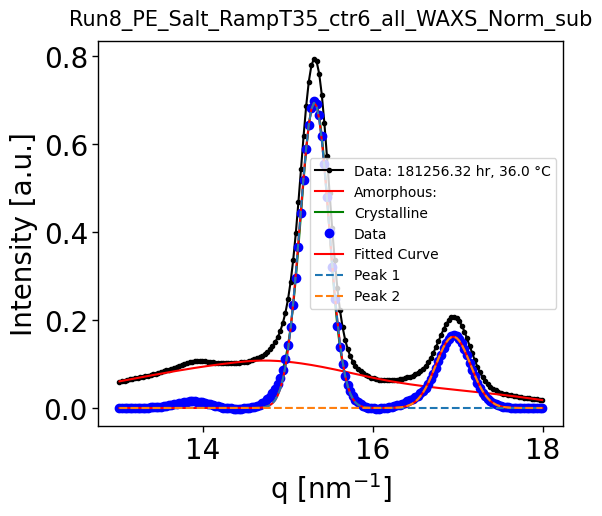

[ 0.69368443 15.31171031  0.12072049  0.1620864  16.94631776  0.14390144]
percentage_crytallinity: 52.85 ± 6.32 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT35_ctr6_all_WAXS_Norm_sub.dat_fitted.dat
8
Processing file: Run8_PE_Salt_RampT37_ctr7_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181331.87333333332, bstop=4.733536666666667, ctemp=41.179870666666666, I0=20.676893333333336
Fitting 2 peaks with initial guess: [ 0.69368443 15.31171031  0.12072049  0.1620864  16.94631776  0.14390144]
Adjusted initial guess: [0.6966712254895217, 15.306921372206068, 1.0, 0.16455347070283213, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6966712254895217, 15.306921372206068, 1.0, 0.16455347070283213, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.69160306 15.30553542  0.12134938  0.16169005 16.92784499  0.14308668]


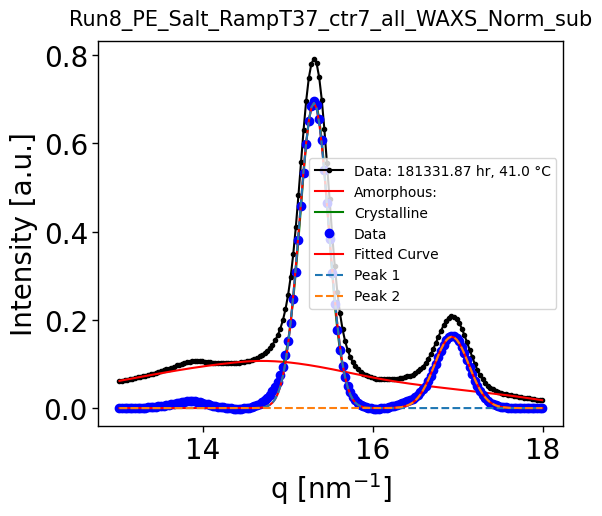

[ 0.69160306 15.30553542  0.12134938  0.16169005 16.92784499  0.14308668]
percentage_crytallinity: 52.79 ± 6.33 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT37_ctr7_all_WAXS_Norm_sub.dat_fitted.dat
9
Processing file: Run8_PE_Salt_RampT40_ctr8_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181376.86666666667, bstop=4.72463, ctemp=40.83014933333333, I0=20.68601
Fitting 2 peaks with initial guess: [ 0.69160306 15.30553542  0.12134938  0.16169005 16.92784499  0.14308668]
Adjusted initial guess: [0.6962369188631291, 15.306921372206068, 1.0, 0.16547471956128557, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6962369188631291, 15.306921372206068, 1.0, 0.16547471956128557, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.69140855 15.30504511  0.12114235  0.16254621 16.92565417  0.14123031]


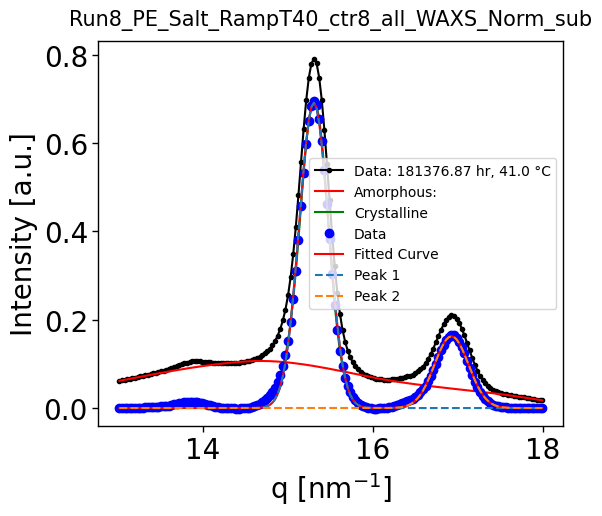

[ 0.69140855 15.30504511  0.12114235  0.16254621 16.92565417  0.14123031]
percentage_crytallinity: 52.58 ± 6.34 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT40_ctr8_all_WAXS_Norm_sub.dat_fitted.dat
10
Processing file: Run8_PE_Salt_RampT42_ctr9_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181455.61666666667, bstop=4.714276666666667, ctemp=46.019339, I0=20.54928666666667
Fitting 2 peaks with initial guess: [ 0.69140855 15.30504511  0.12114235  0.16254621 16.92565417  0.14123031]
Adjusted initial guess: [0.6964351884432093, 15.306921372206068, 1.0, 0.16346233484590564, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6964351884432093, 15.306921372206068, 1.0, 0.16346233484590564, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.69185691 15.29829233  0.12137639  0.16071011 16.90527862  0.14181637]


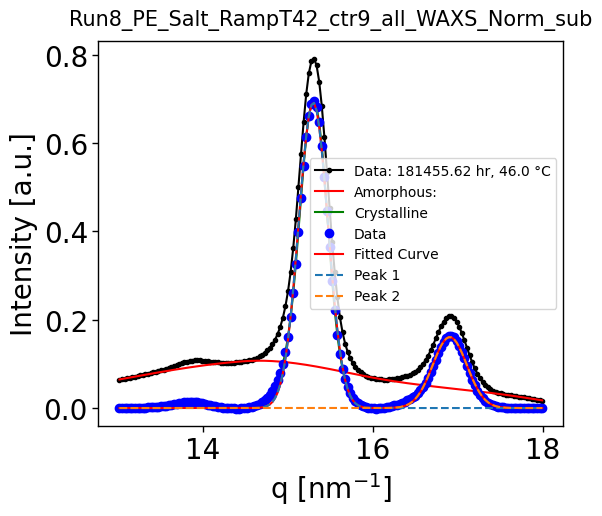

[ 0.69185691 15.29829233  0.12137639  0.16071011 16.90527862  0.14181637]
percentage_crytallinity: 52.44 ± 6.36 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT42_ctr9_all_WAXS_Norm_sub.dat_fitted.dat
11
Processing file: Run8_PE_Salt_RampT45_ctr10_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181500.53333333333, bstop=4.76238, ctemp=45.26894000000001, I0=20.818753333333333
Fitting 2 peaks with initial guess: [ 0.69185691 15.29829233  0.12137639  0.16071011 16.90527862  0.14181637]
Adjusted initial guess: [0.6867273068002383, 15.306921372206068, 1.0, 0.16261837374050142, 16.92469068549648, 1.1999999999999993]
Attempt 1 with initial guess: [0.6867273068002383, 15.306921372206068, 1.0, 0.16261837374050142, 16.92469068549648, 1.1999999999999993]
Fitted parameters: [ 0.68204219 15.29822145  0.12125316  0.15968967 16.90304573  0.14234511]


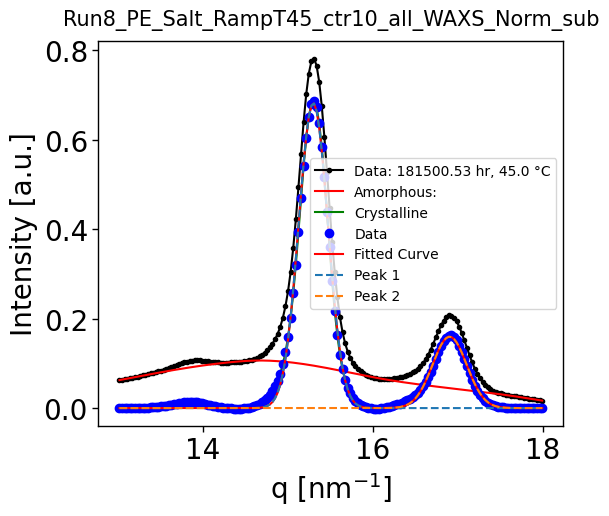

[ 0.68204219 15.29822145  0.12125316  0.15968967 16.90304573  0.14234511]
percentage_crytallinity: 52.32 ± 6.31 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT45_ctr10_all_WAXS_Norm_sub.dat_fitted.dat
12
Processing file: Run8_PE_Salt_RampT47_ctr11_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181570.44666666666, bstop=4.753076666666666, ctemp=50.83456433333333, I0=20.744533333333333
Fitting 2 peaks with initial guess: [ 0.68204219 15.29822145  0.12125316  0.15968967 16.90304573  0.14234511]
Adjusted initial guess: [0.6811574640116761, 15.306921372206068, 1.0, 0.1621105524075622, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.6811574640116761, 15.306921372206068, 1.0, 0.1621105524075622, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.67860089 15.29097485  0.12103191  0.15909166 16.88093965  0.14359476]


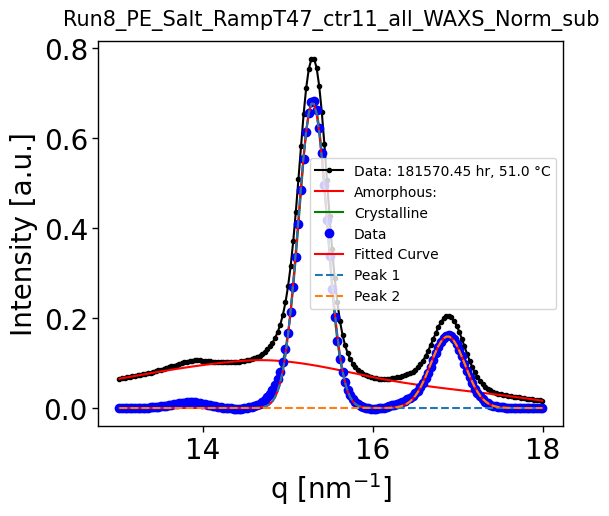

[ 0.67860089 15.29097485  0.12103191  0.15909166 16.88093965  0.14359476]
percentage_crytallinity: 52.32 ± 6.38 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT47_ctr11_all_WAXS_Norm_sub.dat_fitted.dat
13
Processing file: Run8_PE_Salt_RampT50_ctr12_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181614.9833333333, bstop=4.747753333333333, ctemp=49.96953566666667, I0=20.728189999999998
Fitting 2 peaks with initial guess: [ 0.67860089 15.29097485  0.12103191  0.15909166 16.88093965  0.14359476]
Adjusted initial guess: [0.6813724190595689, 15.306921372206068, 1.0, 0.16392937045225078, 16.894166736189113, 1.1999999999999993]
Attempt 1 with initial guess: [0.6813724190595689, 15.306921372206068, 1.0, 0.16392937045225078, 16.894166736189113, 1.1999999999999993]
Fitted parameters: [ 0.67857895 15.29118998  0.12092669  0.16070884 16.87893124  0.1428373 ]


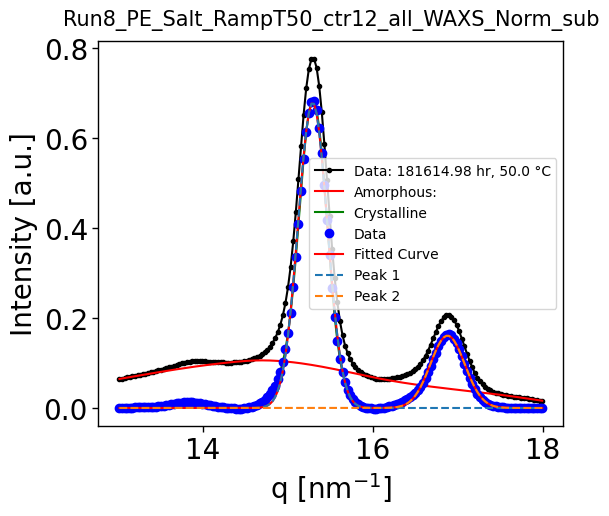

[ 0.67857895 15.29118998  0.12092669  0.16070884 16.87893124  0.1428373 ]
percentage_crytallinity: 52.48 ± 6.40 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT50_ctr12_all_WAXS_Norm_sub.dat_fitted.dat
14
Processing file: Run8_PE_Salt_RampT52_ctr13_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181674.92333333334, bstop=4.74007, ctemp=53.592823, I0=20.64191
Fitting 2 peaks with initial guess: [ 0.67857895 15.29118998  0.12092669  0.16070884 16.87893124  0.1428373 ]
Adjusted initial guess: [0.6814435411122276, 15.2763974228987, 1.0, 0.163544223556516, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6814435411122276, 15.2763974228987, 1.0, 0.163544223556516, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.67877563 15.28570763  0.12075357  0.160645   16.8643256   0.14186621]


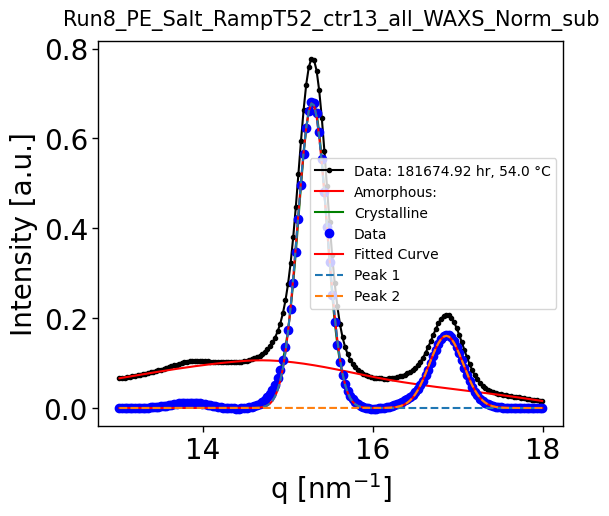

[ 0.67877563 15.28570763  0.12075357  0.160645   16.8643256   0.14186621]
percentage_crytallinity: 52.12 ± 6.40 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT52_ctr13_all_WAXS_Norm_sub.dat_fitted.dat
15
Processing file: Run8_PE_Salt_RampT55_ctr14_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181756.22333333336, bstop=4.723019999999999, ctemp=57.997149, I0=20.57406333333333
Fitting 2 peaks with initial guess: [ 0.67877563 15.28570763  0.12075357  0.160645   16.8643256   0.14186621]
Adjusted initial guess: [0.6809532238495561, 15.2763974228987, 1.0, 0.1652029534249552, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6809532238495561, 15.2763974228987, 1.0, 0.1652029534249552, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.67703481 15.27999489  0.12070379  0.16198015 16.84323924  0.14368623]


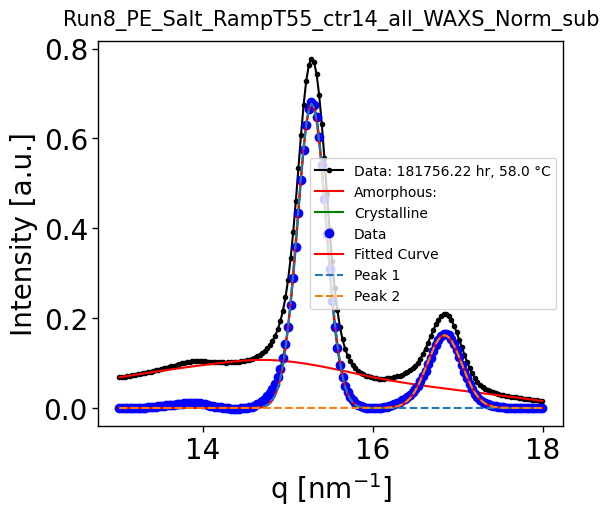

[ 0.67703481 15.27999489  0.12070379  0.16198015 16.84323924  0.14368623]
percentage_crytallinity: 52.19 ± 6.42 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT55_ctr14_all_WAXS_Norm_sub.dat_fitted.dat
16
Processing file: Run8_PE_Salt_RampT57_ctr15_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181801.55999999997, bstop=4.769909999999999, ctemp=57.61213066666667, I0=20.781859999999998
Fitting 2 peaks with initial guess: [ 0.67703481 15.27999489  0.12070379  0.16198015 16.84323924  0.14368623]
Adjusted initial guess: [0.6759968369360501, 15.2763974228987, 1.0, 0.1651552877498837, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.6759968369360501, 15.2763974228987, 1.0, 0.1651552877498837, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [ 0.67240887 15.27996184  0.12038845  0.16206483 16.84309827  0.143883  ]


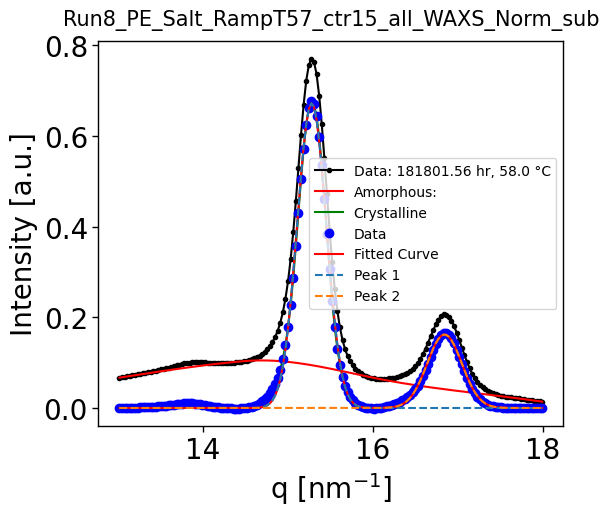

[ 0.67240887 15.27996184  0.12038845  0.16206483 16.84309827  0.143883  ]
percentage_crytallinity: 52.65 ± 6.47 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT57_ctr15_all_WAXS_Norm_sub.dat_fitted.dat
17
Processing file: Run8_PE_Salt_RampT60_ctr16_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181851.64666666664, bstop=4.762383333333333, ctemp=60.186577, I0=20.777676666666668
Fitting 2 peaks with initial guess: [ 0.67240887 15.27996184  0.12038845  0.16206483 16.84309827  0.143883  ]
Adjusted initial guess: [0.6733974682121028, 15.2763974228987, 1.0, 0.16509170270277296, 16.833118837574382, 1.1999999999999993]
Attempt 1 with initial guess: [0.6733974682121028, 15.2763974228987, 1.0, 0.16509170270277296, 16.833118837574382, 1.1999999999999993]
Fitted parameters: [ 0.66885965 15.2760082   0.12085811  0.162477   16.82981147  0.14092268]


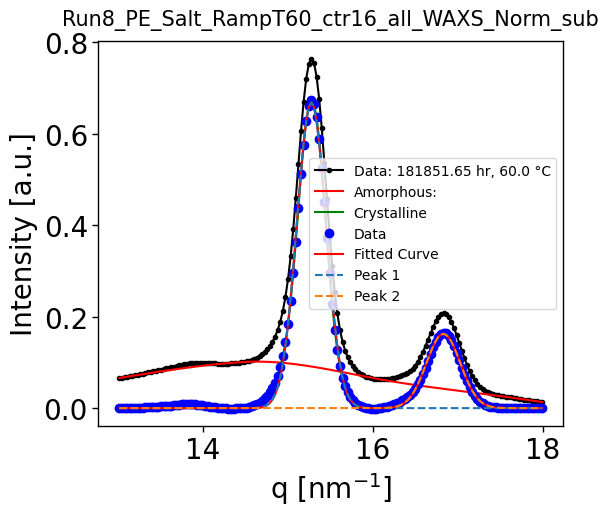

[ 0.66885965 15.2760082   0.12085811  0.162477   16.82981147  0.14092268]
percentage_crytallinity: 52.90 ± 6.56 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT60_ctr16_all_WAXS_Norm_sub.dat_fitted.dat
18
Processing file: Run8_PE_Salt_RampT62_ctr17_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181927.50333333333, bstop=4.75411, ctemp=65.19823466666666, I0=20.67854
Fitting 2 peaks with initial guess: [ 0.66885965 15.2760082   0.12085811  0.162477   16.82981147  0.14092268]
Adjusted initial guess: [0.6710426363219557, 15.2763974228987, 1.0, 0.16430236836732173, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.6710426363219557, 15.2763974228987, 1.0, 0.16430236836732173, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.66731146 15.26866679  0.1199627   0.16170459 16.80452555  0.14188463]


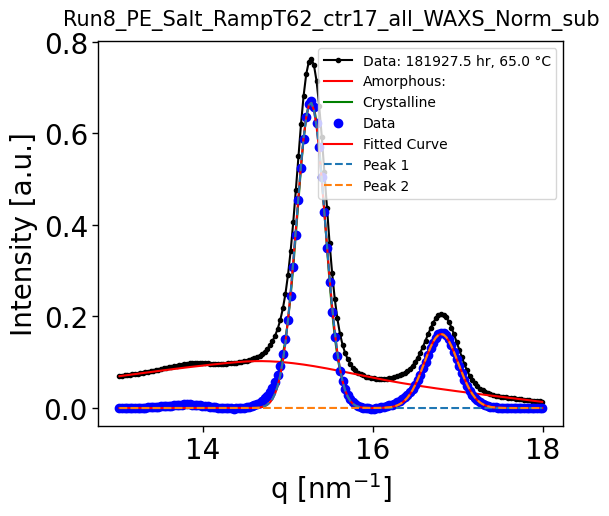

[ 0.66731146 15.26866679  0.1199627   0.16170459 16.80452555  0.14188463]
percentage_crytallinity: 52.58 ± 6.61 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT62_ctr17_all_WAXS_Norm_sub.dat_fitted.dat
19
Processing file: Run8_PE_Salt_RampT65_ctr18_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=181971.77000000002, bstop=4.741376666666667, ctemp=64.80197266666666, I0=20.70311
Fitting 2 peaks with initial guess: [ 0.66731146 15.26866679  0.1199627   0.16170459 16.80452555  0.14188463]
Adjusted initial guess: [0.673743838520574, 15.2763974228987, 1.0, 0.1667423346100164, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.673743838520574, 15.2763974228987, 1.0, 0.1667423346100164, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.66952239 15.26915282  0.11999997  0.16417444 16.80444766  0.14187954]


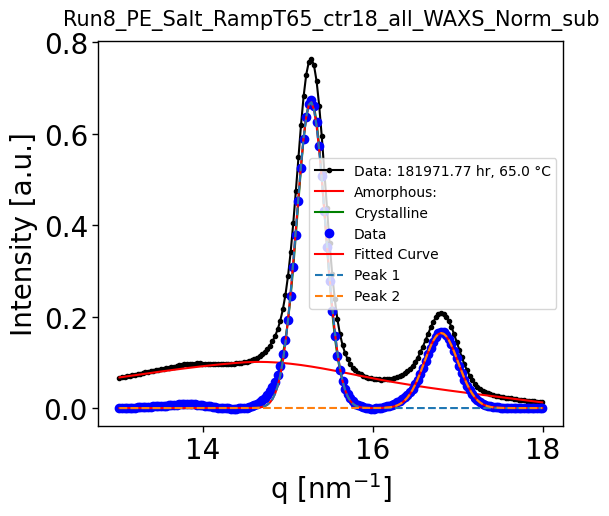

[ 0.66952239 15.26915282  0.11999997  0.16417444 16.80444766  0.14187954]
percentage_crytallinity: 53.30 ± 6.66 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT65_ctr18_all_WAXS_Norm_sub.dat_fitted.dat
20
Processing file: Run8_PE_Salt_RampT67_ctr19_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182021.67, bstop=4.736606666666667, ctemp=67.37047299999999, I0=20.59455
Fitting 2 peaks with initial guess: [ 0.66952239 15.26915282  0.11999997  0.16417444 16.80444766  0.14187954]
Adjusted initial guess: [0.6717670976142646, 15.2763974228987, 1.0, 0.16724585309884069, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.6717670976142646, 15.2763974228987, 1.0, 0.16724585309884069, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [ 0.66877587 15.26487296  0.11970481  0.1641949  16.78913734  0.14230001]


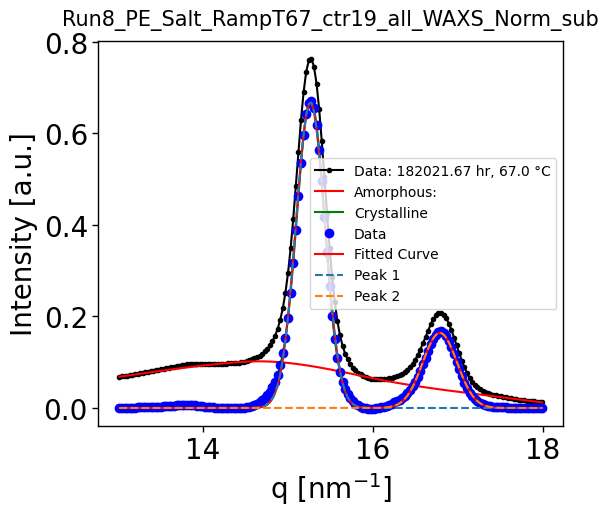

[ 0.66877587 15.26487296  0.11970481  0.1641949  16.78913734  0.14230001]
percentage_crytallinity: 53.00 ± 6.68 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT67_ctr19_all_WAXS_Norm_sub.dat_fitted.dat
21
Processing file: Run8_PE_Salt_RampT70_ctr20_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182091.6433333333, bstop=4.767446666666667, ctemp=72.37532533333335, I0=20.735463333333332
Fitting 2 peaks with initial guess: [ 0.66877587 15.26487296  0.11970481  0.1641949  16.78913734  0.14230001]
Adjusted initial guess: [0.661401867628142, 15.2763974228987, 1.0, 0.1665158506403106, 16.77207093895965, 1.1999999999999993]
Attempt 1 with initial guess: [0.661401867628142, 15.2763974228987, 1.0, 0.1665158506403106, 16.77207093895965, 1.1999999999999993]
Fitted parameters: [ 0.66042688 15.25823107  0.11915429  0.1634228  16.76401344  0.14204466]


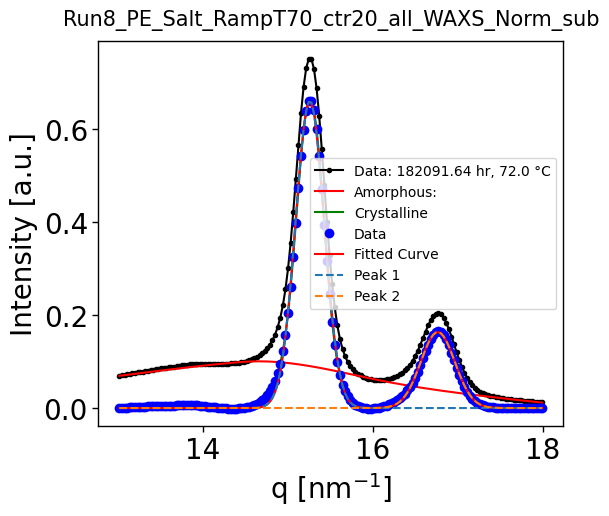

[ 0.66042688 15.25823107  0.11915429  0.1634228  16.76401344  0.14204466]
percentage_crytallinity: 53.31 ± 6.78 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT70_ctr20_all_WAXS_Norm_sub.dat_fitted.dat
22
Processing file: Run8_PE_Salt_RampT72_ctr21_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182177.93666666668, bstop=4.766303333333334, ctemp=74.770579, I0=20.74261
Fitting 2 peaks with initial guess: [ 0.66042688 15.25823107  0.11915429  0.1634228  16.76401344  0.14204466]
Adjusted initial guess: [0.6612009890369852, 15.245873473591335, 1.0, 0.16697447567361343, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.6612009890369852, 15.245873473591335, 1.0, 0.16697447567361343, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.65983244 15.25408686  0.11872606  0.1649424  16.74935022  0.14068574]


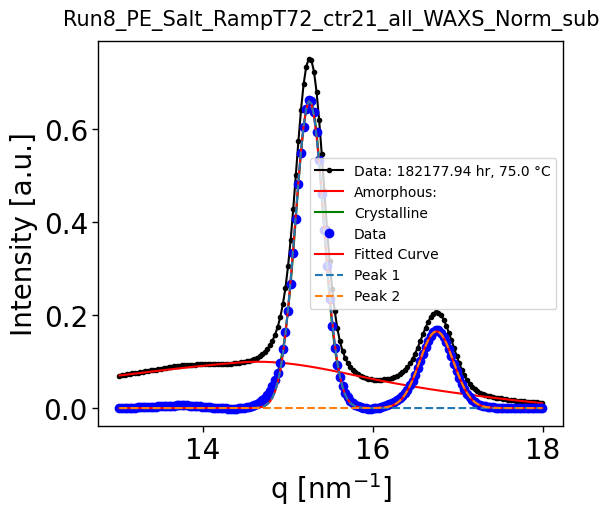

[ 0.65983244 15.25408686  0.11872606  0.1649424  16.74935022  0.14068574]
percentage_crytallinity: 53.35 ± 6.83 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT72_ctr21_all_WAXS_Norm_sub.dat_fitted.dat
23
Processing file: Run8_PE_Salt_RampT75_ctr22_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182261.70333333334, bstop=4.7461899999999995, ctemp=77.27234866666667, I0=20.64334666666667
Fitting 2 peaks with initial guess: [ 0.65983244 15.25408686  0.11872606  0.1649424  16.74935022  0.14068574]
Adjusted initial guess: [0.6648653369349162, 15.245873473591335, 1.0, 0.16726848613074008, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.6648653369349162, 15.245873473591335, 1.0, 0.16726848613074008, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.66298425 15.25055968  0.11809721  0.16479021 16.73599863  0.1400543 ]


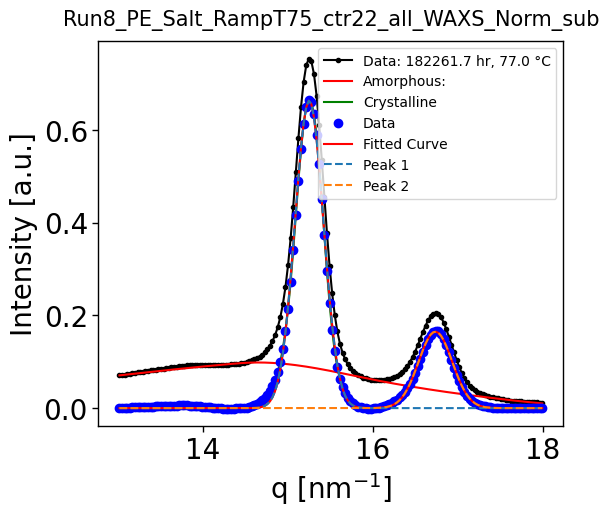

[ 0.66298425 15.25055968  0.11809721  0.16479021 16.73599863  0.1400543 ]
percentage_crytallinity: 53.63 ± 6.93 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT75_ctr22_all_WAXS_Norm_sub.dat_fitted.dat
24
Processing file: Run8_PE_Salt_RampT77_ctr23_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182345.92333333334, bstop=4.7237, ctemp=79.686994, I0=20.58277
Fitting 2 peaks with initial guess: [ 0.66298425 15.25055968  0.11809721  0.16479021 16.73599863  0.1400543 ]
Adjusted initial guess: [0.6650623577316438, 15.245873473591335, 1.0, 0.1678038612301809, 16.741546989652285, 1.1999999999999993]
Attempt 1 with initial guess: [0.6650623577316438, 15.245873473591335, 1.0, 0.1678038612301809, 16.741546989652285, 1.1999999999999993]
Fitted parameters: [ 0.66330497 15.2470406   0.11735859  0.16587763 16.72133156  0.13935063]


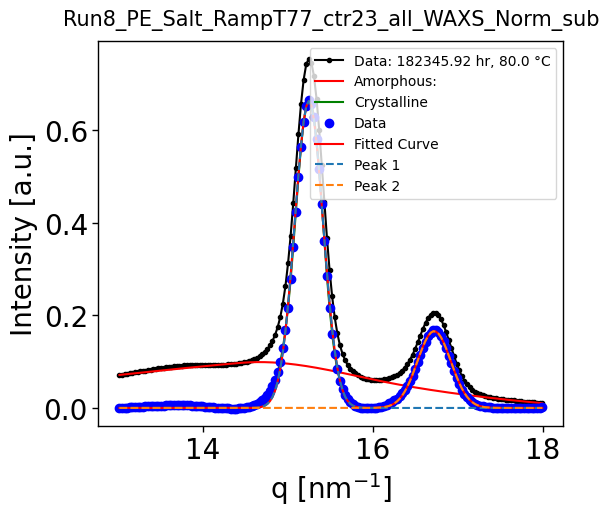

[ 0.66330497 15.2470406   0.11735859  0.16587763 16.72133156  0.13935063]
percentage_crytallinity: 53.47 ± 6.97 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT77_ctr23_all_WAXS_Norm_sub.dat_fitted.dat
25
Processing file: Run8_PE_Salt_RampT80_ctr24_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182430.94333333333, bstop=4.767316666666667, ctemp=82.09215033333334, I0=20.807506666666665
Fitting 2 peaks with initial guess: [ 0.66330497 15.2470406   0.11735859  0.16587763 16.72133156  0.13935063]
Adjusted initial guess: [0.6627595547857584, 15.245873473591335, 1.0, 0.16385676431954146, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.6627595547857584, 15.245873473591335, 1.0, 0.16385676431954146, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.66056479 15.24312901  0.11732962  0.16161865 16.7078595   0.13849754]


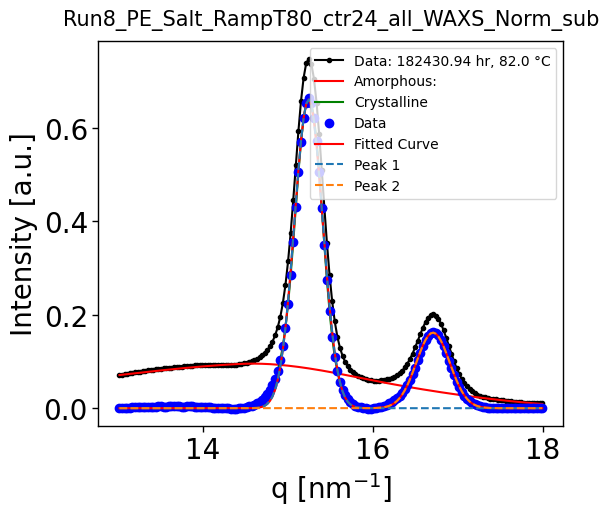

[ 0.66056479 15.24312901  0.11732962  0.16161865 16.7078595   0.13849754]
percentage_crytallinity: 53.95 ± 7.06 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT80_ctr24_all_WAXS_Norm_sub.dat_fitted.dat
26
Processing file: Run8_PE_Salt_RampT82_ctr25_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182516.55000000002, bstop=4.754133333333333, ctemp=84.52248133333335, I0=20.696056666666667
Fitting 2 peaks with initial guess: [ 0.66056479 15.24312901  0.11732962  0.16161865 16.7078595   0.13849754]
Adjusted initial guess: [0.6680055823216348, 15.245873473591335, 1.0, 0.16348384860815304, 16.71102304034492, 1.1999999999999993]
Attempt 1 with initial guess: [0.6680055823216348, 15.245873473591335, 1.0, 0.16348384860815304, 16.71102304034492, 1.1999999999999993]
Fitted parameters: [ 0.66648629 15.24023438  0.11636955  0.16185451 16.69215306  0.1382391 ]


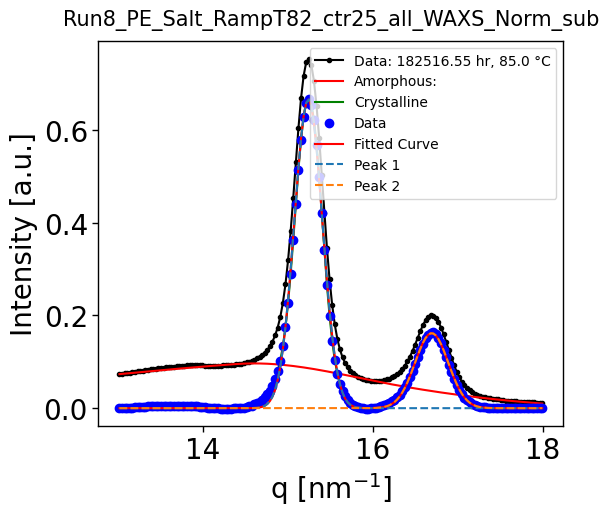

[ 0.66648629 15.24023438  0.11636955  0.16185451 16.69215306  0.1382391 ]
percentage_crytallinity: 53.76 ± 7.04 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT82_ctr25_all_WAXS_Norm_sub.dat_fitted.dat
27
Processing file: Run8_PE_Salt_RampT85_ctr26_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182603.82666666666, bstop=4.736093333333334, ctemp=86.91256700000001, I0=20.592646666666667
Fitting 2 peaks with initial guess: [ 0.66648629 15.24023438  0.11636955  0.16185451 16.69215306  0.1382391 ]
Adjusted initial guess: [0.6752658063767565, 15.245873473591335, 1.0, 0.16277773242884108, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.6752658063767565, 15.245873473591335, 1.0, 0.16277773242884108, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.6745536  15.23626889  0.11598909  0.16105819 16.67876913  0.13804494]


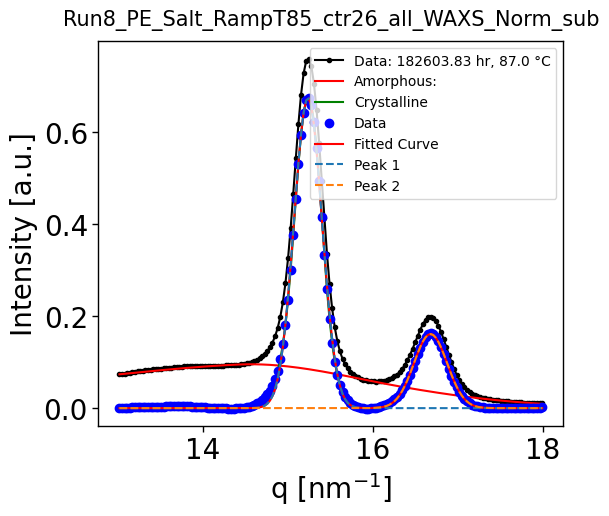

[ 0.6745536  15.23626889  0.11598909  0.16105819 16.67876913  0.13804494]
percentage_crytallinity: 54.15 ± 7.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT85_ctr26_all_WAXS_Norm_sub.dat_fitted.dat
28
Processing file: Run8_PE_Salt_RampT87_ctr27_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182692.61333333337, bstop=4.75943, ctemp=89.32763933333332, I0=20.72781
Fitting 2 peaks with initial guess: [ 0.6745536  15.23626889  0.11598909  0.16105819 16.67876913  0.13804494]
Adjusted initial guess: [0.6760769876525484, 15.245873473591335, 1.0, 0.16014083411314886, 16.68049909103755, 1.1999999999999993]
Attempt 1 with initial guess: [0.6760769876525484, 15.245873473591335, 1.0, 0.16014083411314886, 16.68049909103755, 1.1999999999999993]
Fitted parameters: [ 0.6755685  15.23580579  0.11528001  0.15863225 16.66741712  0.13673655]


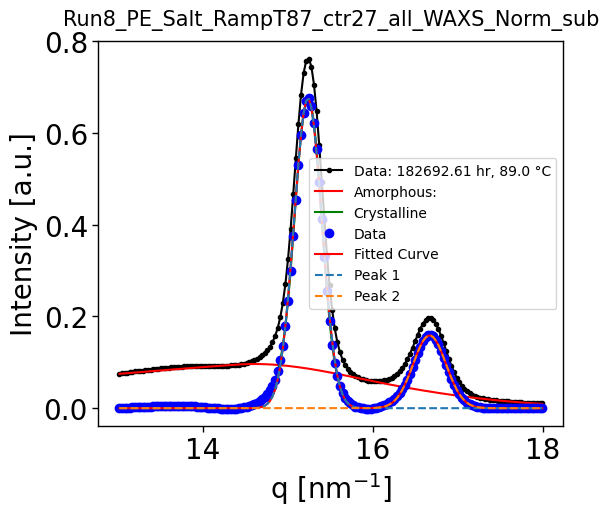

[ 0.6755685  15.23580579  0.11528001  0.15863225 16.66741712  0.13673655]
percentage_crytallinity: 53.84 ± 7.11 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT87_ctr27_all_WAXS_Norm_sub.dat_fitted.dat
29
Processing file: Run8_PE_Salt_RampT90_ctr28_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182782.92333333334, bstop=4.76652, ctemp=91.72427366666666, I0=20.742733333333334
Fitting 2 peaks with initial guess: [ 0.6755685  15.23580579  0.11528001  0.15863225 16.66741712  0.13673655]
Adjusted initial guess: [0.6792400020508468, 15.245873473591335, 1.0, 0.15871263365347382, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.6792400020508468, 15.245873473591335, 1.0, 0.15871263365347382, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.67971599 15.2323883   0.11495064  0.15709449 16.65142322  0.13671133]


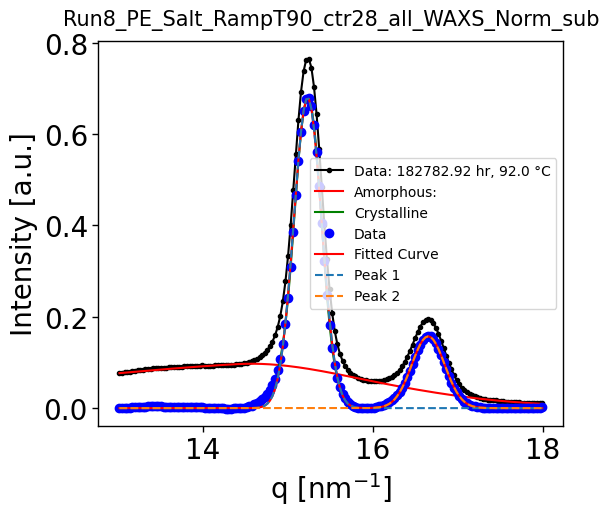

[ 0.67971599 15.2323883   0.11495064  0.15709449 16.65142322  0.13671133]
percentage_crytallinity: 53.61 ± 7.09 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT90_ctr28_all_WAXS_Norm_sub.dat_fitted.dat
30
Processing file: Run8_PE_Salt_RampT92_ctr29_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182874.03333333335, bstop=4.756443333333333, ctemp=94.11374133333334, I0=20.643243333333334
Fitting 2 peaks with initial guess: [ 0.67971599 15.2323883   0.11495064  0.15709449 16.65142322  0.13671133]
Adjusted initial guess: [0.6825607540828385, 15.245873473591335, 1.0, 0.15896403385223049, 16.649975141730184, 1.1999999999999993]
Attempt 1 with initial guess: [0.6825607540828385, 15.245873473591335, 1.0, 0.15896403385223049, 16.649975141730184, 1.1999999999999993]
Fitted parameters: [ 0.6848034  15.22859955  0.1144175   0.15736329 16.63761041  0.1371505 ]


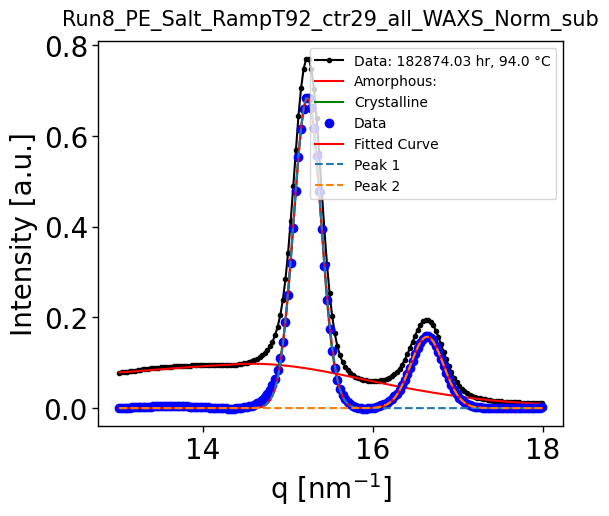

[ 0.6848034  15.22859955  0.1144175   0.15736329 16.63761041  0.1371505 ]
percentage_crytallinity: 53.58 ± 7.07 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT92_ctr29_all_WAXS_Norm_sub.dat_fitted.dat
31
Processing file: Run8_PE_Salt_RampT95_ctr30_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=182965.88, bstop=4.74429, ctemp=96.54251833333335, I0=20.544960000000003
Fitting 2 peaks with initial guess: [ 0.6848034  15.22859955  0.1144175   0.15736329 16.63761041  0.1371505 ]
Adjusted initial guess: [0.6880647474048406, 15.215349524283969, 1.0, 0.15887051217649972, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.6880647474048406, 15.215349524283969, 1.0, 0.15887051217649972, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.68980483 15.22586774  0.11414223  0.15731253 16.62295478  0.13610282]


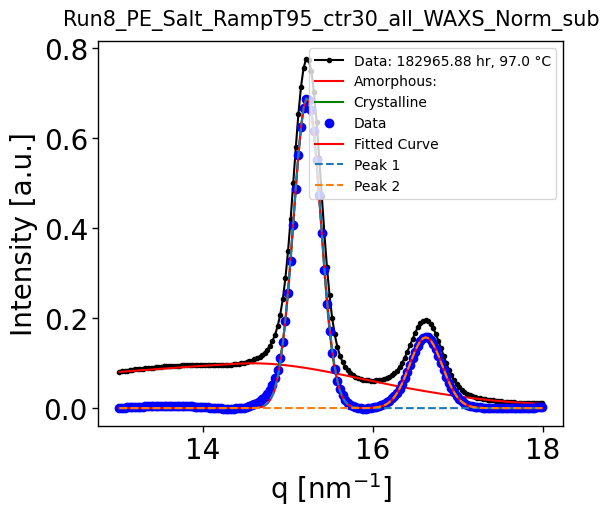

[ 0.68980483 15.22586774  0.11414223  0.15731253 16.62295478  0.13610282]
percentage_crytallinity: 53.20 ± 7.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT95_ctr30_all_WAXS_Norm_sub.dat_fitted.dat
32
Processing file: Run8_PE_Salt_RampT97_ctr31_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183059.17333333334, bstop=4.792723333333333, ctemp=98.90472900000002, I0=20.728256666666667
Fitting 2 peaks with initial guess: [ 0.68980483 15.22586774  0.11414223  0.15731253 16.62295478  0.13610282]
Adjusted initial guess: [0.683836098405905, 15.215349524283969, 1.0, 0.15495400509037693, 16.61945119242282, 1.1999999999999993]
Attempt 1 with initial guess: [0.683836098405905, 15.215349524283969, 1.0, 0.15495400509037693, 16.61945119242282, 1.1999999999999993]
Fitted parameters: [ 0.68512744 15.22279727  0.11340233  0.15376657 16.60804975  0.13560433]


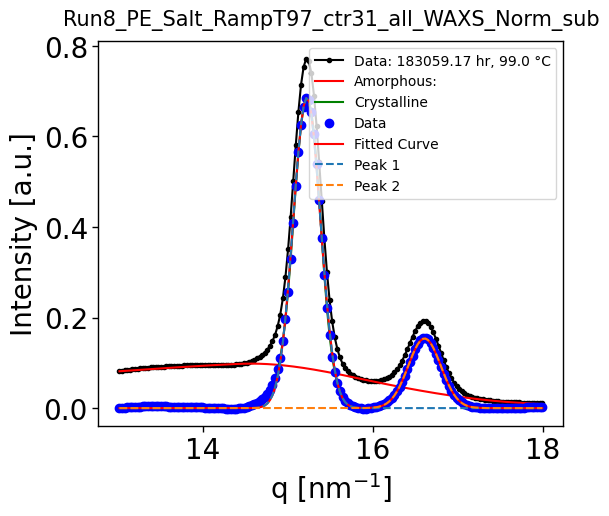

[ 0.68512744 15.22279727  0.11340233  0.15376657 16.60804975  0.13560433]
percentage_crytallinity: 53.07 ± 7.04 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT97_ctr31_all_WAXS_Norm_sub.dat_fitted.dat
33
Processing file: Run8_PE_Salt_RampT100_ctr32_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183152.29333333333, bstop=4.77618, ctemp=101.30473333333333, I0=20.617993333333335
Fitting 2 peaks with initial guess: [ 0.68512744 15.22279727  0.11340233  0.15376657 16.60804975  0.13560433]
Adjusted initial guess: [0.6804713354742933, 15.215349524283969, 1.0, 0.15511754209010395, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.6804713354742933, 15.215349524283969, 1.0, 0.15511754209010395, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.68212431 15.22073366  0.1128497   0.15358492 16.59423612  0.13445525]


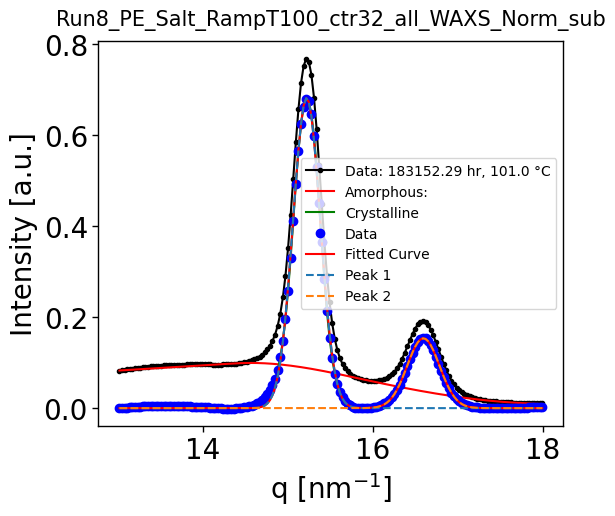

[ 0.68212431 15.22073366  0.1128497   0.15358492 16.59423612  0.13445525]
percentage_crytallinity: 52.79 ± 7.10 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT100_ctr32_all_WAXS_Norm_sub.dat_fitted.dat
34
Processing file: Run8_PE_Salt_RampT102_ctr33_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183245.11, bstop=4.756936666666667, ctemp=103.73583333333333, I0=20.57265333333333
Fitting 2 peaks with initial guess: [ 0.68212431 15.22073366  0.1128497   0.15358492 16.59423612  0.13445525]
Adjusted initial guess: [0.6807209118272506, 15.215349524283969, 1.0, 0.1527932494854382, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.6807209118272506, 15.215349524283969, 1.0, 0.1527932494854382, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [ 0.68204206 15.21861648  0.11220631  0.15120003 16.58033945  0.13530908]


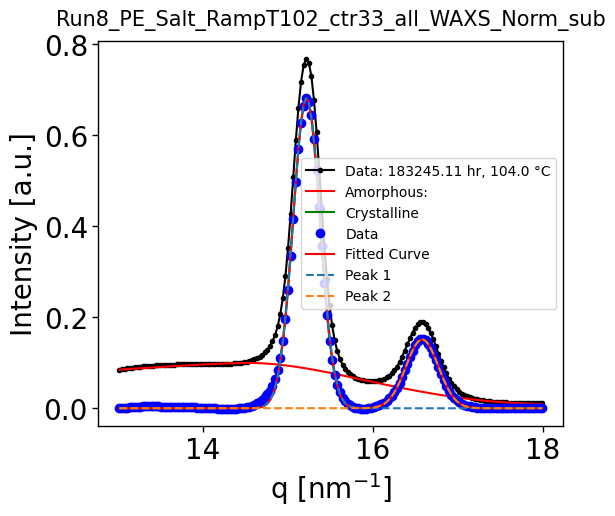

[ 0.68204206 15.21861648  0.11220631  0.15120003 16.58033945  0.13530908]
percentage_crytallinity: 52.55 ± 7.13 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT102_ctr33_all_WAXS_Norm_sub.dat_fitted.dat
35
Processing file: Run8_PE_Salt_RampT105_ctr34_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183338.8633333333, bstop=4.804939999999999, ctemp=106.10936666666667, I0=20.770476666666667
Fitting 2 peaks with initial guess: [ 0.68204206 15.21861648  0.11220631  0.15120003 16.58033945  0.13530908]
Adjusted initial guess: [0.6604908010623433, 15.215349524283969, 1.0, 0.1475517825187323, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.6604908010623433, 15.215349524283969, 1.0, 0.1475517825187323, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.66248358 15.21664622  0.11108026  0.14663415 16.56541313  0.13249457]


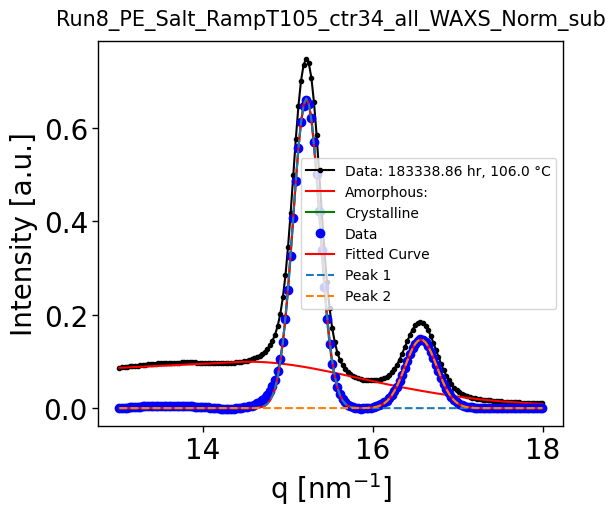

[ 0.66248358 15.21664622  0.11108026  0.14663415 16.56541313  0.13249457]
percentage_crytallinity: 51.50 ± 7.15 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT105_ctr34_all_WAXS_Norm_sub.dat_fitted.dat
36
Processing file: Run8_PE_Salt_RampT107_ctr35_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183431.8866666667, bstop=4.780333333333334, ctemp=108.51453333333335, I0=20.639993333333333
Fitting 2 peaks with initial guess: [ 0.66248358 15.21664622  0.11108026  0.14663415 16.56541313  0.13249457]
Adjusted initial guess: [0.6445894158096626, 15.215349524283969, 1.0, 0.14111923465631318, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.6445894158096626, 15.215349524283969, 1.0, 0.14111923465631318, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [ 0.64666018 15.21391251  0.11075216  0.14023134 16.55010408  0.13424025]


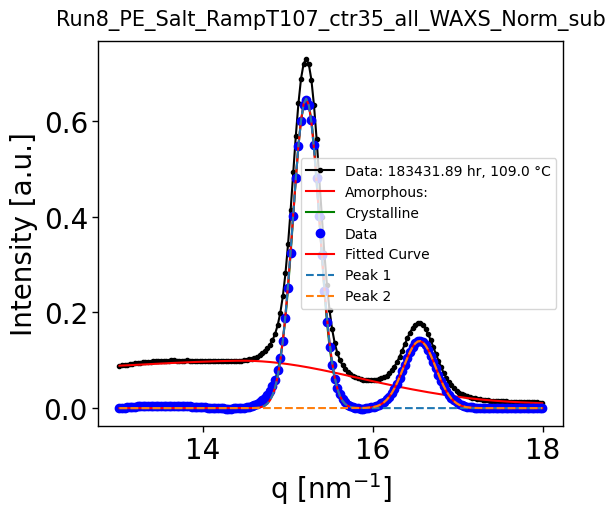

[ 0.64666018 15.21391251  0.11075216  0.14023134 16.55010408  0.13424025]
percentage_crytallinity: 50.85 ± 7.32 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT107_ctr35_all_WAXS_Norm_sub.dat_fitted.dat
37
Processing file: Run8_PE_Salt_RampT110_ctr36_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183524.34, bstop=4.758523333333334, ctemp=110.92143333333335, I0=20.551703333333336
Fitting 2 peaks with initial guess: [ 0.64666018 15.21391251  0.11075216  0.14023134 16.55010408  0.13424025]
Adjusted initial guess: [0.6267019994764088, 15.215349524283969, 1.0, 0.13426535022774239, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.6267019994764088, 15.215349524283969, 1.0, 0.13426535022774239, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.62953836 15.21086015  0.10996525  0.1334178  16.53411675  0.13229429]


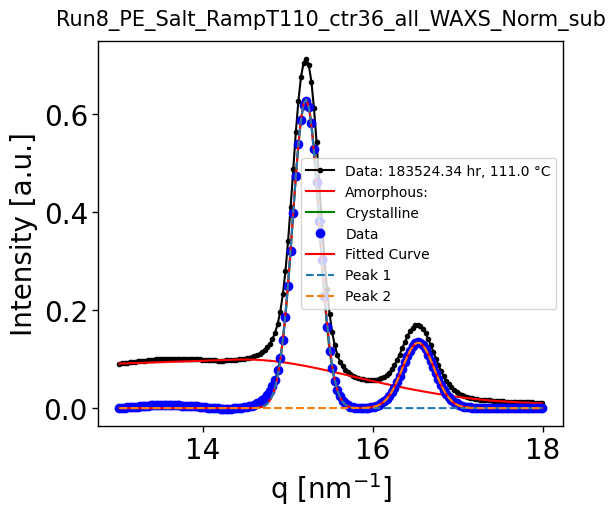

[ 0.62953836 15.21086015  0.10996525  0.1334178  16.53411675  0.13229429]
percentage_crytallinity: 50.04 ± 7.52 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT110_ctr36_all_WAXS_Norm_sub.dat_fitted.dat
38
Processing file: Run8_PE_Salt_RampT112_ctr37_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183617.80999999997, bstop=4.7871966666666665, ctemp=113.33846666666666, I0=20.783936666666666
Fitting 2 peaks with initial guess: [ 0.62953836 15.21086015  0.10996525  0.1334178  16.53411675  0.13229429]
Adjusted initial guess: [0.5929971914002174, 15.215349524283969, 1.0, 0.12039313712914691, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.5929971914002174, 15.215349524283969, 1.0, 0.12039313712914691, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [ 0.59634852 15.20782633  0.10910841  0.11974646 16.52013071  0.13236185]


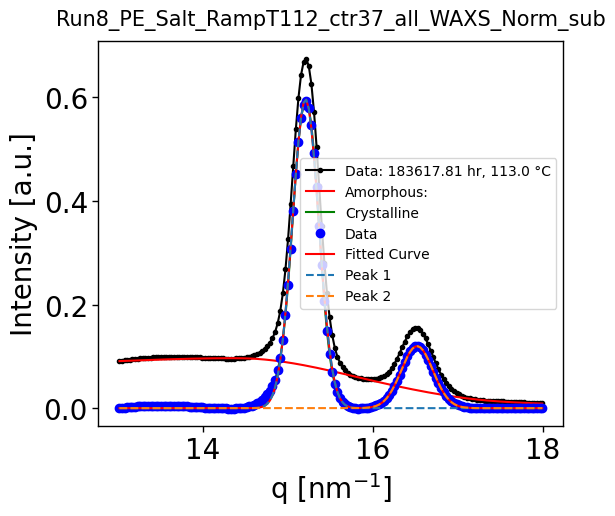

[ 0.59634852 15.20782633  0.10910841  0.11974646 16.52013071  0.13236185]
percentage_crytallinity: 48.89 ± 7.82 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT112_ctr37_all_WAXS_Norm_sub.dat_fitted.dat
39
Processing file: Run8_PE_Salt_RampT115_ctr38_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183712.02333333332, bstop=4.770983333333334, ctemp=115.66399999999999, I0=20.622429999999998
Fitting 2 peaks with initial guess: [ 0.59634852 15.20782633  0.10910841  0.11974646 16.52013071  0.13236185]
Adjusted initial guess: [0.5764242516777821, 15.215349524283969, 1.0, 0.11111697474194643, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.5764242516777821, 15.215349524283969, 1.0, 0.11111697474194643, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [ 0.58030348 15.20538218  0.10860796  0.11005508 16.50519436  0.13411131]


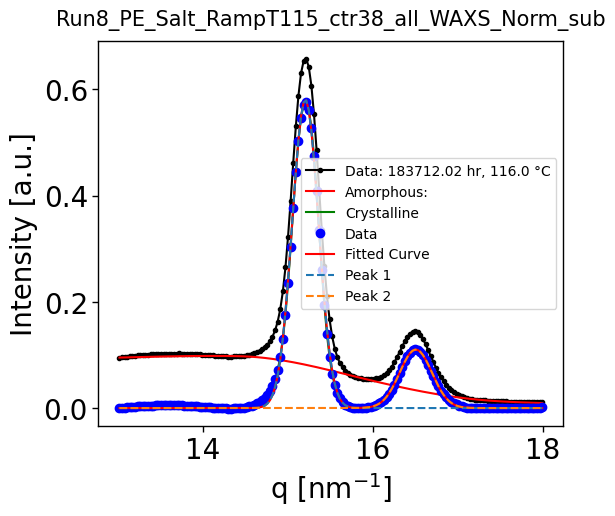

[ 0.58030348 15.20538218  0.10860796  0.11005508 16.50519436  0.13411131]
percentage_crytallinity: 47.87 ± 7.98 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT115_ctr38_all_WAXS_Norm_sub.dat_fitted.dat
40
Processing file: Run8_PE_Salt_RampT117_ctr39_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183804.63333333333, bstop=4.747326666666667, ctemp=118.10236666666667, I0=20.55863
Fitting 2 peaks with initial guess: [ 0.58030348 15.20538218  0.10860796  0.11005508 16.50519436  0.13411131]
Adjusted initial guess: [0.542214282182174, 15.215349524283969, 1.0, 0.09791209050294504, 16.497355395193352, 1.1999999999999993]
Attempt 1 with initial guess: [0.542214282182174, 15.215349524283969, 1.0, 0.09791209050294504, 16.497355395193352, 1.1999999999999993]
Fitted parameters: [ 0.54688331 15.20243712  0.10790335  0.09749486 16.49198511  0.1342744 ]


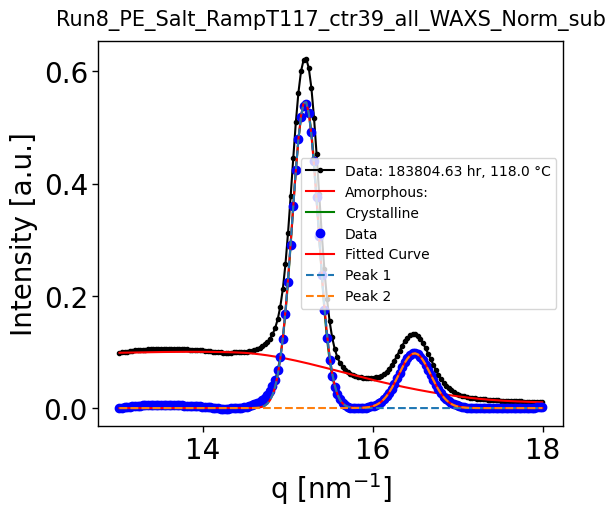

[ 0.54688331 15.20243712  0.10790335  0.09749486 16.49198511  0.1342744 ]
percentage_crytallinity: 45.77 ± 8.22 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT117_ctr39_all_WAXS_Norm_sub.dat_fitted.dat
41
Processing file: Run8_PE_Salt_RampT120_ctr40_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183897.93333333335, bstop=4.77681, ctemp=120.5224, I0=20.725943333333333
Fitting 2 peaks with initial guess: [ 0.54688331 15.20243712  0.10790335  0.09749486 16.49198511  0.1342744 ]
Adjusted initial guess: [0.49282615182483347, 15.215349524283969, 1.0, 0.0869208454593685, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.49282615182483347, 15.215349524283969, 1.0, 0.0869208454593685, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [4.98770612e-01 1.52001038e+01 1.06267922e-01 3.55371856e+00
 1.65831979e+01 1.45144641e-03]


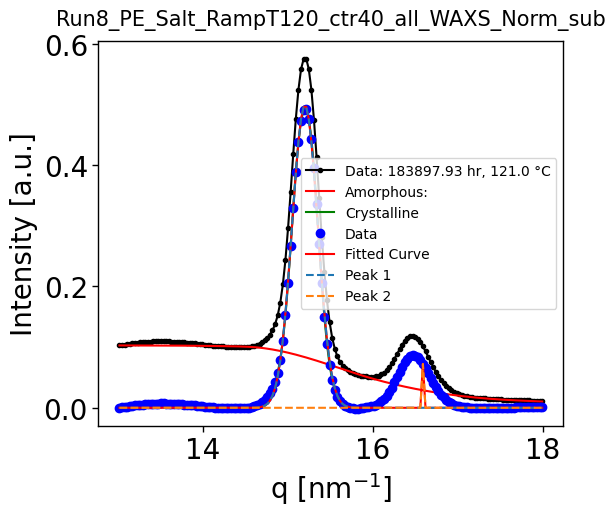

[4.98770612e-01 1.52001038e+01 1.06267922e-01 3.55371856e+00
 1.65831979e+01 1.45144641e-03]
percentage_crytallinity: 42.69 ± 8.37 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT120_ctr40_all_WAXS_Norm_sub.dat_fitted.dat
42
Processing file: Run8_PE_Salt_RampT122_ctr41_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=183992.59666666668, bstop=4.756029999999999, ctemp=122.89663333333333, I0=20.6503
Fitting 2 peaks with initial guess: [4.98770612e-01 1.52001038e+01 1.06267922e-01 3.55371856e+00
 1.65831979e+01 1.45144641e-03]
Adjusted initial guess: [0.4393438726621687, 15.215349524283969, 1.0, 0.07223742362168925, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.4393438726621687, 15.215349524283969, 1.0, 0.07223742362168925, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.44562423 15.19869547  0.10478779  0.07185773 16.47

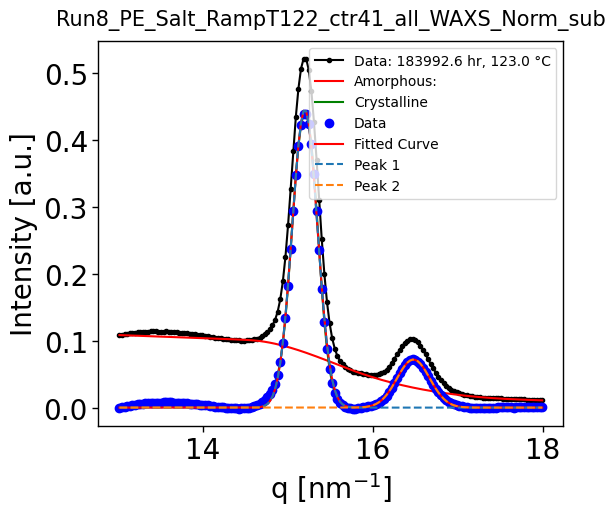

[ 0.44562423 15.19869547  0.10478779  0.07185773 16.47684533  0.13679022]
percentage_crytallinity: 39.59 ± 8.83 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT122_ctr41_all_WAXS_Norm_sub.dat_fitted.dat
43
Processing file: Run8_PE_Salt_RampT125_ctr42_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184087.65, bstop=4.733086666666666, ctemp=125.2728, I0=20.572893333333333
Fitting 2 peaks with initial guess: [ 0.44562423 15.19869547  0.10478779  0.07185773 16.47684533  0.13679022]
Adjusted initial guess: [0.3707780357809441, 15.215349524283969, 1.0, 0.05506172556963364, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.3707780357809441, 15.215349524283969, 1.0, 0.05506172556963364, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.37649675 15.19760669  0.10421191  0.05498051 16.47070084  0.13982882]


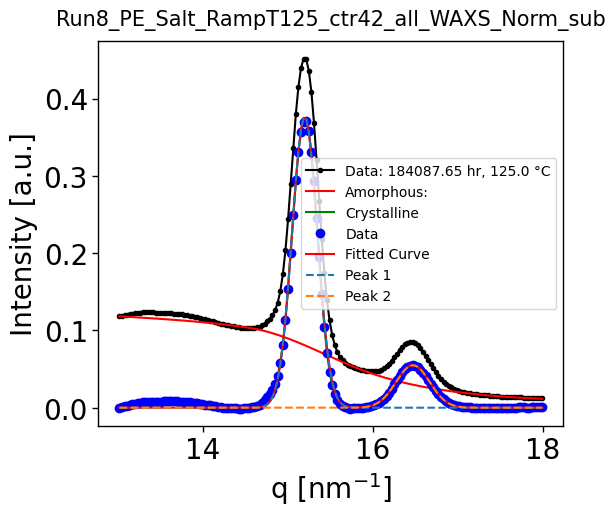

[ 0.37649675 15.19760669  0.10421191  0.05498051 16.47070084  0.13982882]
percentage_crytallinity: 34.72 ± 9.17 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT125_ctr42_all_WAXS_Norm_sub.dat_fitted.dat
44
Processing file: Run8_PE_Salt_RampT127_ctr43_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184182.62666666668, bstop=4.744236666666667, ctemp=127.7085, I0=20.576539999999998
Fitting 2 peaks with initial guess: [ 0.37649675 15.19760669  0.10421191  0.05498051 16.47070084  0.13982882]
Adjusted initial guess: [0.25338805356255384, 15.215349524283969, 1.0, 0.03573258847075722, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.25338805356255384, 15.215349524283969, 1.0, 0.03573258847075722, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [ 0.25776025 15.19683058  0.10342521  0.03580286 16.47975141  0.14184379]


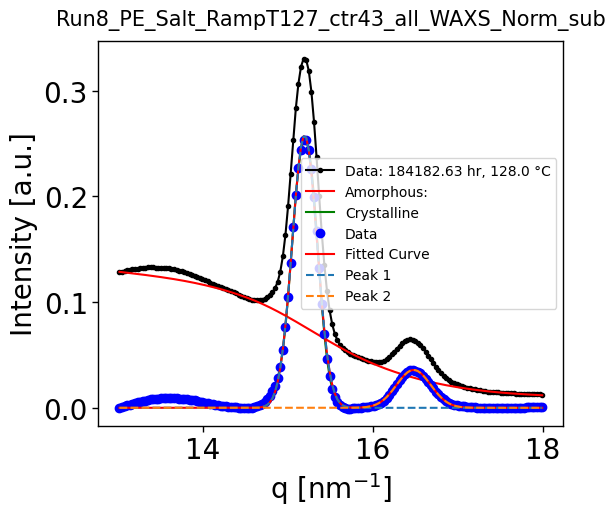

[ 0.25776025 15.19683058  0.10342521  0.03580286 16.47975141  0.14184379]
percentage_crytallinity: 26.69 ± 9.99 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT127_ctr43_all_WAXS_Norm_sub.dat_fitted.dat
45
Processing file: Run8_PE_Salt_RampT130_ctr44_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184278.6066666667, bstop=4.776023333333334, ctemp=130.11724, I0=20.645936666666667
Fitting 2 peaks with initial guess: [ 0.25776025 15.19683058  0.10342521  0.03580286 16.47975141  0.14184379]
Adjusted initial guess: [0.047046900673899536, 15.184825574976603, 1.0, 0.008150557619077882, 16.43630749657862, 1.1999999999999993]
Attempt 1 with initial guess: [0.047046900673899536, 15.184825574976603, 1.0, 0.008150557619077882, 16.43630749657862, 1.1999999999999993]
Fitted parameters: [1.29077000e-02 1.48000000e+01 8.51126568e-01 4.38844070e-06
 1.63824571e+01 1.45286422

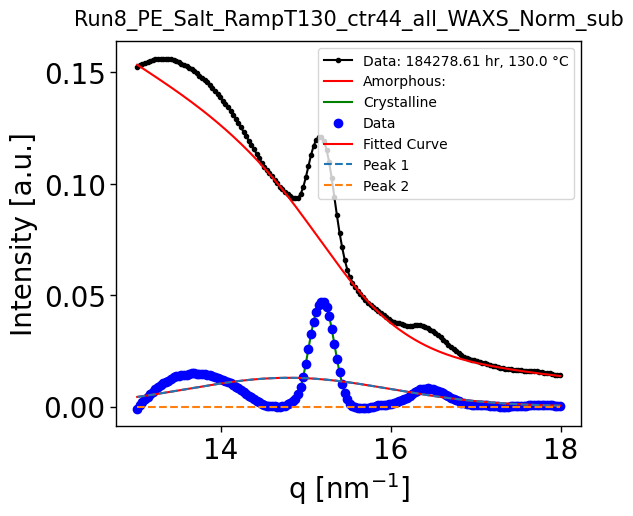

[1.29077000e-02 1.48000000e+01 8.51126568e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 9.36 ± 11.39 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT130_ctr44_all_WAXS_Norm_sub.dat_fitted.dat
46
Processing file: Run8_PE_Salt_RampT132_ctr45_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184374.99333333332, bstop=4.756293333333333, ctemp=132.59307, I0=20.55224
Fitting 2 peaks with initial guess: [1.29077000e-02 1.48000000e+01 8.51126568e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0007522895348168745, 15.032205828439771, 1.0, 0.0009497117369927123, 17.10783438134068, 1.1999999999999993]
Attempt 1 with initial guess: [0.0007522895348168745, 15.032205828439771, 1.0, 0.0009497117369927123, 17.10783438134068, 1.1999999999999993]
Fitted parameters: [8.96097350e-04 1.48000000e+01 1.00000000e+00 7.206839

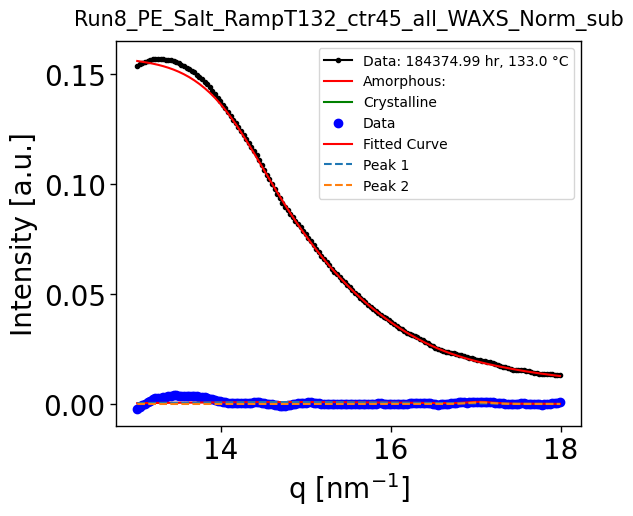

[8.96097350e-04 1.48000000e+01 1.00000000e+00 7.20683974e-04
 1.70536465e+01 1.01927684e-01]
percentage_crytallinity: 0.98 ± 12.34 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT132_ctr45_all_WAXS_Norm_sub.dat_fitted.dat
47
Processing file: Run8_PE_Salt_RampT135_ctr46_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184474.33, bstop=4.743703333333333, ctemp=134.92373666666666, I0=20.508996666666665
Fitting 2 peaks with initial guess: [8.96097350e-04 1.48000000e+01 1.00000000e+00 7.20683974e-04
 1.70536465e+01 1.01927684e-01]
Adjusted initial guess: [0.0005360125016406828, 15.2763974228987, 1.0, 0.0016045818468091201, 16.558403293808084, 1.1999999999999993]
Attempt 1 with initial guess: [0.0005360125016406828, 15.2763974228987, 1.0, 0.0016045818468091201, 16.558403293808084, 1.1999999999999993]
Fitted parameters: [1.75600494e-03 1.48000000e+01 1.00000000e+00 

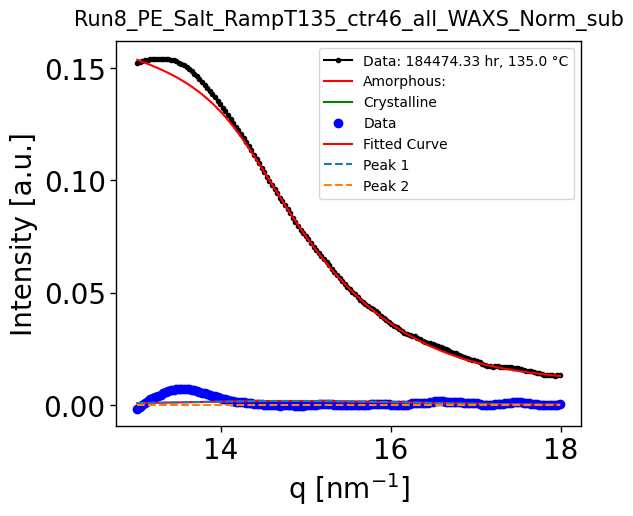

[1.75600494e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.91 ± 12.71 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT135_ctr46_all_WAXS_Norm_sub.dat_fitted.dat
48
Processing file: Run8_PE_Salt_RampT137_ctr47_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184572.02333333332, bstop=4.773219999999999, ctemp=137.50499666666667, I0=20.642413333333334
Fitting 2 peaks with initial guess: [1.75600494e-03 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0004924360408599671, 15.306921372206068, 1.0, 0.000759867218000157, 16.863642786881748, 1.1999999999999993]
Attempt 1 with initial guess: [0.0004924360408599671, 15.306921372206068, 1.0, 0.000759867218000157, 16.863642786881748, 1.1999999999999993]
Fitted parameters: [7.29475438e-04 1.48000000e+01 1.00

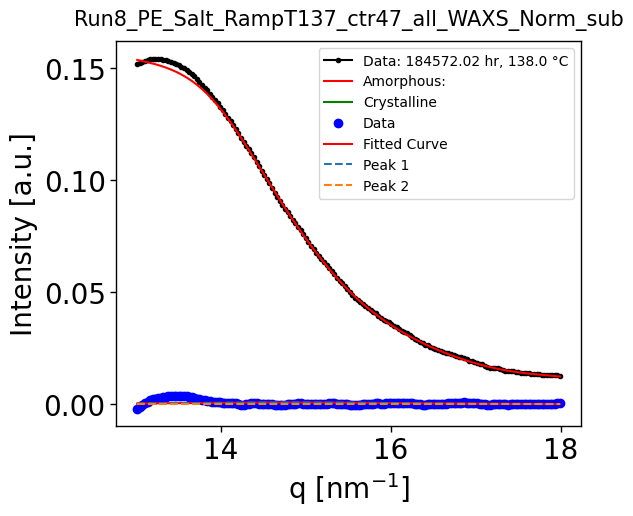

[7.29475438e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.81 ± 12.79 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT137_ctr47_all_WAXS_Norm_sub.dat_fitted.dat
49
Processing file: Run8_PE_Salt_RampT140_ctr48_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184676.07333333333, bstop=4.754576666666666, ctemp=139.69936666666666, I0=20.519343333333335
Fitting 2 peaks with initial guess: [7.29475438e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0010905193599279606, 15.154301625669238, 1.0, 0.0013765832680446219, 16.588927243115453, 1.1999999999999993]
Attempt 1 with initial guess: [0.0010905193599279606, 15.154301625669238, 1.0, 0.0013765832680446219, 16.588927243115453, 1.1999999999999993]
Fitted parameters: [6.03740094e-04 1.48000000e+01 1.

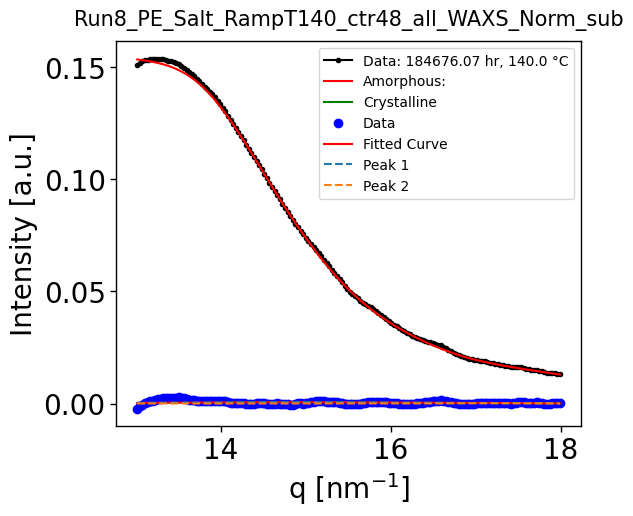

[6.03740094e-04 1.48000000e+01 1.00000000e+00 1.07538439e-04
 1.71999467e+01 4.45243297e-01]
percentage_crytallinity: 0.69 ± 12.73 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT140_ctr48_all_WAXS_Norm_sub.dat_fitted.dat
50
Processing file: Run8_PE_Salt_RampT142_ctr49_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184777.05333333332, bstop=4.7593966666666665, ctemp=142.27057000000002, I0=20.496806666666668
Fitting 2 peaks with initial guess: [6.03740094e-04 1.48000000e+01 1.00000000e+00 1.07538439e-04
 1.71999467e+01 4.45243297e-01]
Adjusted initial guess: [0.00018793427087010484, 15.70373271320183, 1.0, 0.0005997083784891992, 16.527879344500718, 1.1999999999999993]
Attempt 1 with initial guess: [0.00018793427087010484, 15.70373271320183, 1.0, 0.0005997083784891992, 16.527879344500718, 1.1999999999999993]
Fitted parameters: [5.82951255e-04 1.48000000e+01 1

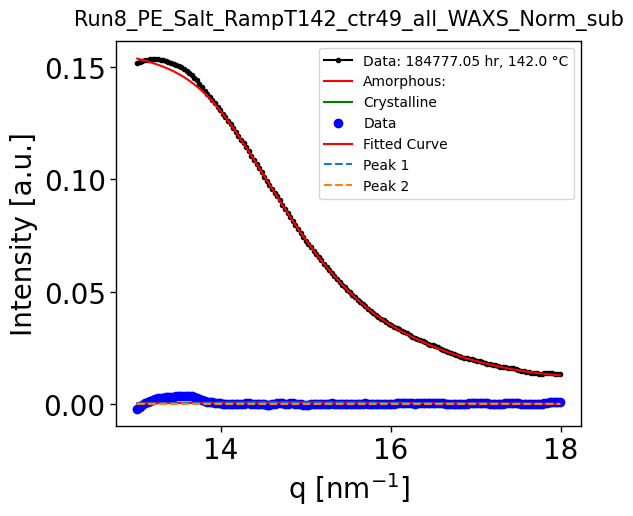

[5.82951255e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.68 ± 12.91 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT142_ctr49_all_WAXS_Norm_sub.dat_fitted.dat
51
Processing file: Run8_PE_Salt_RampT145_ctr50_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184884.08333333334, bstop=4.787109999999999, ctemp=144.52982999999998, I0=20.631236666666666
Fitting 2 peaks with initial guess: [5.82951255e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0008378348787887249, 15.673208763894463, 1.0, 0.0005013939993616968, 17.199406229262777, 1.1999999999999993]
Attempt 1 with initial guess: [0.0008378348787887249, 15.673208763894463, 1.0, 0.0005013939993616968, 17.199406229262777, 1.1999999999999993]
Fitted parameters: [9.25478335e-04 1.48000000e+01 1.

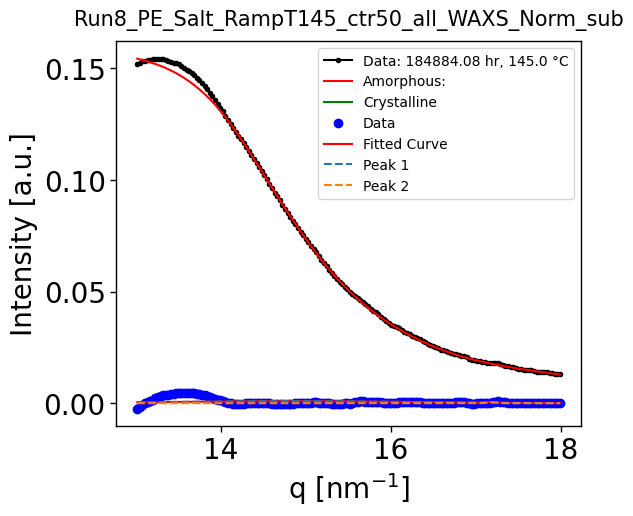

[9.25478335e-04 1.48000000e+01 1.00000000e+00 3.46587835e-04
 1.72000000e+01 4.66520590e-02]
percentage_crytallinity: 1.00 ± 12.66 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT145_ctr50_all_WAXS_Norm_sub.dat_fitted.dat
52
Processing file: Run8_PE_Salt_RampT147_ctr51_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=184987.80333333334, bstop=4.76737, ctemp=147.16616666666667, I0=20.506003333333336
Fitting 2 peaks with initial guess: [9.25478335e-04 1.48000000e+01 1.00000000e+00 3.46587835e-04
 1.72000000e+01 4.66520590e-02]
Adjusted initial guess: [0.0011512650870870791, 15.306921372206068, 1.0, 0.0006364855654315549, 16.253163800734423, 1.1999999999999993]
Attempt 1 with initial guess: [0.0011512650870870791, 15.306921372206068, 1.0, 0.0006364855654315549, 16.253163800734423, 1.1999999999999993]
Fitted parameters: [7.73914252e-04 1.48000000e+01 1.00000000e+

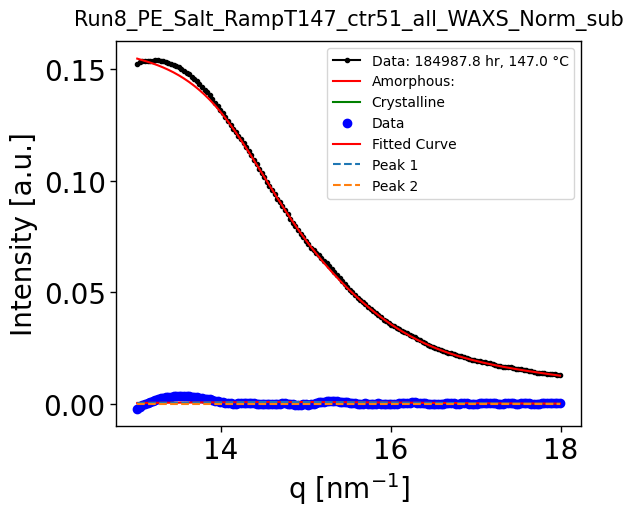

[7.73914252e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.81 ± 12.76 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT147_ctr51_all_WAXS_Norm_sub.dat_fitted.dat
53
Processing file: Run8_PE_Salt_RampT150_ctr52_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185098.49, bstop=4.803986666666667, ctemp=149.5234966666667, I0=20.657776666666663
Fitting 2 peaks with initial guess: [7.73914252e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.000688469567154841, 15.795304561123928, 1.0, 0.0007530899296014915, 17.01626253341858, 1.1999999999999993]
Attempt 1 with initial guess: [0.000688469567154841, 15.795304561123928, 1.0, 0.0007530899296014915, 17.01626253341858, 1.1999999999999993]
Fitted parameters: [6.08502238e-04 1.48000025e+01 1.00000000e+00 1

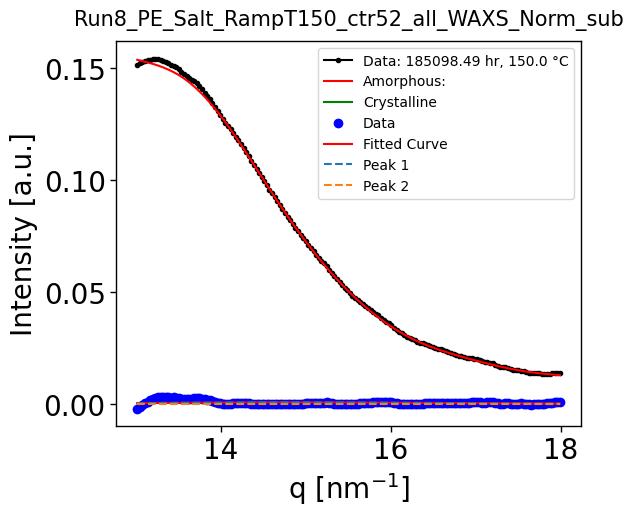

[6.08502238e-04 1.48000025e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 0.71 ± 12.79 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT150_ctr52_all_WAXS_Norm_sub.dat_fitted.dat
54
Processing file: Run8_PE_Salt_RampT152_ctr53_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185209.68000000002, bstop=4.79098, ctemp=152.02039666666667, I0=20.557466666666667
Fitting 2 peaks with initial guess: [6.08502238e-04 1.48000025e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0009035434740307657, 15.642684814587097, 1.0, 0.0005185568675147856, 16.466831445885987, 1.1999999999999993]
Attempt 1 with initial guess: [0.0009035434740307657, 15.642684814587097, 1.0, 0.0005185568675147856, 16.466831445885987, 1.1999999999999993]
Fitted parameters: [1.05982767e-03 1.48000001e+01 1.00000000e+

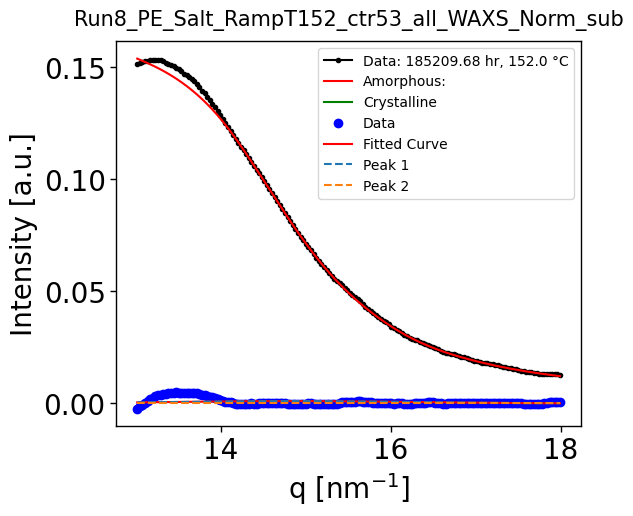

[1.05982767e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.16 ± 12.98 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT152_ctr53_all_WAXS_Norm_sub.dat_fitted.dat
55
Processing file: Run8_PE_Salt_RampT155_ctr54_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185324.71666666667, bstop=4.7776266666666665, ctemp=154.50823000000003, I0=20.44184333333333
Fitting 2 peaks with initial guess: [1.05982767e-03 1.48000001e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0009053034820873523, 15.61216086527973, 1.0, 0.0006092661978274218, 16.802594888267016, 1.1999999999999993]
Attempt 1 with initial guess: [0.0009053034820873523, 15.61216086527973, 1.0, 0.0006092661978274218, 16.802594888267016, 1.1999999999999993]
Fitted parameters: [9.66897455e-04 1.48000000e+01 1.00

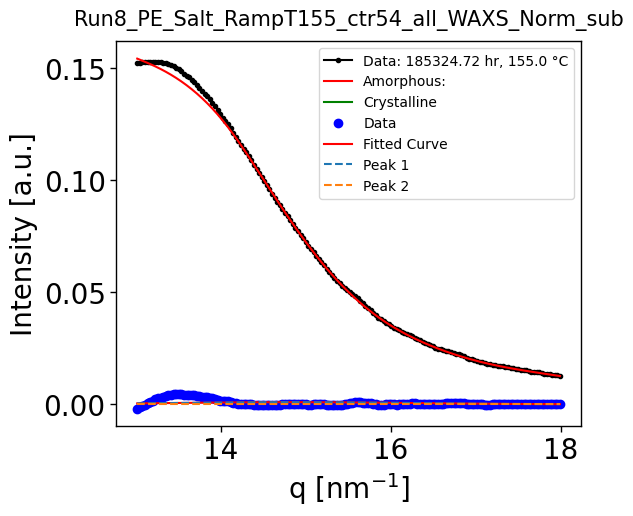

[9.66897455e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
percentage_crytallinity: 1.04 ± 12.90 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT155_ctr54_all_WAXS_Norm_sub.dat_fitted.dat
56
Processing file: Run8_PE_Salt_RampT157_ctr55_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185441.85333333336, bstop=4.817723333333333, ctemp=157.03063666666665, I0=20.627446666666668
Fitting 2 peaks with initial guess: [9.66897455e-04 1.48000000e+01 1.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00]
Adjusted initial guess: [0.0006349479694670729, 15.581636915972364, 1.0, 0.0007844666089655734, 17.138358330648046, 1.1999999999999993]
Attempt 1 with initial guess: [0.0006349479694670729, 15.581636915972364, 1.0, 0.0007844666089655734, 17.138358330648046, 1.1999999999999993]
Fitted parameters: [7.16206325e-04 1.48000000e+01 1.

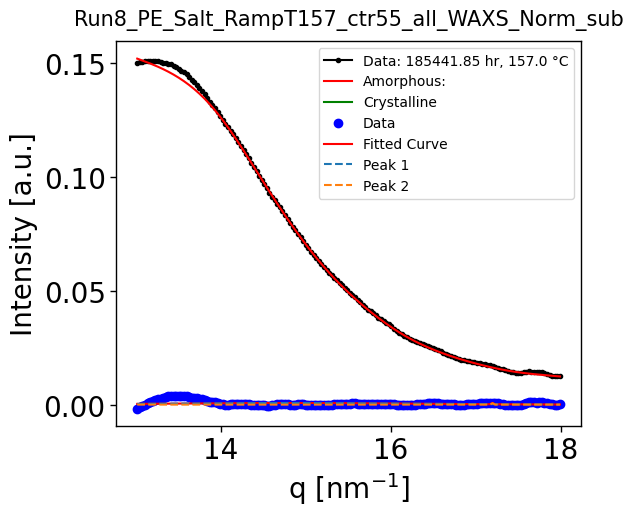

[7.16206325e-04 1.48000000e+01 1.00000000e+00 7.55779611e-04
 1.72000000e+01 5.69379887e-04]
percentage_crytallinity: 0.89 ± 13.07 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT157_ctr55_all_WAXS_Norm_sub.dat_fitted.dat
57
Processing file: Run8_PE_Salt_RampT160_ctr56_all_WAXS_Norm_sub.dat
Metadata parsed successfully: Timer=185565.02000000002, bstop=4.797323333333333, ctemp=159.41039666666666, I0=20.501206666666665
Fitting 2 peaks with initial guess: [7.16206325e-04 1.48000000e+01 1.00000000e+00 7.55779611e-04
 1.72000000e+01 5.69379887e-04]
Adjusted initial guess: [0.00023212241354996638, 15.306921372206068, 1.0, 0.0011149794301617798, 16.405783547271255, 1.1999999999999993]
Attempt 1 with initial guess: [0.00023212241354996638, 15.306921372206068, 1.0, 0.0011149794301617798, 16.405783547271255, 1.1999999999999993]
Fitted parameters: [7.60346110e-04 1.48000000e+01 

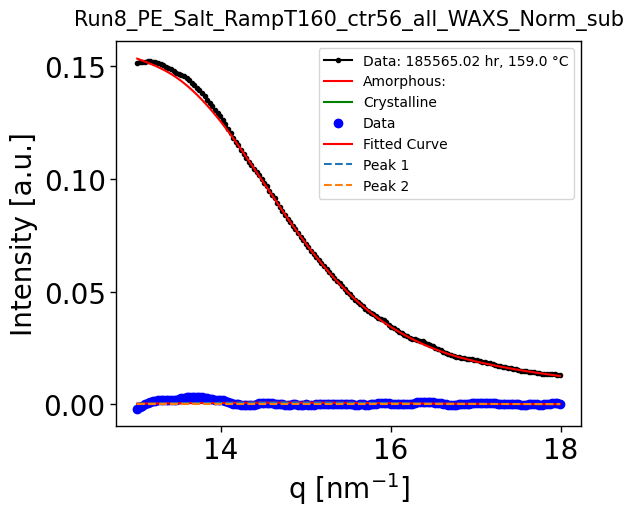

[7.6034611e-04 1.4800000e+01 1.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00]
percentage_crytallinity: 0.84 ± 13.01 %
Fitted results saved to: /Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01/Analysis/Fitting/Run8_PE_Salt_RampT160_ctr56_all_WAXS_Norm_sub.dat_fitted.dat
filename: 57
timer: 57
CTEMP: 57
I0: 57
bstop: 57
crystal: 57
Amorphous: 57
percentage_crytallinity: 57
percentage_crytallinity_error: 57
peak1_values: 57
peak1_values_error: 57
peak2_values: 57
peak2_values_error: 57


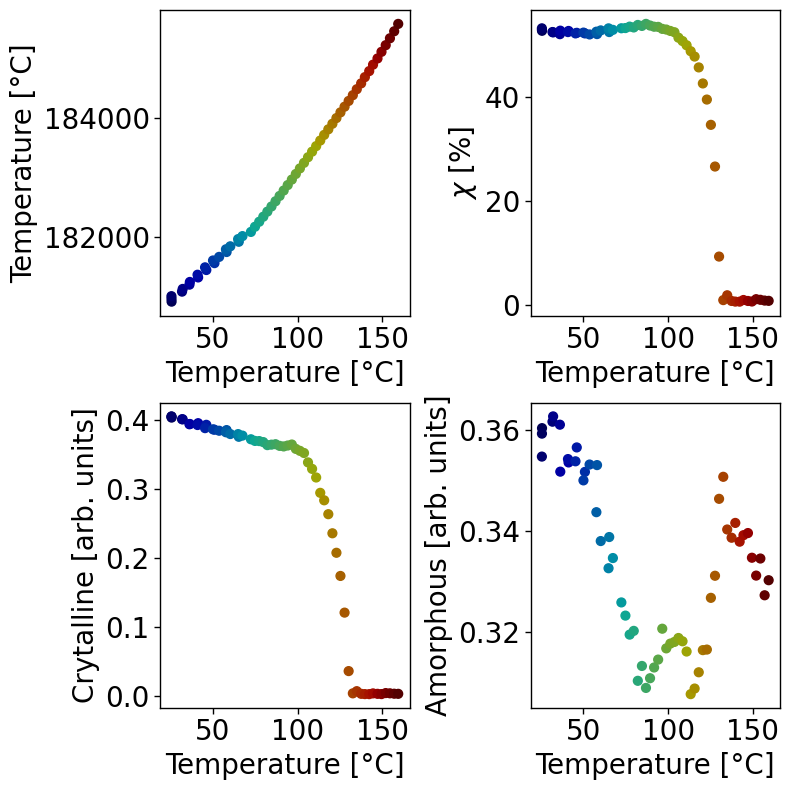

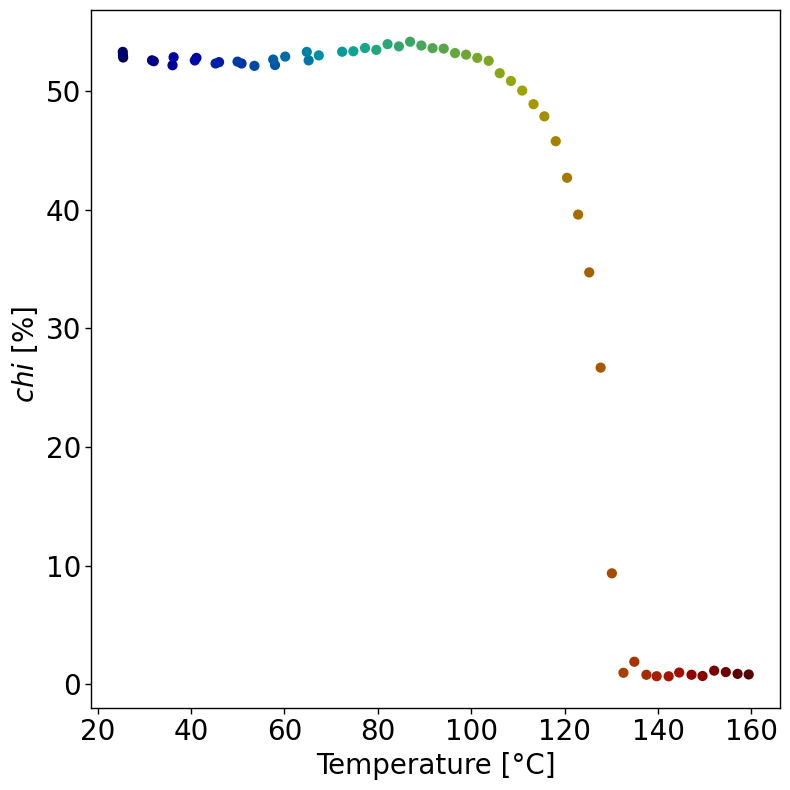

In [28]:
num_files_to_process = 57
num_files_to_plot = num_files_to_process

Acoh = 10.43
Salt = 10.80
PE = 7.02
# make the loop for all the keywords for process_WAXS_data

for keyword in ['Run7_PE_RampT', 'Run6_PE_AcOH_RampT', 'Run8_PE_Salt_RampT']:
    process_WAXS_data(
        WAXS_sub_files, keyword, num_files_to_plot, start_index, num_ave_files,min_q_value, max_q_value, smmoth_window_size,
        initial_guess, num_peaks, q_ranges, lam, porder, itermax, save_fitted_results,
    )





# Plotting all the results

# percentage crytllinity

Processing file: Run7_PE_RampT20fitting_results.xlsx
Processing file: Run6_PE_AcOH_RampT20fitting_results.xlsx
Processing file: Run8_PE_Salt_RampT20fitting_results.xlsx


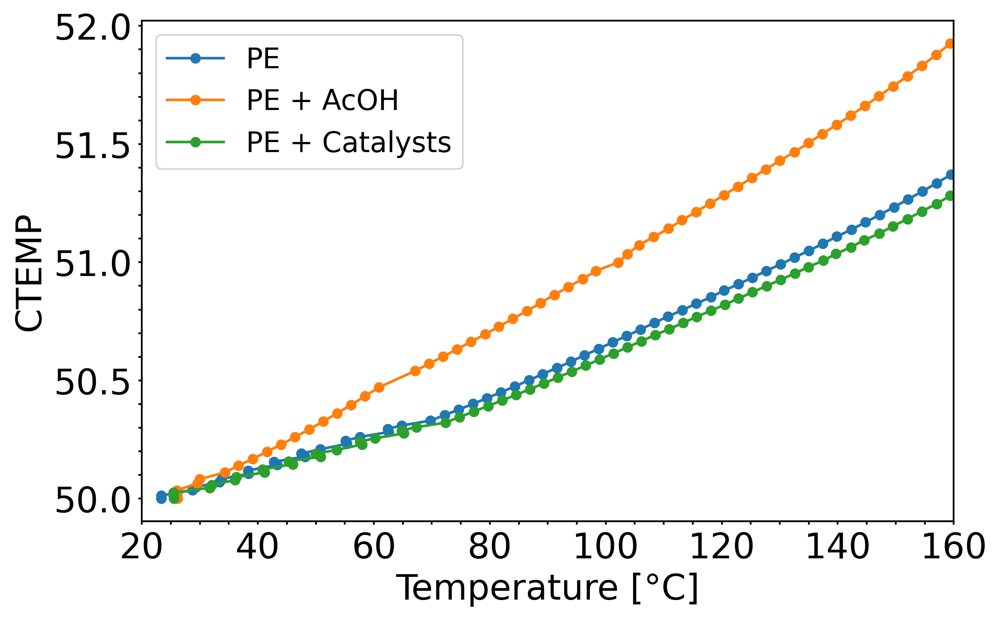

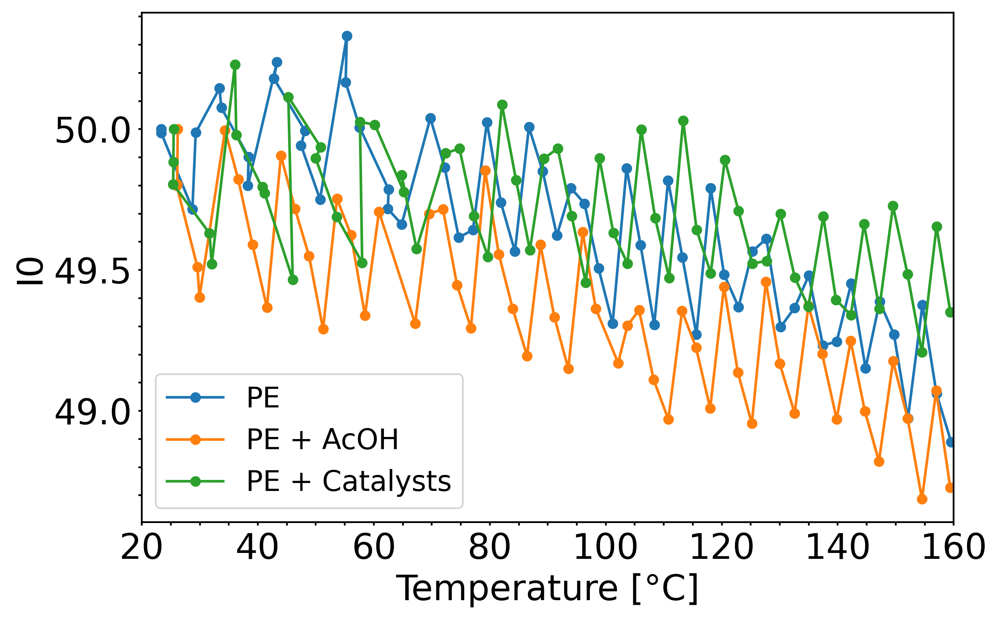

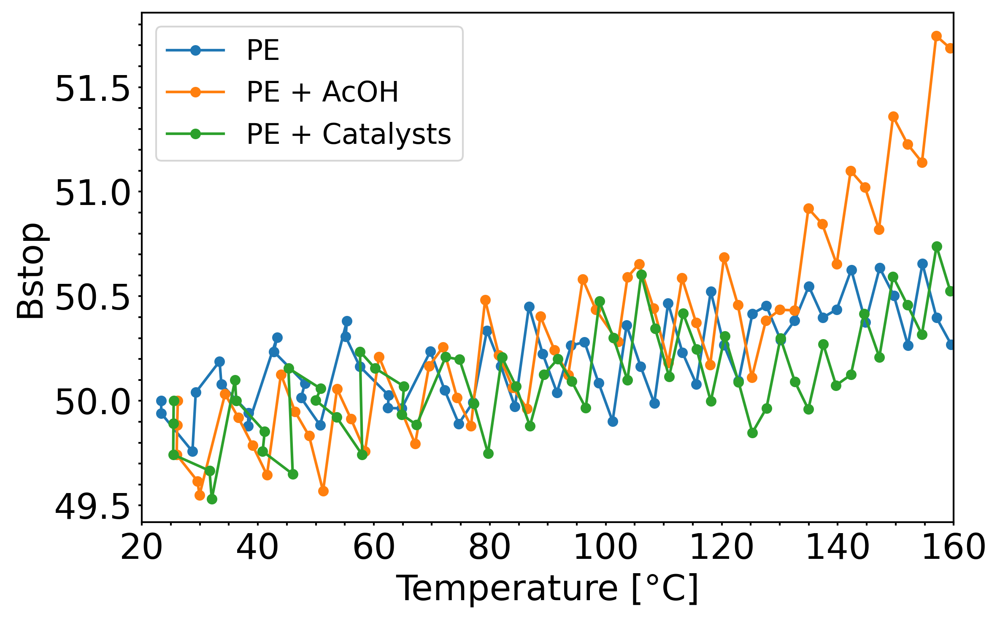

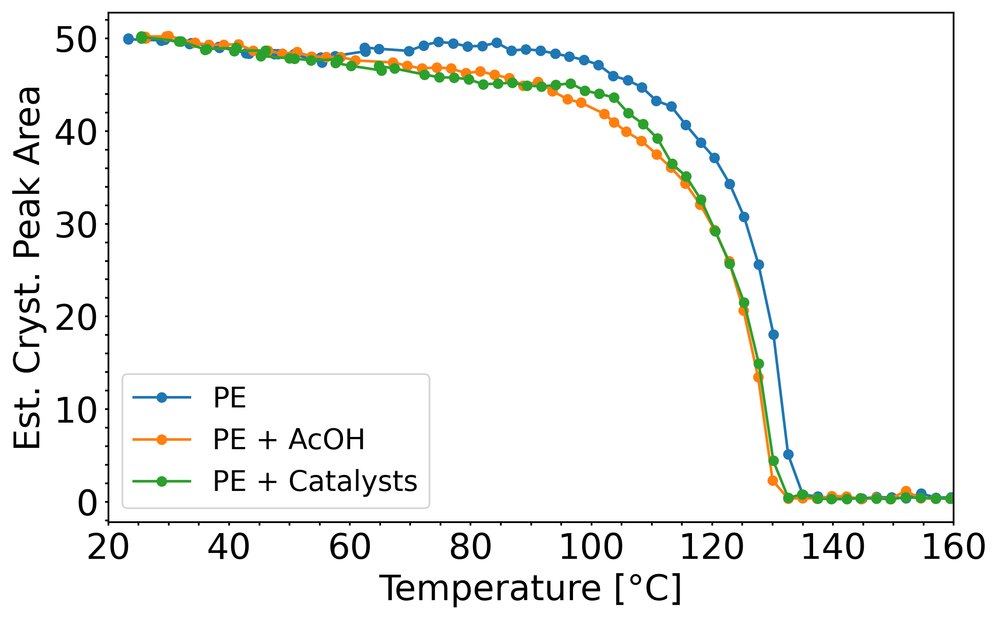

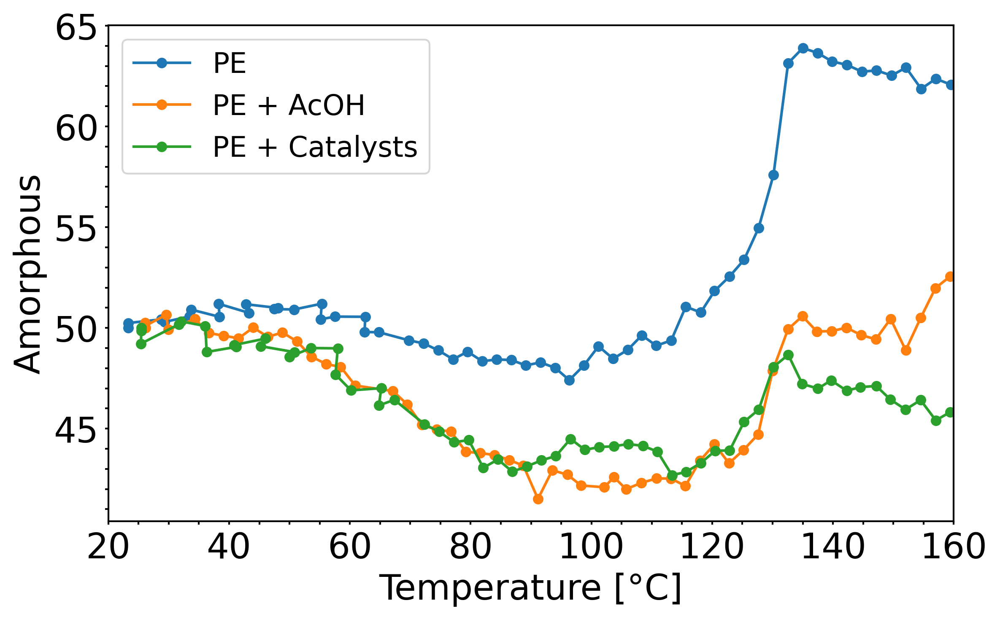

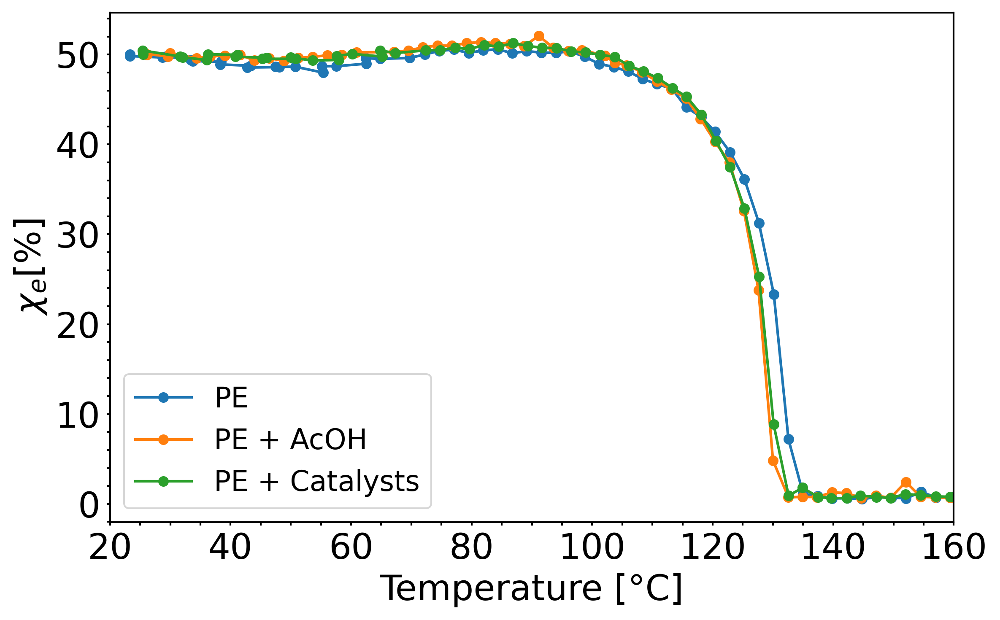

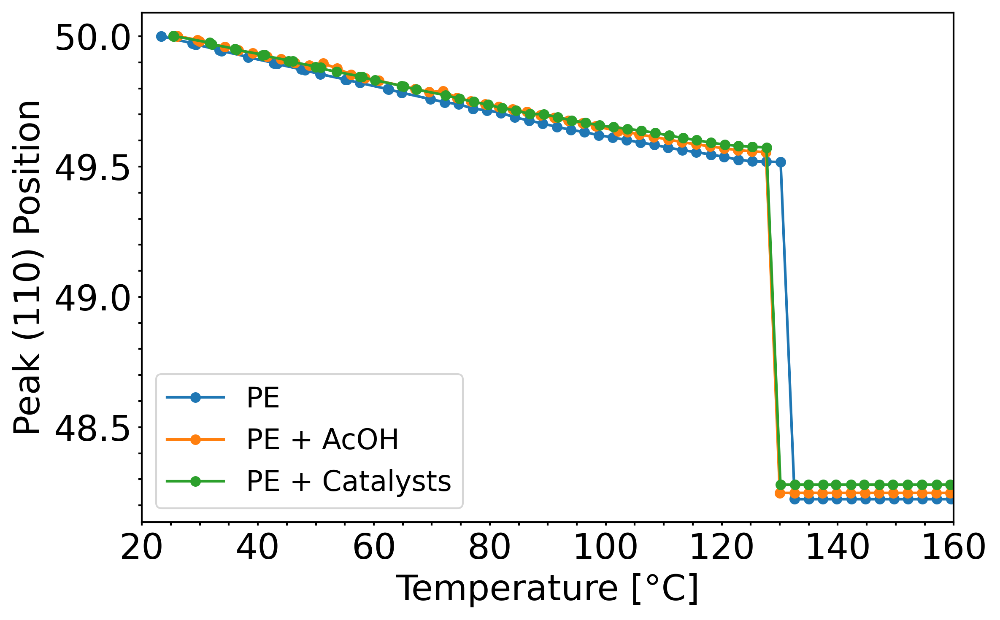

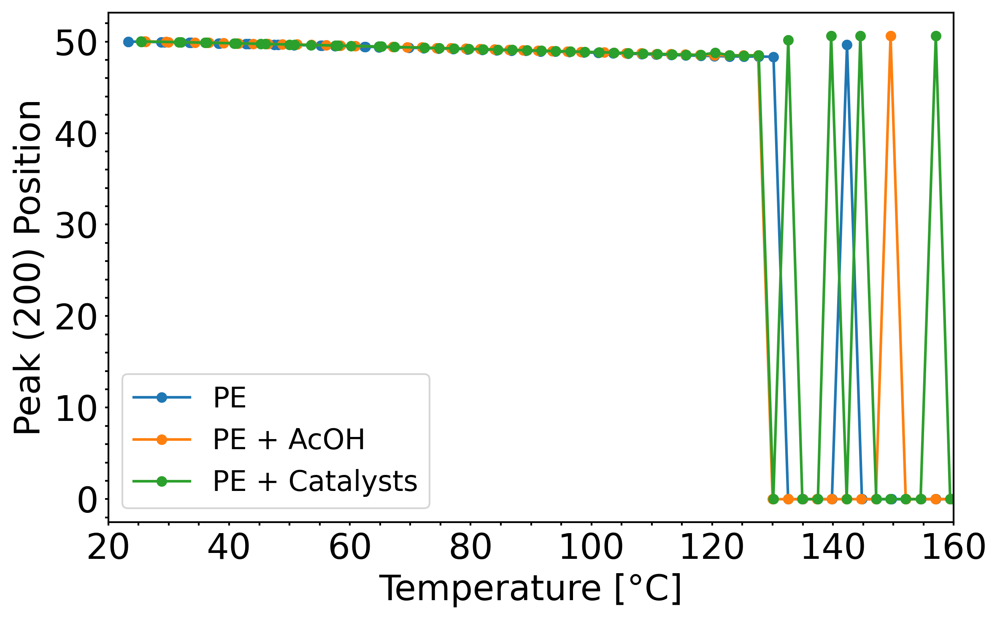

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import numpy as np

# Add custom Python libraries to sys.path (if necessary)
sys.path.append('/Users/akmaurya/Desktop/Python_library')
from SWAXS_functions.set_plot_style import set_plot_style

# Path to the folder containing the .xlsx files
base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01'
folder_path = os.path.join(base_dir, "Analysis/Fitting")
ylabel1 = [
    'CTEMP', 'I0', 'Bstop', 'Est. Cryst. Peak Area', 'Amorphous', 
    r'${\chi_e} [\%]$', 'Peak (110) Position', 'Peak (200) Position'
]  # , r'$d_{(110)}$ Spacing', r'$d_{(200)}$ Spacing']

# Column to use as x-axis
x_col = "CTEMP"

# List all .xlsx files in the folder
xlsx_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".xlsx")])

# sort files Run7, Run6, Run8 keywords in the xlsx fileame
def custom_sort(file_name):
    keywords = ['Run7', 'Run6', 'Run8']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    return keywords.index(keyword_found)

xlsx_files.sort(key=lambda x: custom_sort(x))

# more apealing colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
#colors = 

data_summary = {}

# Iterate through .xlsx files
for file_name in xlsx_files:
    file_path = os.path.join(folder_path, file_name)
    try:
        data = pd.read_excel(file_path, engine='openpyxl')
        print(f"Processing file: {file_name}")
    except Exception as e:
        print(f"Error reading {file_name}: {e}")
        continue
    
    if x_col not in data.columns:
        print(f"Warning: {x_col} not found in {file_name}. Skipping this file.")
        continue
    
    for col in data.columns:
        if col != x_col and 'error' not in col.lower():
            error_col = f"{col}_error"
            if data[col].dtype == 'O' or data[col].apply(lambda x: isinstance(x, str)).any():
                continue
            
            if col not in data_summary:
                data_summary[col] = []
            
            x_values = data[x_col].dropna()
            y_values = data[col].dropna()
            
            error_values = data[error_col].dropna() if error_col in data.columns else np.zeros_like(y_values)
            
            data_summary[col].append((x_values, y_values, error_values, file_name))
j=0 
labels = ['PE', 'PE + AcOH', 'PE + Catalysts']
# Plot each parameter vs CTEMP with filenames as legend
for col, datasets in data_summary.items():
    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
    i =0 

    


    for x_values, y_values, error_values, filename in datasets:

        #normalize the y_values to first value
        y_values = y_values/y_values.iloc[0] * 50
        error_values = error_values/y_values.iloc[0]


        
        label = filename.split('_RampT')[0]  # Use filename without extension as label
        ax.plot(x_values, y_values, 'o-', color = colors[i], label=labels[i], markersize=5)

        #ax.errorbar(x_values, y_values, yerr=error_values, fmt='o-', color = colors[i], label=label, capsize=3)
        i+=1
    #ax.set_title(f"{col} vs {x_col}")
    ax.set_xlabel(x_col)
    ax.set_ylabel(col)
    ax.legend(fontsize=16, loc='best',)#bbox_to_anchor=(1.05, 1))
    #ax.grid(True, linestyle='--', alpha=0.6)

    #ax.set_ylim(-1,100)
    ax.set_xlim(20, 160)
    
    set_plot_style(ax, 20, xlabel='Temperature [°C]', ylabel=ylabel1[j])
    j+=1
    
    plt.tight_layout()
    #plt.savefig(os.path.join(folder_path, f"{col}_vs_{x_col}.png"), dpi=300, bbox_inches='tight')
    plt.show()


## Next

Processing file: Run7_PE_RampT20fitting_results.xlsx
Processing file: Run6_PE_AcOH_RampT20fitting_results.xlsx
Processing file: Run8_PE_Salt_RampT20fitting_results.xlsx


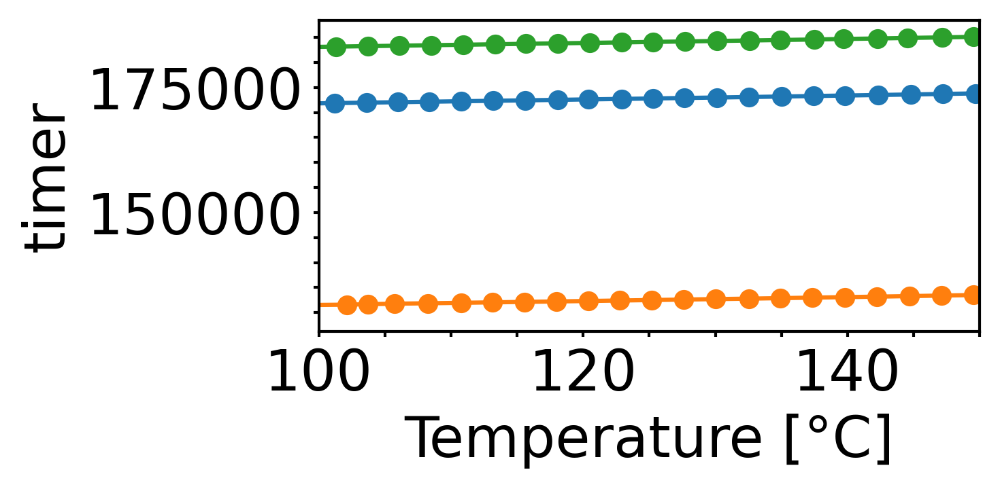

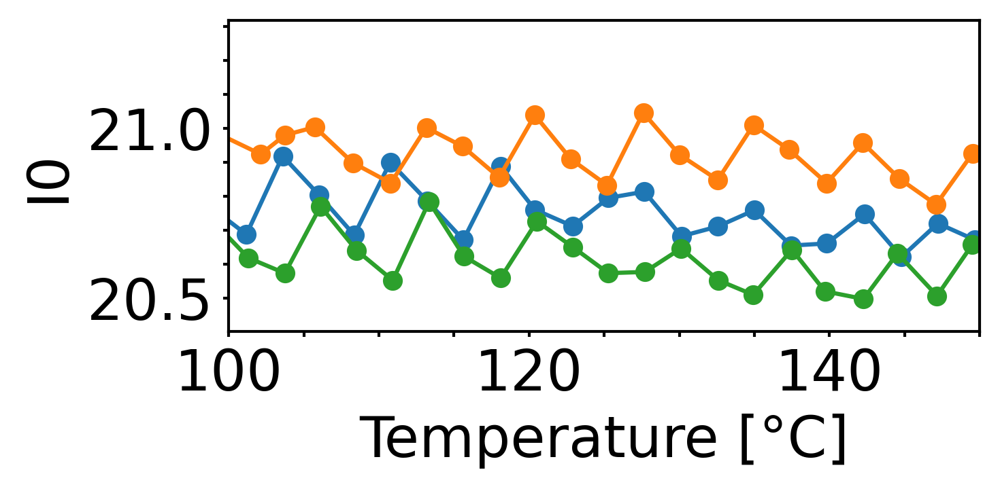

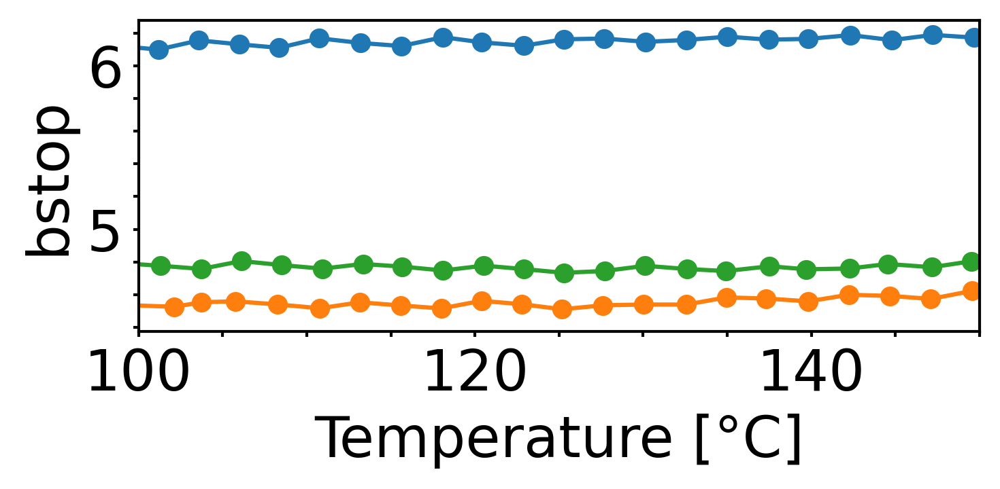

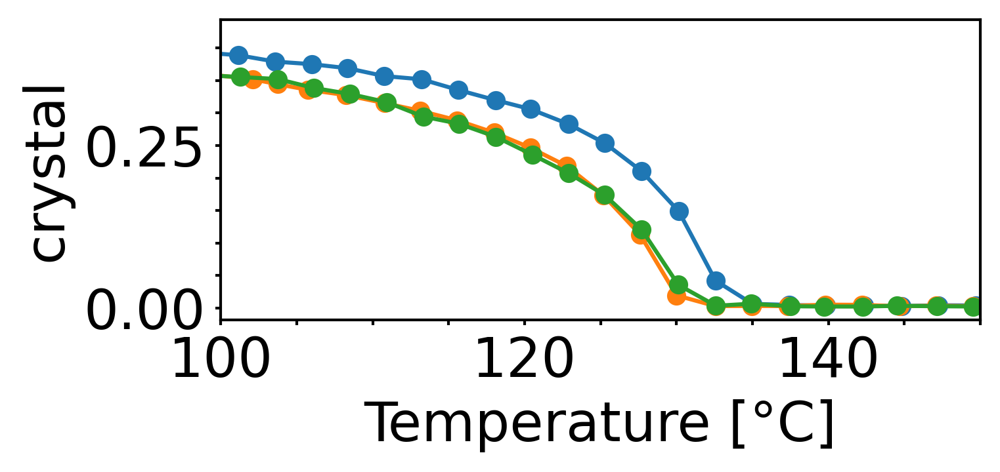

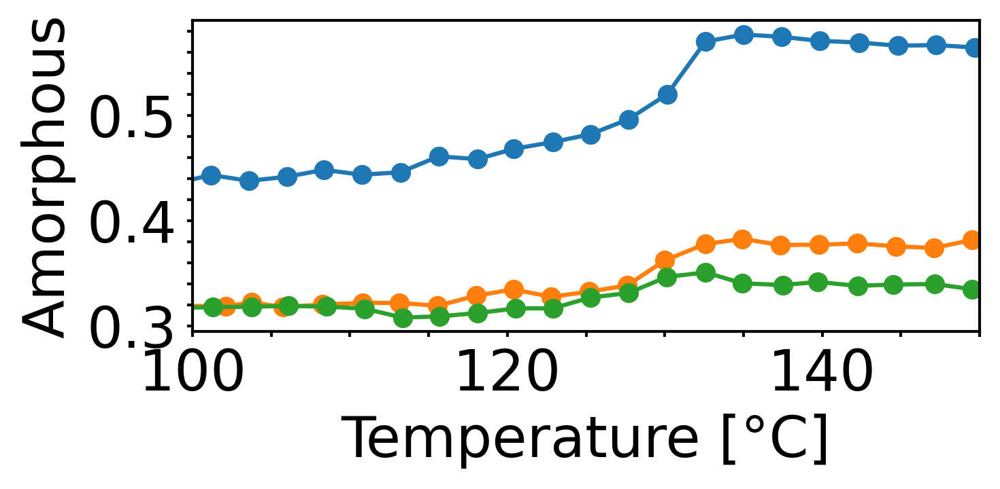

Run7_PE: Melting temperature = 128.95 °C
Run6_PE_AcOH: Melting temperature = 127.48 °C
Run8_PE_Salt: Melting temperature = 127.88 °C


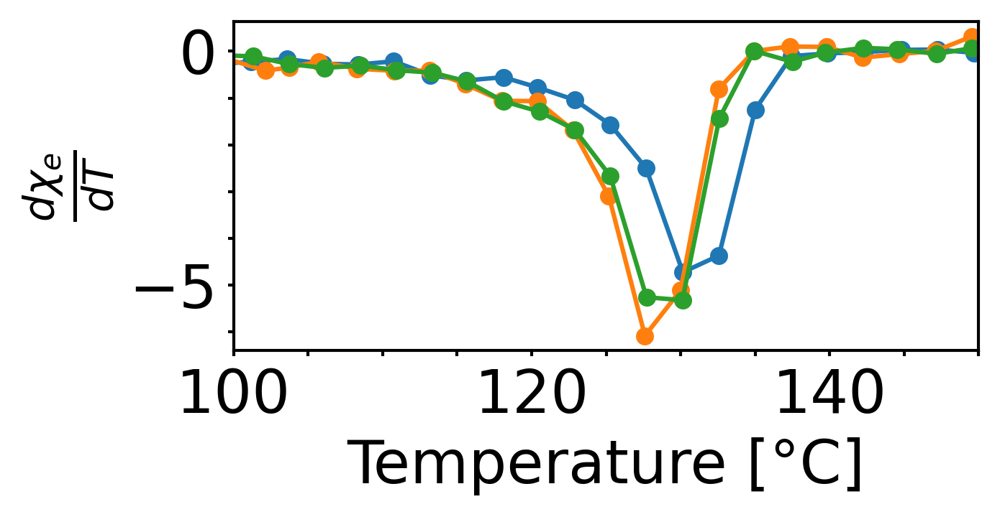

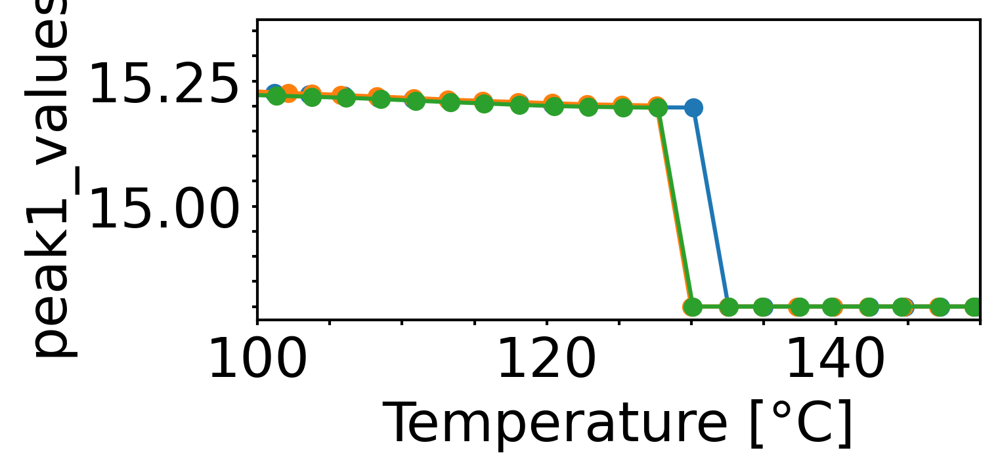

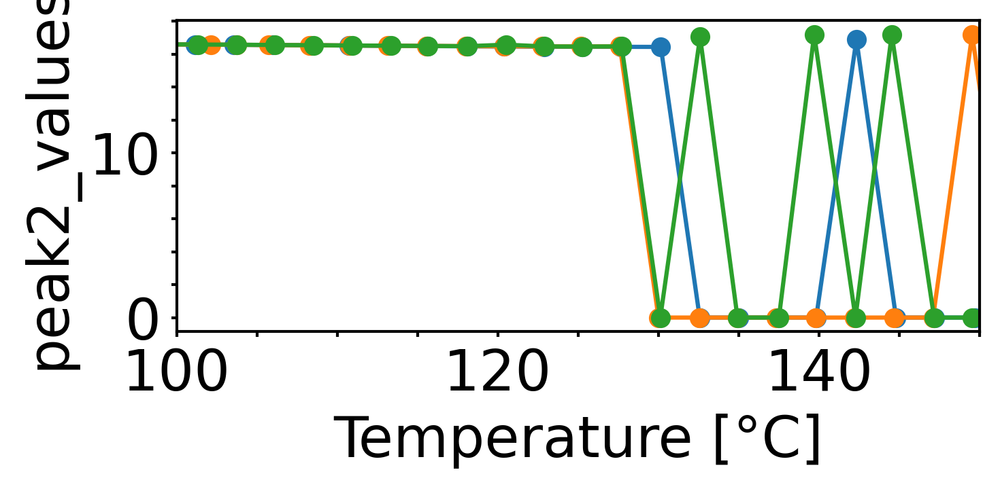

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import numpy as np
from scipy.optimize import curve_fit

# Add custom Python libraries to sys.path (if necessary)
sys.path.append('/Users/akmaurya/Desktop/Python_library')
from SWAXS_functions.set_plot_style import set_plot_style

# Path to the folder containing the .xlsx files
base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01'
folder_path = os.path.join(base_dir, "Analysis/Fitting")

# Column to use as x-axis
x_col = "CTEMP"

# List all .xlsx files in the folder
xlsx_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".xlsx")])

# Sort files based on Run7, Run6, Run8
def custom_sort(file_name):
    keywords = ['Run7', 'Run6', 'Run8']
    keyword_found = next((kw for kw in keywords if kw in file_name), None)
    return keywords.index(keyword_found) if keyword_found else len(keywords)

xlsx_files.sort(key=custom_sort)

# Define appealing colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

data_summary = {}

# Skewed Logistic (Gompertz) derivative function for DSC-like peak
def gompertz_derivative(T, A, T_m, sigma):
    exp_term = np.exp(-(T - T_m) / sigma)
    return (A / sigma) * np.exp(-exp_term) * exp_term

# Iterate through .xlsx files
for file_name in xlsx_files:
    file_path = os.path.join(folder_path, file_name)
    try:
        data = pd.read_excel(file_path, engine='openpyxl')
        print(f"Processing file: {file_name}")
    except Exception as e:
        print(f"Error reading {file_name}: {e}")
        continue
    
    if x_col not in data.columns:
        print(f"Warning: {x_col} not found in {file_name}. Skipping this file.")
        continue
    
    for col in data.columns:
        if col != x_col and 'error' not in col.lower():
            error_col = f"{col}_error"
            if data[col].dtype == 'O' or data[col].apply(lambda x: isinstance(x, str)).any():
                continue
            
            if col not in data_summary:
                data_summary[col] = []
            
            x_values = data[x_col].dropna().values
            y_values = data[col].dropna().values
            error_values = data[error_col].dropna().values if error_col in data.columns else np.zeros_like(y_values)

            data_summary[col].append((x_values, y_values, error_values, file_name))

# Plot each parameter vs CTEMP with filenames as legend
for col, datasets in data_summary.items():
    fig, ax = plt.subplots(figsize=(5, 2.5),dpi=300)

    for i, (x_values, y_values, error_values, filename) in enumerate(datasets):
        label = filename.split('_RampT')[0]

        # Compute derivative if the column is percentage_crytallinity
        if col == 'percentage_crytallinity':
            dydT = np.gradient(y_values, x_values)

            # Fit Gompertz derivative function
            try:
                p0 = [-max(abs(dydT)), 120, 5]  # Initial guess: A, T_m in middle (120°C), sigma ~5
                popt, _ = curve_fit(gompertz_derivative, x_values, dydT, p0=p0)
                A_fit, T_m_fit, sigma_fit = popt
                print(f"{label}: Melting temperature = {T_m_fit:.2f} °C")

                # Generate smooth curve for plotting
                T_smooth = np.linspace(100, 150, 100)  # Focus on melting range
                dydT_fit = gompertz_derivative(T_smooth, *popt)

                # Plot raw derivative data
                ax.plot(x_values[10:], dydT[10:], 'o-', label=f"{label} (data)", markersize=5,color=colors[i % len(colors)])

                # Plot fitted Gompertz curve
                #ax.plot(T_smooth, dydT_fit, '--', label=f"{label} (fit)", color=colors[i % len(colors)])
            except RuntimeError:
                print(f"Could not fit Gompertz function for {label}. Skipping fit.")
                ax.plot(x_values, dydT, 'o-', label=f"{label} (data)", color=colors[i % len(colors)])

        else:
            ax.plot(x_values, y_values, 'o-', label=label, color=colors[i % len(colors)])

    ax.set_xlabel('Temperature [°C]')
    ax.set_ylabel(r'$\frac{d\chi_e}{dT}$' if col == 'percentage_crytallinity' else col) 

    #ax.legend(fontsize=12, loc='best')
    ax.set_xlim(100, 150)  # Focus on melting range

    set_plot_style(ax, 20, xlabel='Temperature [°C]', ylabel=ax.get_ylabel())
    # save the plot



    plt.tight_layout()
    plt.show()


# peak posiiton

Processing file: Run7_PE_RampT20fitting_results.xlsx
Processing file: Run6_PE_AcOH_RampT20fitting_results.xlsx
Processing file: Run8_PE_Salt_RampT20fitting_results.xlsx


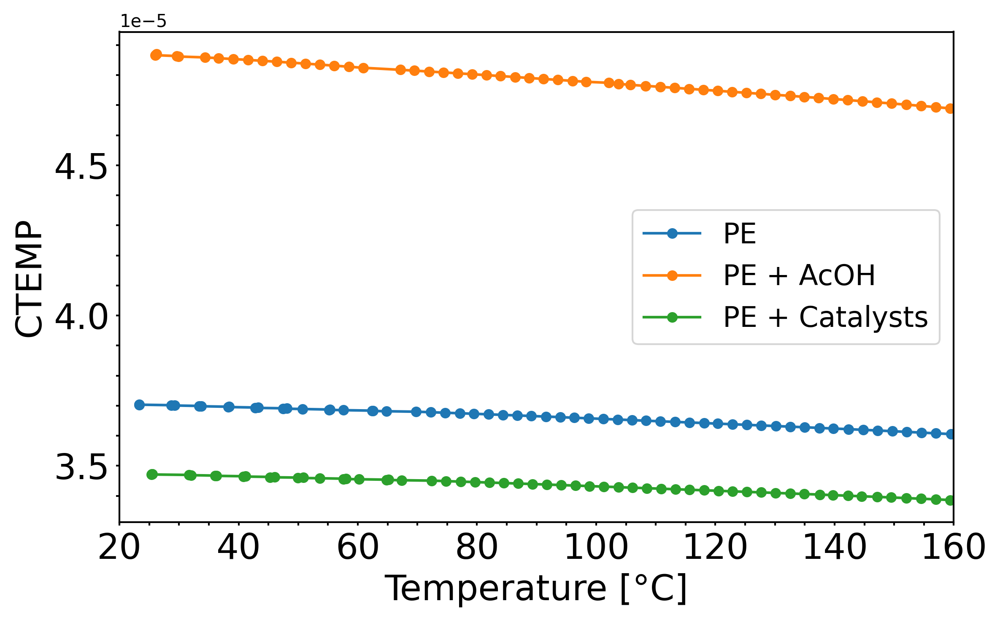

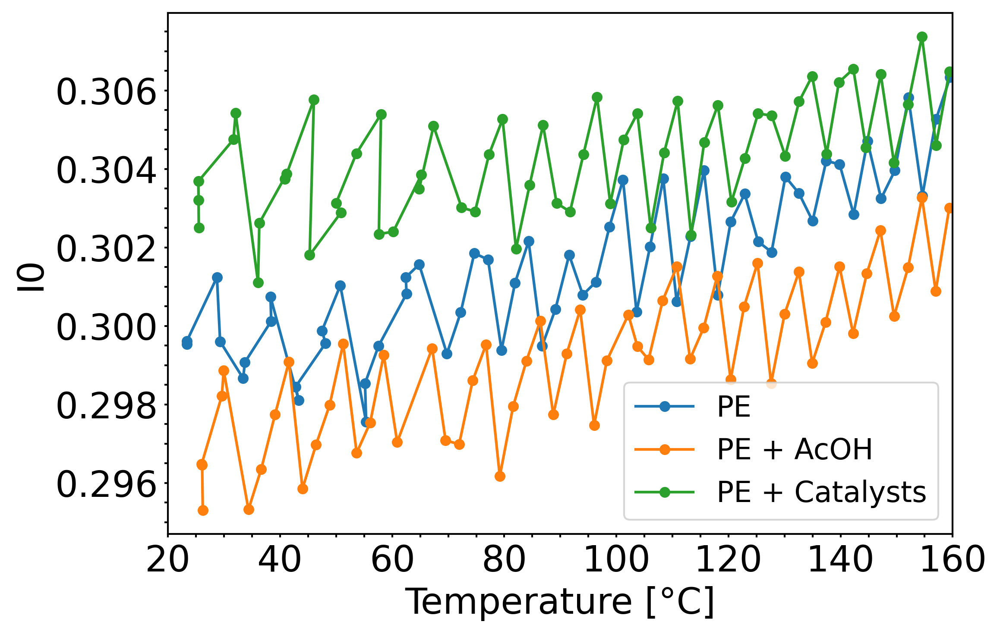

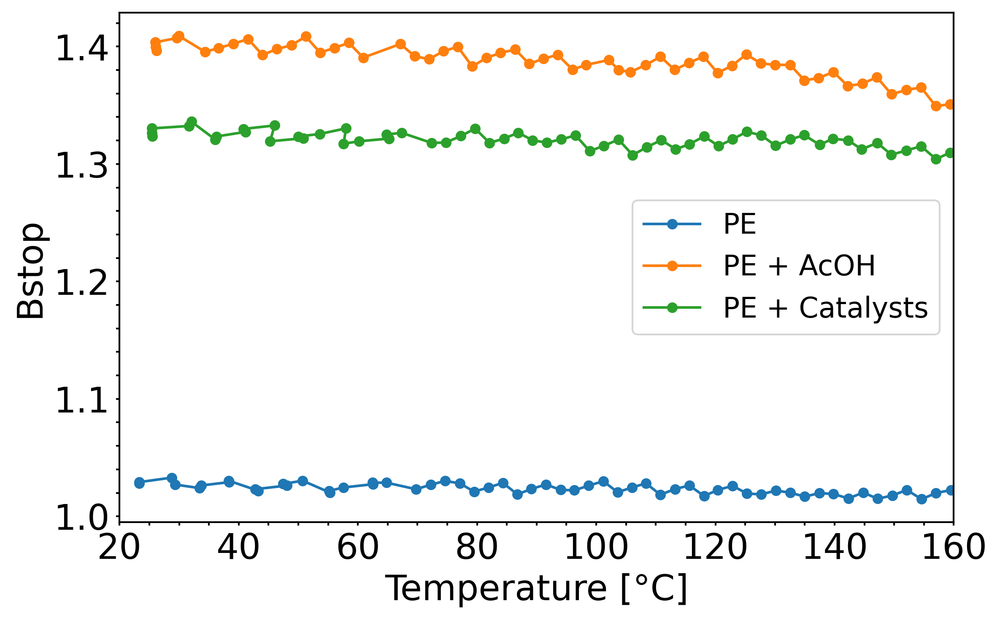

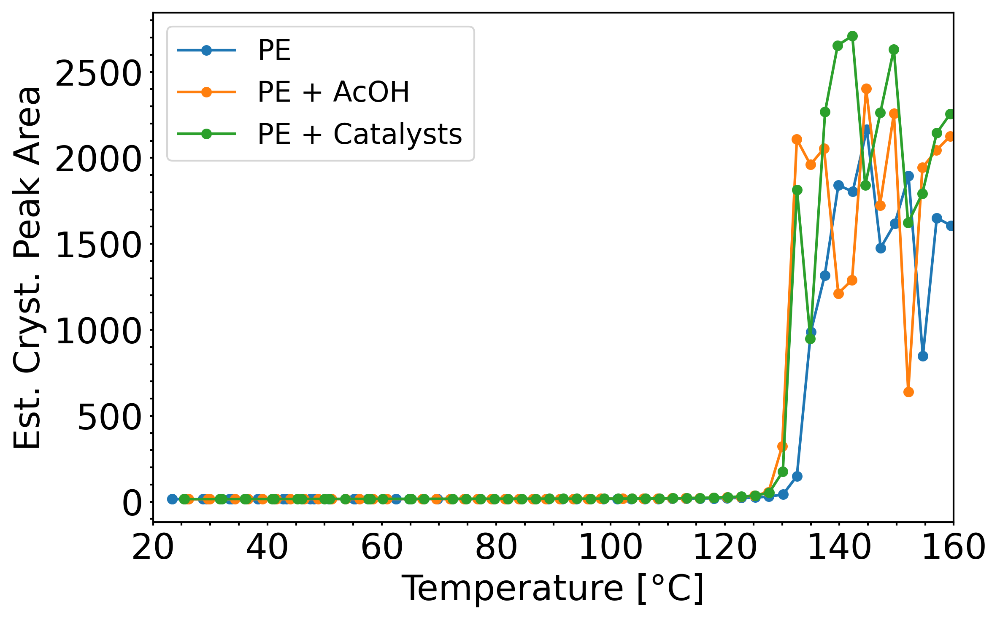

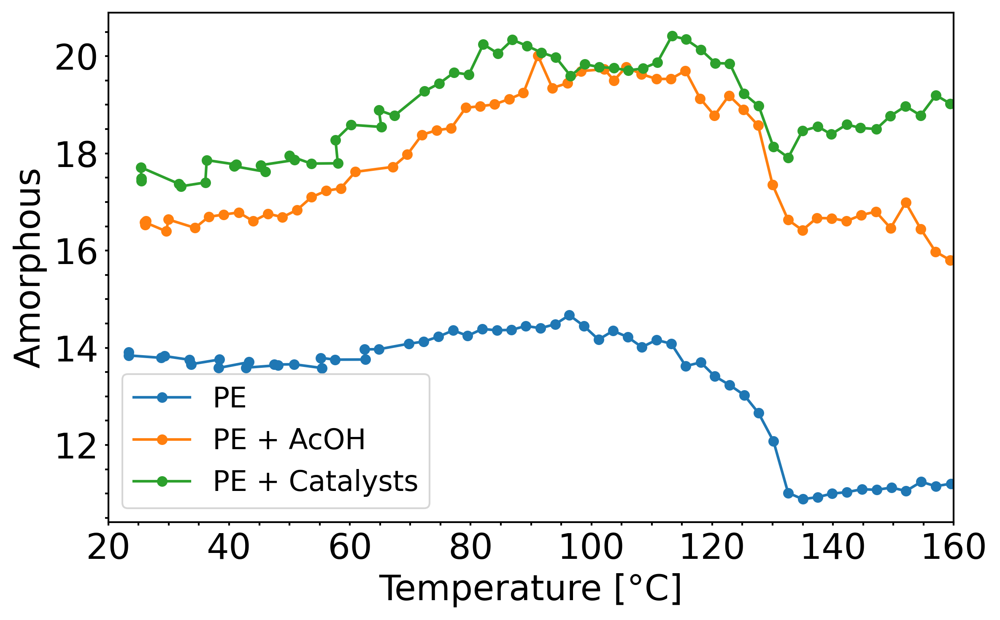

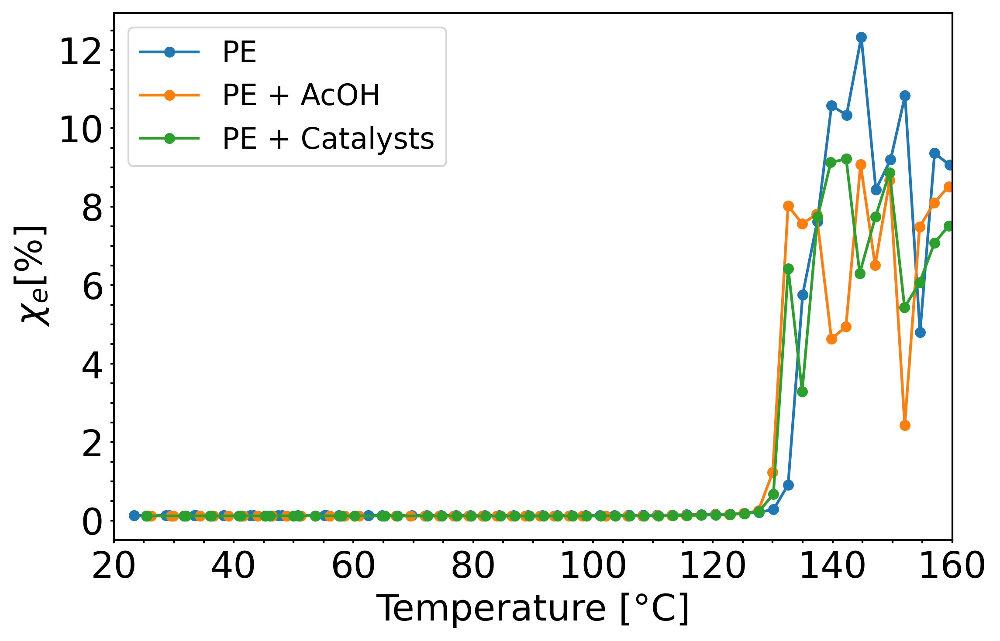

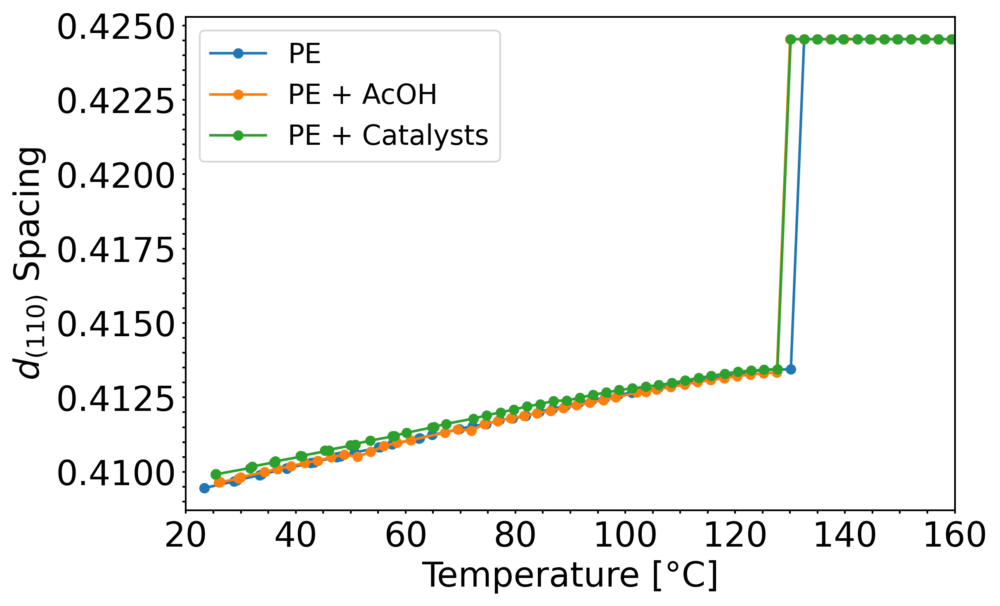

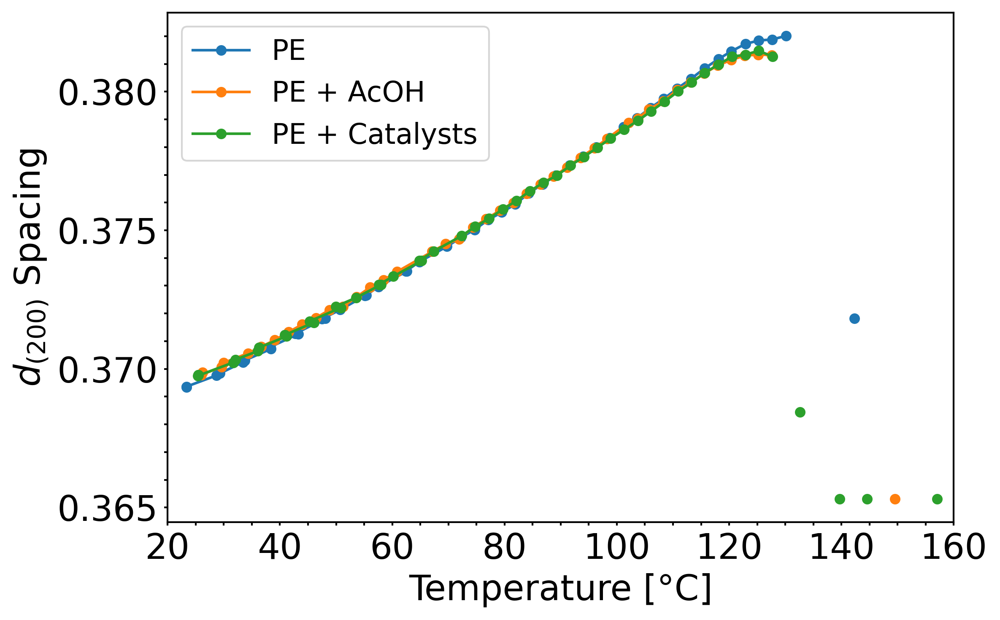

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import numpy as np

# Add custom Python libraries to sys.path (if necessary)
sys.path.append('/Users/akmaurya/Desktop/Python_library')
from SWAXS_functions.set_plot_style import set_plot_style

# Path to the folder containing the .xlsx files
base_dir = '/Users/akmaurya/OneDrive - Stanford/Data_01/Autoxidation/Autoxidation/Jan2025/atT/OneD_integrated_WAXS_01'
folder_path = os.path.join(base_dir, "Analysis/Fitting")
ylabel1 = [
    'CTEMP', 'I0', 'Bstop', 'Est. Cryst. Peak Area', 'Amorphous', 
    r'${\chi_e} [\%]$',  r'$d_{(110)}$ Spacing', r'$d_{(200)}$ Spacing'#'Peak (110) Position', 'Peak (200) Position'
]  # , r'$d_{(110)}$ Spacing', r'$d_{(200)}$ Spacing']

# Column to use as x-axis
x_col = "CTEMP"

# List all .xlsx files in the folder
xlsx_files = sorted([f for f in os.listdir(folder_path) if f.endswith(".xlsx")])

# sort files Run7, Run6, Run8 keywords in the xlsx fileame
def custom_sort(file_name):
    keywords = ['Run7', 'Run6', 'Run8']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    return keywords.index(keyword_found)

xlsx_files.sort(key=lambda x: custom_sort(x))

# more apealing colors
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
#colors = 

data_summary = {}

# Iterate through .xlsx files
for file_name in xlsx_files:
    file_path = os.path.join(folder_path, file_name)
    try:
        data = pd.read_excel(file_path, engine='openpyxl')
        print(f"Processing file: {file_name}")
    except Exception as e:
        print(f"Error reading {file_name}: {e}")
        continue
    
    if x_col not in data.columns:
        print(f"Warning: {x_col} not found in {file_name}. Skipping this file.")
        continue
    
    for col in data.columns:
        if col != x_col and 'error' not in col.lower():
            error_col = f"{col}_error"
            if data[col].dtype == 'O' or data[col].apply(lambda x: isinstance(x, str)).any():
                continue
            
            if col not in data_summary:
                data_summary[col] = []
            
            x_values = data[x_col].dropna()
            y_values = data[col].dropna()
            
            error_values = data[error_col].dropna() if error_col in data.columns else np.zeros_like(y_values)
            
            data_summary[col].append((x_values, y_values, error_values, file_name))
j=0 
labels = ['PE', 'PE + AcOH', 'PE + Catalysts']
# Plot each parameter vs CTEMP with filenames as legend
for col, datasets in data_summary.items():
    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)
    i =0 

    


    for x_values, y_values, error_values, filename in datasets:

        #normalize the y_values to first value
        #y_values = y_values/y_values.iloc[0] * 50
        #error_values = error_values/y_values.iloc[0]


        
        label = filename.split('_RampT')[0]  # Use filename without extension as label
        ax.plot(x_values, 2*np.pi/y_values, 'o-', color = colors[i], label=labels[i], markersize=5)

        #ax.errorbar(x_values, y_values, yerr=error_values, fmt='o-', color = colors[i], label=label, capsize=3)
        i+=1
    #ax.set_title(f"{col} vs {x_col}")
    ax.set_xlabel(x_col)
    ax.set_ylabel(col)
    ax.legend(fontsize=16, loc='best',)#bbox_to_anchor=(1.05, 1))
    #ax.grid(True, linestyle='--', alpha=0.6)

    #ax.set_ylim(0.4,0.42)
    ax.set_xlim(20, 160)
    
    set_plot_style(ax, 20, xlabel='Temperature [°C]', ylabel=ylabel1[j])
    j+=1
    
    plt.tight_layout()
    plt.savefig(os.path.join(folder_path, f"{col}_vs_{x_col}.svg"), dpi=300, bbox_inches='tight')
    plt.show()


#last